# Importar as bibliotecas

In [2]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
import optuna
from optuna.samplers import TPESampler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import hydroeval as he
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import shap
from scipy.stats import kstest
from scipy.stats import ks_2samp
import pickle
import fasttreeshap
import plotly.express as px 

In [3]:
# Parâmetros para reprodutibilidade
np.random.seed(42)

# Obtenção dos Dados

In [4]:
df_2018 = pd.read_csv ('data/series_temporais_tratadas_2018.csv').drop(['Unnamed: 0'],axis=1)
df_2019 = pd.read_csv ('data/series_temporais_tratadas_2019.csv').drop(['Unnamed: 0'],axis=1)
df_2020 = pd.read_csv ('data/series_temporais_tratadas_2020.csv').drop(['Unnamed: 0'],axis=1)
df_2021 = pd.read_csv ('data/series_temporais_tratadas_2021.csv').drop(['Unnamed: 0'],axis=1)
df_2022 = pd.read_csv ('data/series_temporais_tratadas_2022.csv').drop(['Unnamed: 0'],axis=1)
df_2023 = pd.read_csv ('data/series_temporais_tratadas_2023.csv').drop(['Unnamed: 0'],axis=1)
for df in [df_2018,df_2019,df_2020,df_2021,df_2022,df_2023]:
    df['intervalo'] = pd.to_datetime(df['intervalo'])

In [5]:
df_total = pd.DataFrame()
# obs.: em 2021, excluímos um período em que a estação alvo 413 estava com problemas
for df in [df_2018,df_2019,df_2020,df_2021.drop(df_2021.index[3000:4000]),df_2022]:
    df_total = pd.concat([df_total,df], axis = 0)


# Remover estações ruins (descobrimos que a 1000580 não tem nada a ver e a 143 está com problemas em 2021 e 2022)
df_total = df_total.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])

In [6]:
df_total.to_csv('data_tamanduatei_2018_to_2022')

# Funções auxiliares

## Objective function of Random Forest for Optuna

In [7]:
#Define an objective function to be minimized
def objective_rf(trial):
  # Setup values for the hyperparameters:
  n_estimators = trial.suggest_int("n_estimators", low = 50, high = 1000, step = 50)
  max_depth = trial.suggest_int("max_depth", low = 2, high = 20, step = 1)
  min_samples_split = trial.suggest_int("min_samples_split", low = 2, high = 20, step = 1)
  min_samples_leaf = trial.suggest_int("min_samples_leaf", low = 2, high = 20, step = 1)

  regressor = RandomForestRegressor(n_jobs=-1,verbose=0,max_depth=max_depth, n_estimators=n_estimators,min_samples_split=min_samples_split,min_samples_leaf = min_samples_leaf, random_state = 42)

  #Scoring method:
  regressor.fit(X_train, y_train)
  from sklearn.metrics import mean_squared_error as mse
  # getting forecasts for the test set
  predictions = regressor.predict(X_val)
  # computing MSE error
  mse = mse(predictions, y_val)
  rmse = np.sqrt(mse)
  score = rmse
  return score

def run_optuna_rf(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  #optuna.logging.set_verbosity(optuna.logging.INFO)
  optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_rf, n_trials=n_trials)
  trial = study.best_trial
  #print('RMSE: {}'.format(trial.value))
  #print("Best hyperparameters: {}".format(trial.params))
  #optuna.visualization.plot_optimization_history(study)
  #optuna.visualization.plot_slice(study)
  n_estimators = trial.params['n_estimators']
  max_depth = trial.params['max_depth']
  min_samples_split = trial.params['min_samples_split']
  min_samples_leaf = trial.params['min_samples_leaf']
  return trial, n_estimators, max_depth, min_samples_split, min_samples_leaf

## Objective Function of XGBoost for Optuna

In [8]:
#Define an objective function to be minimized
def objective_xgb(trial):
  # Setup values for the hyperparameters:
  # Adapted from https://practicaldatascience.co.uk/machine-learning/how-to-use-optuna-for-xgboost-hyperparameter-tuning
  params = {
        'max_depth': trial.suggest_int('max_depth', 1, 9),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0,log=True),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, 50),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0,log=True),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0,log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0,log=True),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 1.0,log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 1.0,log=True),
        'eval_metric': 'rmse'
    }

  regressor = xgb.XGBRegressor(objective = "reg:squarederror",random_state = 42,**params)
  regressor.fit(X_train, y_train)
  #Scoring method:
  from sklearn.metrics import mean_squared_error as mse
  # getting forecasts for the test set
  predictions = regressor.predict(X_val)
  # computing MSE error
  mse = mse(predictions, y_val)
  rmse = np.sqrt(mse)
  score = rmse
  return score

def run_optuna_xgb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_xgb, n_trials=n_trials)
  trial = study.best_trial
  #print('RMSE: {}'.format(trial.value))
  #print("Best hyperparameters: {}".format(trial.params))
  #optuna.visualization.plot_optimization_history(study)
  #optuna.visualization.plot_slice(study)
  max_depth = trial.params['max_depth']
  learning_rate = trial.params['learning_rate']
  n_estimators = trial.params['n_estimators']
  min_child_weight = trial.params['min_child_weight']
  gamma = trial.params['gamma']
  subsample = trial.params['subsample']
  colsample_bytree = trial.params['colsample_bytree']
  reg_alpha = trial.params['reg_alpha']
  reg_lambda = trial.params['reg_lambda']
  return trial, max_depth, learning_rate , n_estimators, min_child_weight, gamma,subsample, colsample_bytree, reg_alpha, reg_lambda

## Objective Function of LightGBM for Optuna

In [9]:
#Define an objective function to be minimized
# Adapted from https://forecastegy.com/posts/how-to-use-optuna-to-tune-lightgbm-hyperparameters/
def objective_lgb(trial):
    params = {
        "objective": "regression",
        "metric": "rmse",
        "n_estimators": trial.suggest_int('n_estimators', 50, 1000, 50),
        "verbosity": -1,
        "bagging_freq": 1,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 2**10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }

    regressor = lgb.LGBMRegressor(random_state = 42,**params)
    regressor.fit(X_train, y_train)
    #Scoring method:
    from sklearn.metrics import mean_squared_error as mse
    # getting forecasts for the test set
    predictions = regressor.predict(X_val)
    # computing MSE error
    mse = mse(predictions, y_val)
    rmse = np.sqrt(mse)
    score = rmse
    return score

def run_optuna_lgb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_lgb, n_trials=n_trials)
  trial = study.best_trial
  n_estimators = trial.params['n_estimators']
  learning_rate = trial.params['learning_rate']
  num_leaves = trial.params['num_leaves']
  subsample = trial.params['subsample']
  colsample_bytree = trial.params['colsample_bytree']
  min_data_in_leaf = trial.params['min_data_in_leaf']
  return trial, n_estimators, learning_rate ,num_leaves, subsample, colsample_bytree,min_data_in_leaf

## Objective Function of Catboost for Optuna

In [10]:
def objective_cb(trial):
    params = {
        "iterations": trial.suggest_int('iterations', 50, 1000, 50),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }

    regressor = cb.CatBoostRegressor(loss_function= 'RMSE',random_state = 42,silent=True,**params)
    regressor.fit(X_train, y_train)
    #Scoring method:
    from sklearn.metrics import mean_squared_error as mse
    # getting forecasts for the test set
    predictions = regressor.predict(X_val)
    # computing MSE error
    mse = mse(predictions, y_val)
    rmse = np.sqrt(mse)
    score = rmse
    return score

def run_optuna_cb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_cb, n_trials=n_trials)
  trial = study.best_trial
  iterations = trial.params['iterations']
  learning_rate = trial.params['learning_rate']
  depth = trial.params['depth']
  subsample = trial.params['subsample']
  colsample_bylevel = trial.params['colsample_bylevel']
  min_data_in_leaf = trial.params['min_data_in_leaf']
  return trial, iterations, learning_rate ,depth, subsample, colsample_bylevel,min_data_in_leaf

## Fit e evaluate

In [11]:
def training_rf(X_train,y_train,random_state = 42):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=random_state)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_xgb(X_train, y_train,random_state = 42):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=random_state)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_lgb(X_train, y_train,random_state = 42):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=random_state,verbose = 0)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_cb(X_train,y_train,random_state = 42):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=random_state,verbose = 0)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances


def predictions(X_train,y_train,X_val,y_val,model):
    prediction = model.predict(X_val)
    mse = mean_squared_error(prediction, y_val)
    rmse = np.sqrt(mse)
    nse = he.evaluator(he.nse, prediction, y_val)
    nse = nse[0]
    prediction_train = model.predict(X_train)
    mse_train = mean_squared_error(prediction_train, y_train)
    rmse_train = np.sqrt(mse_train)
    nse_train = he.evaluator(he.nse, prediction_train, y_train)
    nse_train = nse_train[0]

    # print("Root mean squared error (RMSE) on train set: {:.4f}".format(rmse_train))
    # print(f"Nash-Sutcliffe-Efficience (NSE) on train set: {nse_train}")
    # print("Root mean squared error (RMSE) on test set: {:.4f}".format(rmse))
    # print(f"Nash-Sutcliffe-Efficience (NSE) on test set: {nse}")

    return prediction, rmse, nse


def plot_results(prediction,y_val,nse):
    plt.figure(figsize=(20, 10))
    plt.plot(prediction,color='orange',label='predicted')
    plt.plot(y_val,label='actual')
    plt.title(f'Actual and predicted river level at station 413 for the test set, NSE = {nse}',fontsize=18)
    plt.ylabel('River level (cm)',fontsize=14)
    plt.xlabel('Time stamp',fontsize=14)
    plt.legend()

    plt.figure(figsize=(6,6))
    plt.scatter(y_val, prediction, c='r',s=5)
    p1 = max(max(prediction), max(y_val))
    p2 = min(min(prediction), min(y_val))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('Actual', fontsize=15)
    plt.ylabel('Predicted', fontsize=15)
    plt.axis('equal')

## Time Delay Embedding

In [12]:
def time_delay_embedding(series: pd.Series, n_lags: int, horizon: int):
    """
    Time delay embedding
    Time series for supervised learning
    :param series: time series as pd.Series
    :param n_lags: number of past values to used as explanatory variables
    :param horizon: how many values to forecast
    :return: pd.DataFrame with reconstructed time series
    """
    assert isinstance(series, pd.Series)

    if series.name is None:
        name = 'Series'
    else:
        name = series.name

    n_lags_iter = list(range(n_lags, -horizon, -1))

    X = [series.shift(i) for i in n_lags_iter]
    X = pd.concat(X, axis=1).dropna()
    X.columns = [f'{name}(t-{j - 1})'
                 if j > 0 else f'{name}(t+{np.abs(j) + 1})'
                 for j in n_lags_iter]

    return X

## Preparação dos Conjuntos de Treinament/Validação/Teste

In [13]:
def preparar_dataframes(dataframes_treinamento, dataframes_validacao, dataframes_teste,horizon=12, n_lags = 12):
  # Conjunto de treinamento
  df_treinamento = pd.DataFrame()
  dataframes = dataframes_treinamento

  for df in dataframes:
    train = df
    train = train.set_index(['intervalo'])

    # create data set with lagged features using time delay embedding
    train_ds = []
    for col in train:
      col_df = time_delay_embedding(train[col], n_lags=n_lags, horizon=horizon)
      train_ds.append(col_df)

    # Concatenating all variables
    train_df = pd.concat(train_ds, axis=1)

    df_treinamento = pd.concat([df_treinamento, train_df])
  train_df = df_treinamento

  # Conjunto de validação
  df_validacao = pd.DataFrame()
  dataframes = dataframes_validacao

  for df in dataframes:
    val = df
    val = val.set_index(['intervalo'])
    # create data set with lagged features using time delay embedding
    val_ds = []
    for col in val:
      col_df = time_delay_embedding(val[col], n_lags=n_lags, horizon=horizon)
      val_ds.append(col_df)

    # Concatenating all variables
    val_df = pd.concat(val_ds, axis=1)

    df_validacao = pd.concat([df_validacao, val_df])
  val_df = df_validacao

  # Conjunto de teste
  df_teste = pd.DataFrame()
  dataframes = dataframes_teste

  for df in dataframes:
    test = df
    test = test.set_index(['intervalo'])
    # create data set with lagged features using time delay embedding
    test_ds = []
    for col in val:
      col_df = time_delay_embedding(test[col], n_lags=n_lags, horizon=horizon)
      test_ds.append(col_df)

    # Concatenating all variables
    test_df = pd.concat(test_ds, axis=1)

    df_teste = pd.concat([df_teste, test_df])
  test_df = df_teste
  return train_df, val_df, test_df

In [14]:
def gerar_conjuntos(train_df,val_df,test_df,horizon=12):
  # Defining target (Y) and explanatory variables (X)
  predictor_variables = train_df.columns.str.contains('-')
  target_variables = train_df.columns.str.contains(f'valor_leitura_flu_413(t+{horizon}',regex=False)

  X_train = train_df.iloc[:, predictor_variables]
  y_train = train_df.iloc[:, target_variables]

  X_val = val_df.iloc[:, predictor_variables]
  y_val = val_df.iloc[:, target_variables]
  
  X_test = test_df.iloc[:, predictor_variables]
  y_test = test_df.iloc[:, target_variables]

  return X_train,y_train,X_val,y_val,X_test,y_test

In [15]:
# Versão usada para o experimento de previsão da série temporal de diferenças]
def gerar_conjuntos_v2(train_df,val_df,test_df,horizon=12):
  
  # Defining target (Y) and explanatory variables (X)
  predictor_variables = train_df.columns.str.contains('-')
  target_variables = train_df.columns.str.contains('valor_leitura_flu_413_diff(t+',regex=False)

  X_train = train_df.iloc[:, predictor_variables]
  y_train = train_df.iloc[:, target_variables]
  
  X_val = val_df.iloc[:, predictor_variables]
  y_val = val_df.iloc[:, target_variables]
  
  X_test = test_df.iloc[:, predictor_variables]
  y_test = test_df.iloc[:, target_variables]

  return X_train,y_train,X_val,y_val,X_test,y_test

## Plot importâncias

In [16]:
def plot_importances(importances,feature_names,n_features_show):
    indices = np.argsort(importances)[::-1]
    plt.figure(figsize=(8, 4))
    plt.title("Feature importances")
    plt.bar(range(n_features_show), importances[indices[0:n_features_show]],
            color="b", align="center")
    plt.xticks(range(n_features_show), feature_names[indices[0:n_features_show]], rotation='vertical')
    plt.xlim([-1, n_features_show])

# Experimentos

# Comparações entre RF, XGB, LGB, CB

## Exp. 5 - Markoviano (com treino em 2018/2019 e validação em 2020)

In [79]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [80]:
entradas = []
entradas.append('valor_leitura_flu_413(t-0)')
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    entradas.append(nome)


X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [54]:
feature_names = X_train_general[entradas].columns

Average of RMSE: 44.58802231531906
Average of NSE: 0.8098126842417253


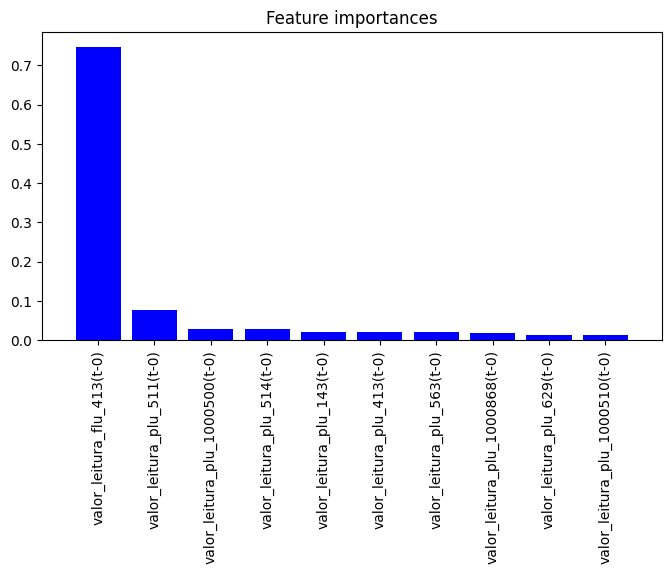

In [55]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 10)

In [56]:
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X_val)

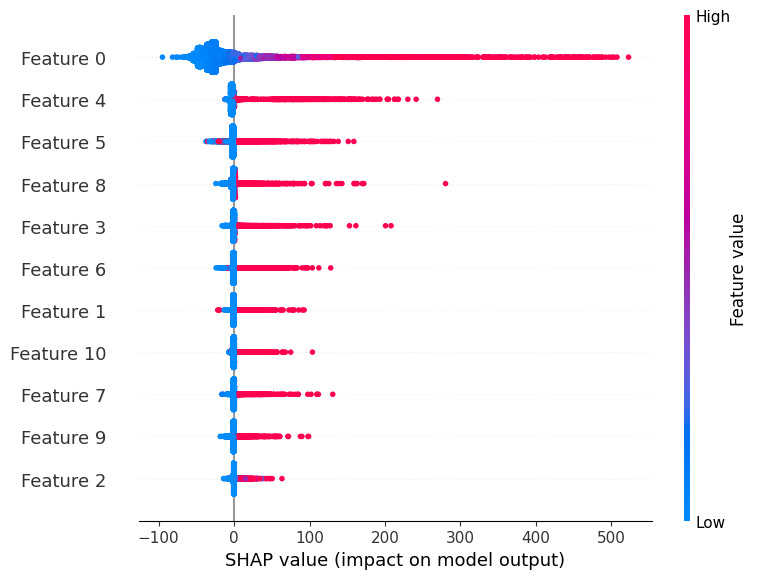

In [57]:
shap.summary_plot(shap_values, X_val)

In [60]:
explainer = shap.Explainer(model,algorithm='tree')
shap_values = explainer.shap_values(X_val)

In [ ]:
shap.summary_plot(shap_values, X_val)

In [87]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 10)

Average of RMSE: 44.39246427709734
Average of NSE: 0.8114773060407817


In [88]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 10)

Average of RMSE: 43.24613544179031
Average of NSE: 0.8210878899795528


In [89]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 10)

Average of RMSE: 42.8902341262595
Average of NSE: 0.8240205470785541


## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e teste em 2021/2022) - para horizonte de 30 minutos

### Usando todas as features

In [31]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 3)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [32]:
feature_names = X_train_general.columns

Average of RMSE: 13.769650622905157
Average of NSE: 0.9734990717790123


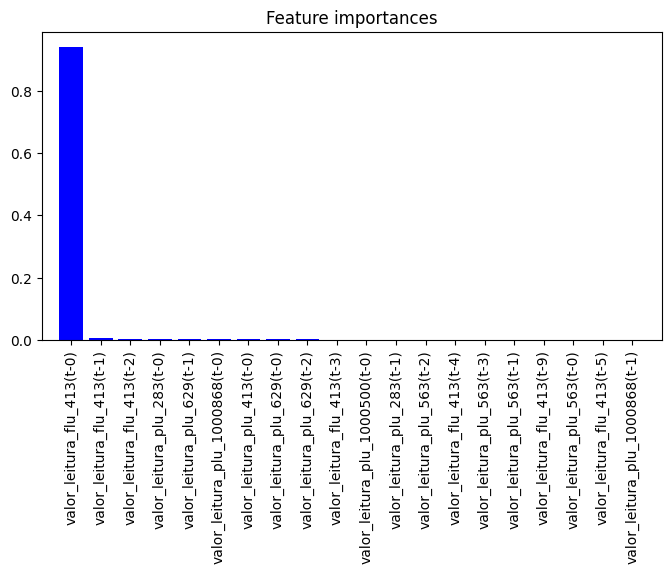

In [33]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 14.01413830697349
Average of NSE: 0.9725496401372282


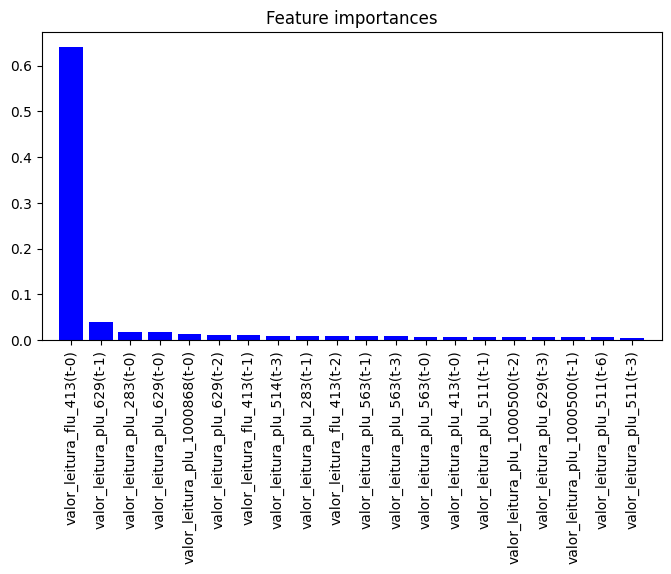

In [34]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 13.109344966989035
Average of NSE: 0.9759797663546649


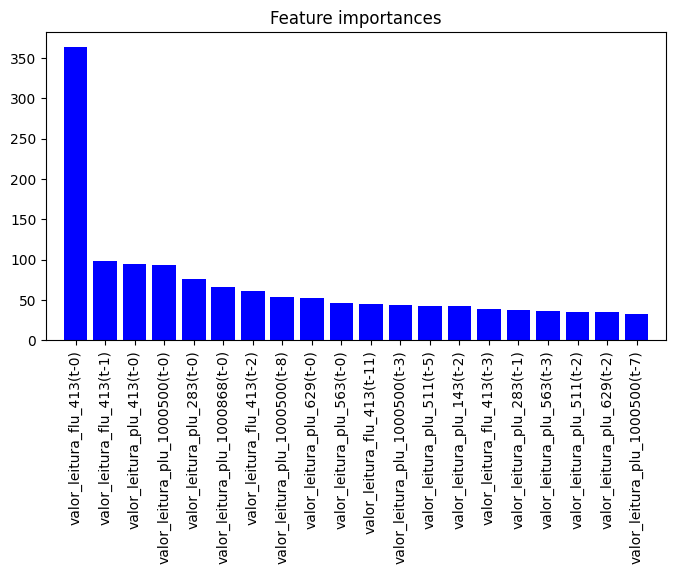

In [35]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 12.919274584088317
Average of NSE: 0.976671248274118


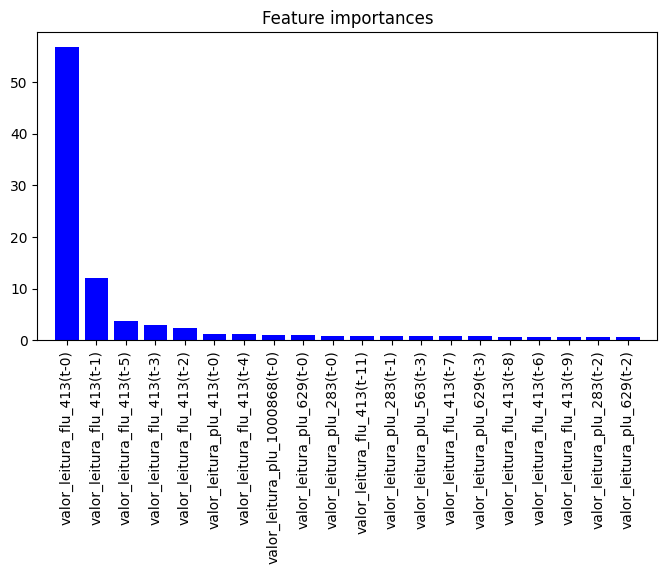

In [36]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e teste em 2021/2022) - para horizonte de 1 hora

### Usando todas as features

In [22]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 6)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [23]:
feature_names = X_train_general.columns

Average of RMSE: 25.712493850941005
Average of NSE: 0.9075939146297434


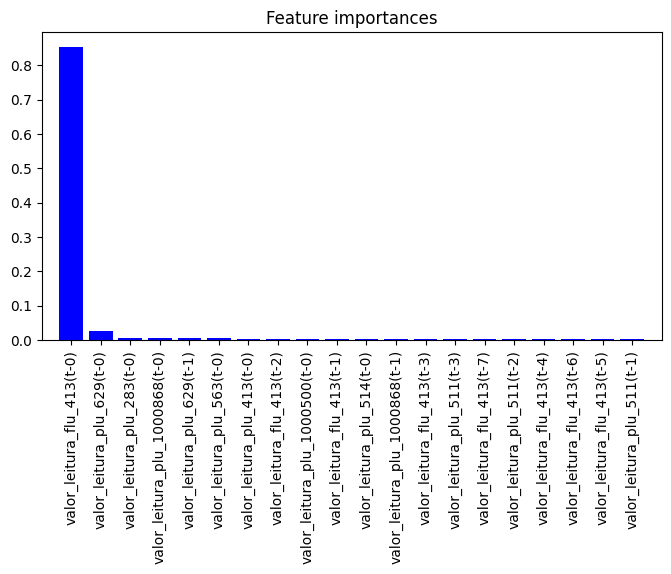

In [24]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 25.604527118674117
Average of NSE: 0.9083683114569316


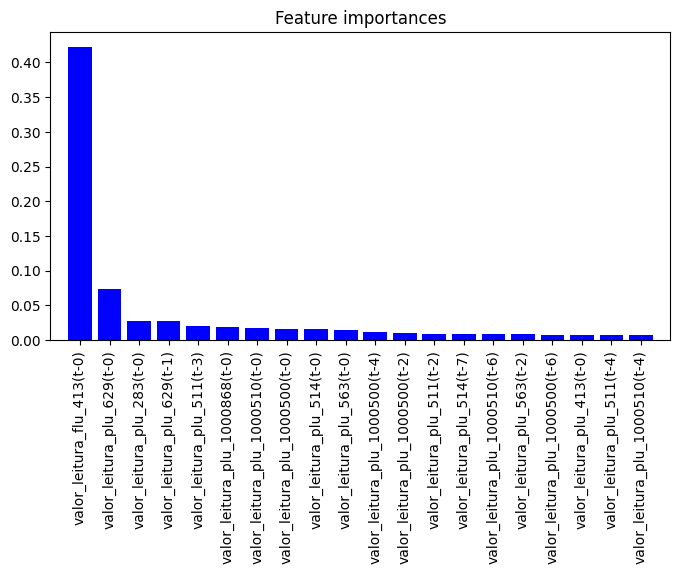

In [28]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 23.260000843788863
Average of NSE: 0.9243808792988948


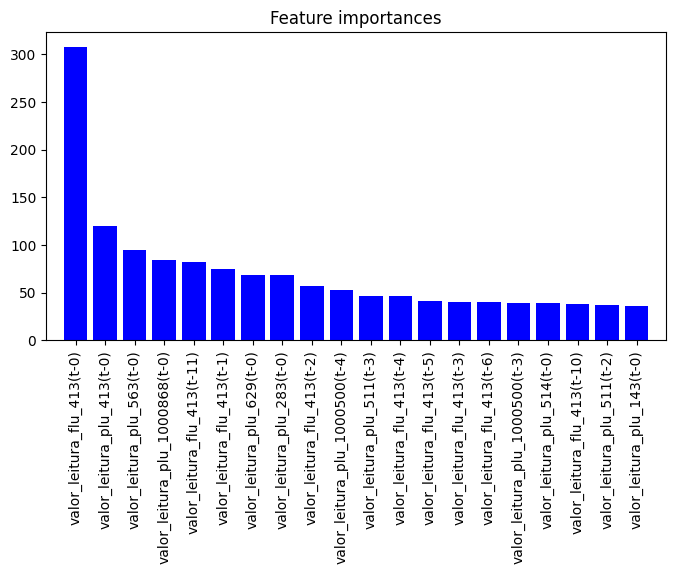

In [29]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 22.752146751452994
Average of NSE: 0.9276469353327169


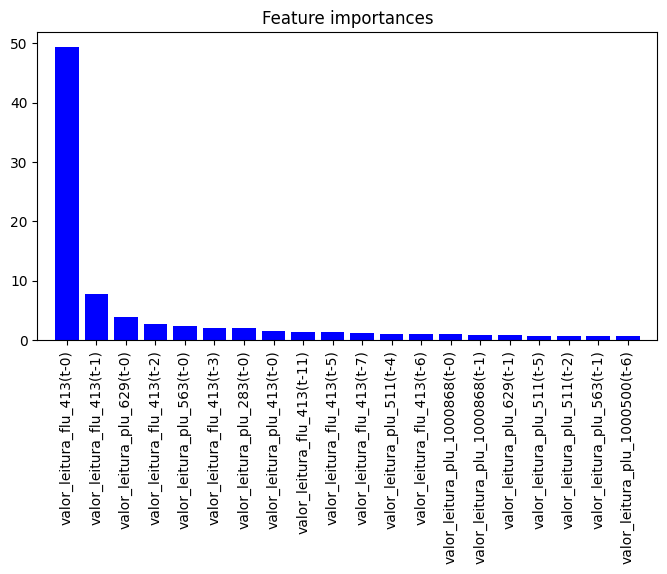

In [30]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e teste em 2021/2022) - usando pluviômetros e estação 1000610

### Pluviômetros e exutório

In [129]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019,df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 12)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [130]:
feature_names = X_train_general.columns

Average of RMSE: 41.774664099357345
Average of NSE: 0.7560888433469741


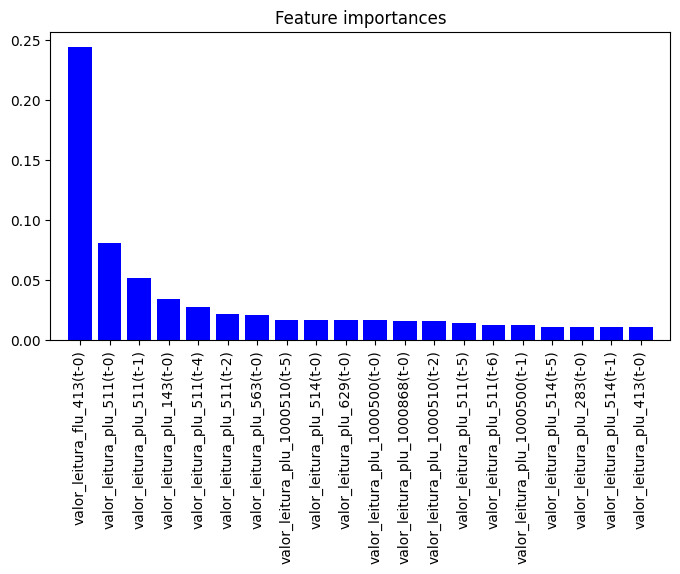

In [131]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

### Pluviômetros e exutório e estação 1000610

In [132]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019,df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 12)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome) or ('valor_leitura_flu_1000610' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [133]:
feature_names = X_train_general.columns

Average of RMSE: 42.12751087915272
Average of NSE: 0.7519510851279669


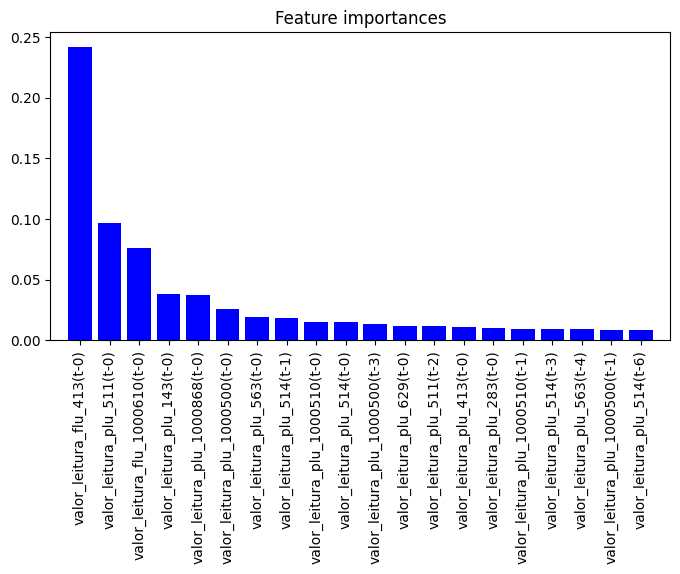

In [134]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020) - para horizonte de 1 hora

### Usando todas as features

In [83]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 6)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

Average of RMSE: 24.125021668474947
Average of NSE: 0.9443249744067694


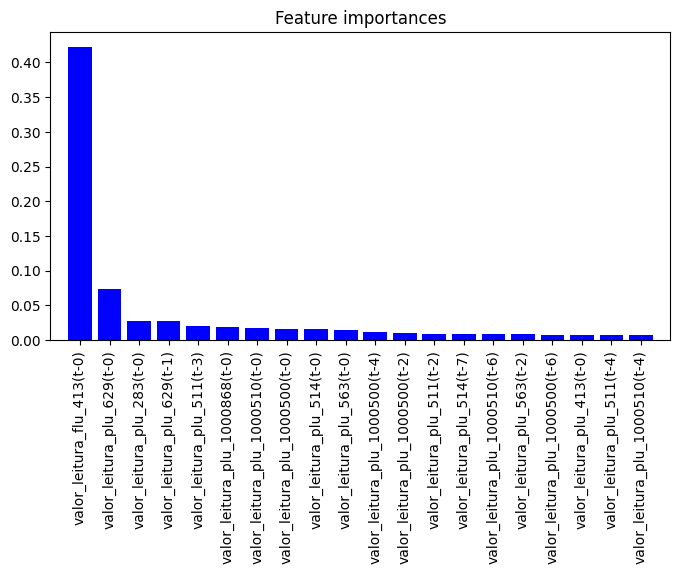

In [84]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [85]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

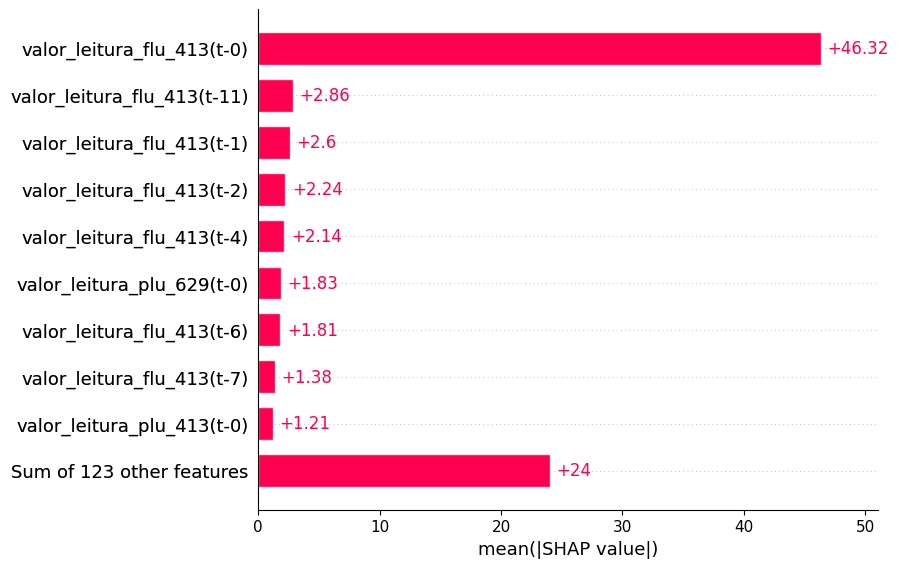

In [86]:
shap.plots.bar(shap_values)

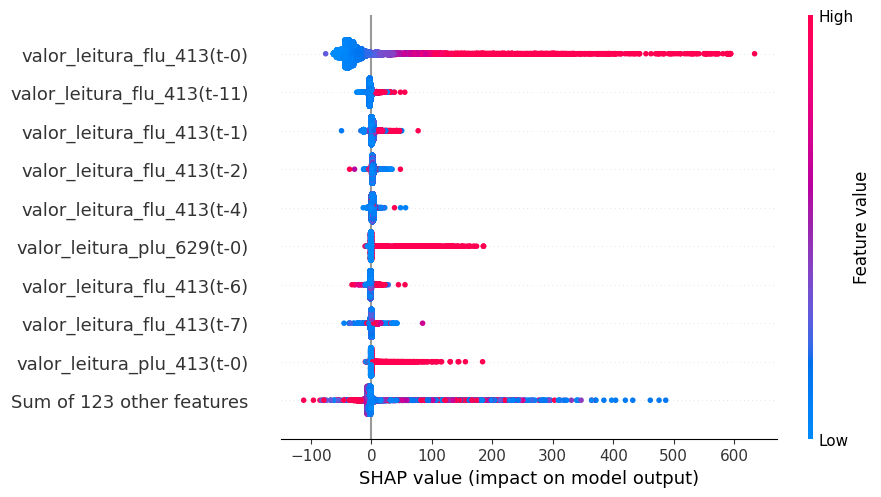

In [87]:
shap.plots.beeswarm(shap_values)

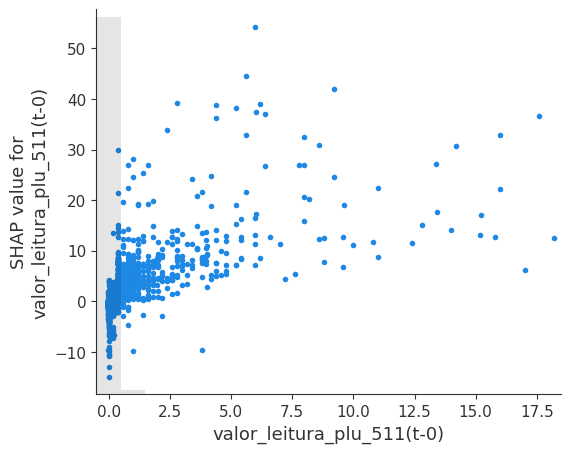

In [88]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

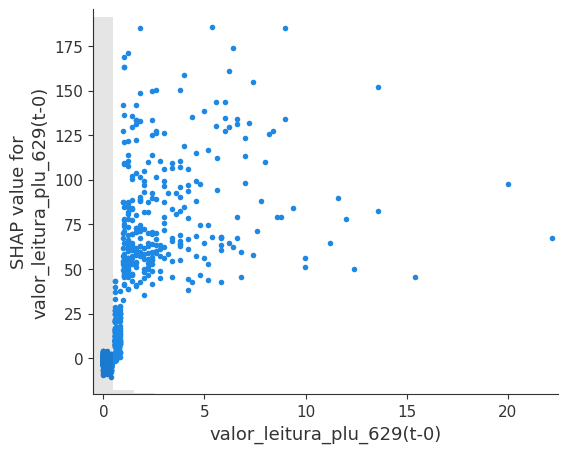

In [89]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

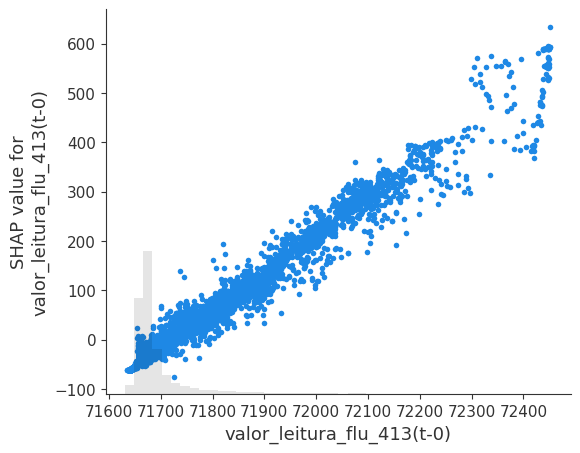

In [90]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

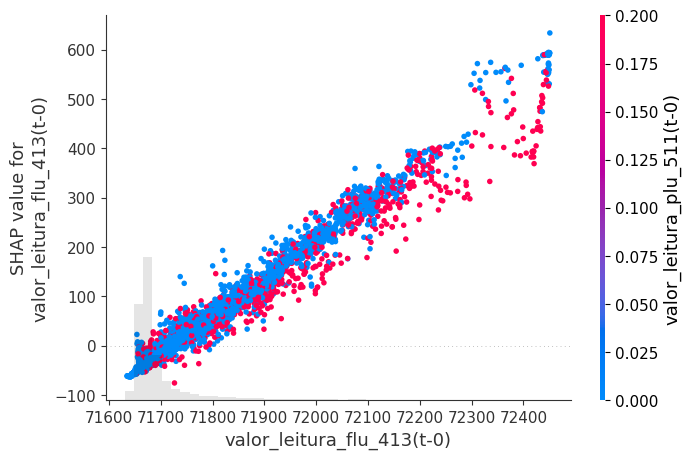

In [91]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

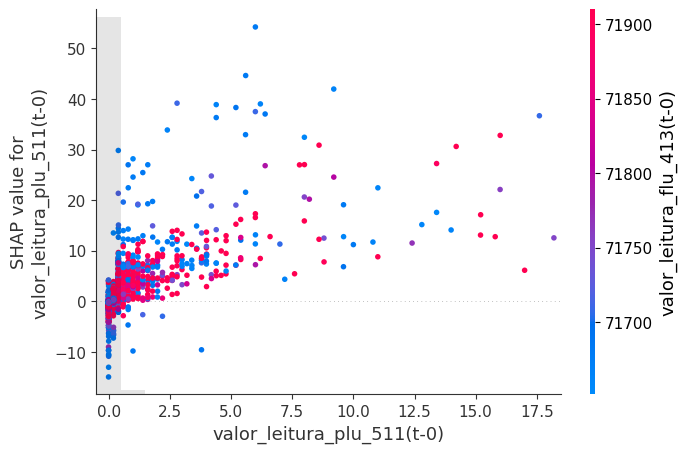

In [92]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

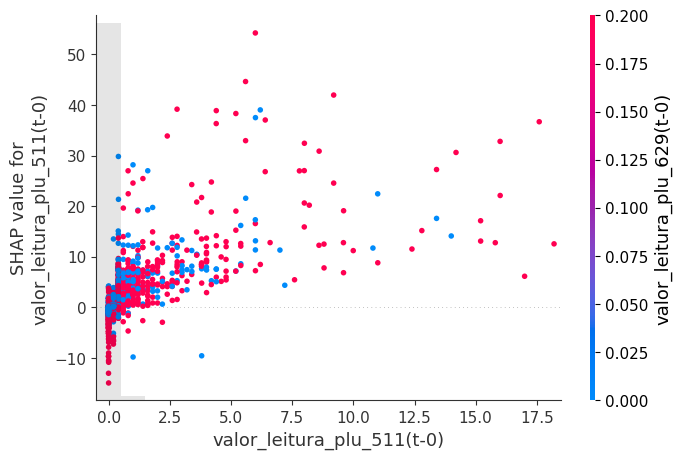

In [93]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

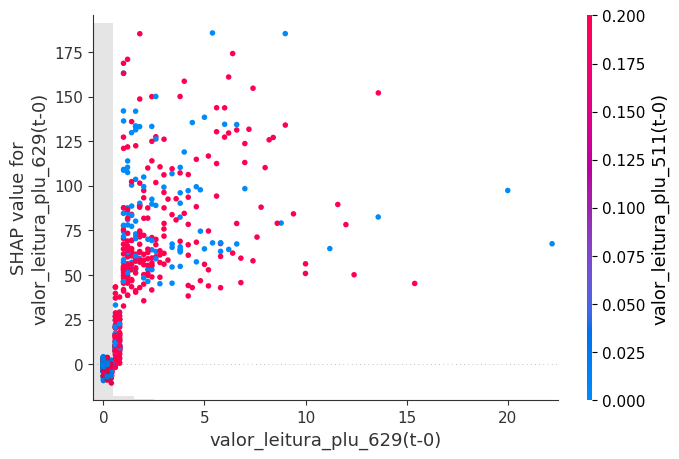

In [94]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

[01:13:22] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


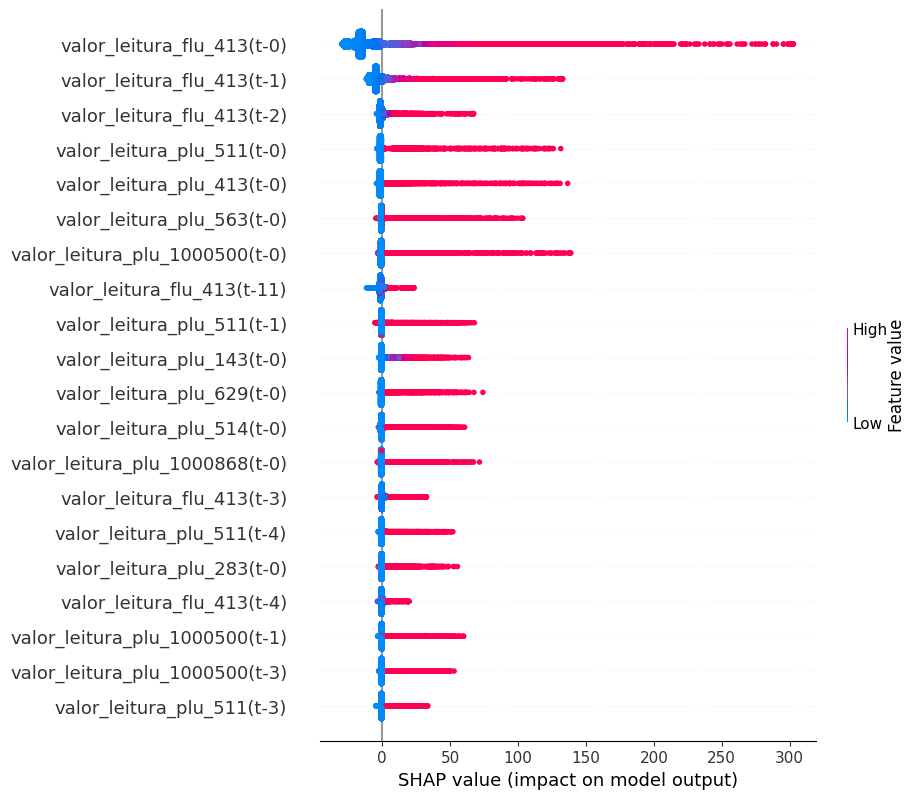

In [ ]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

[14:58:43] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


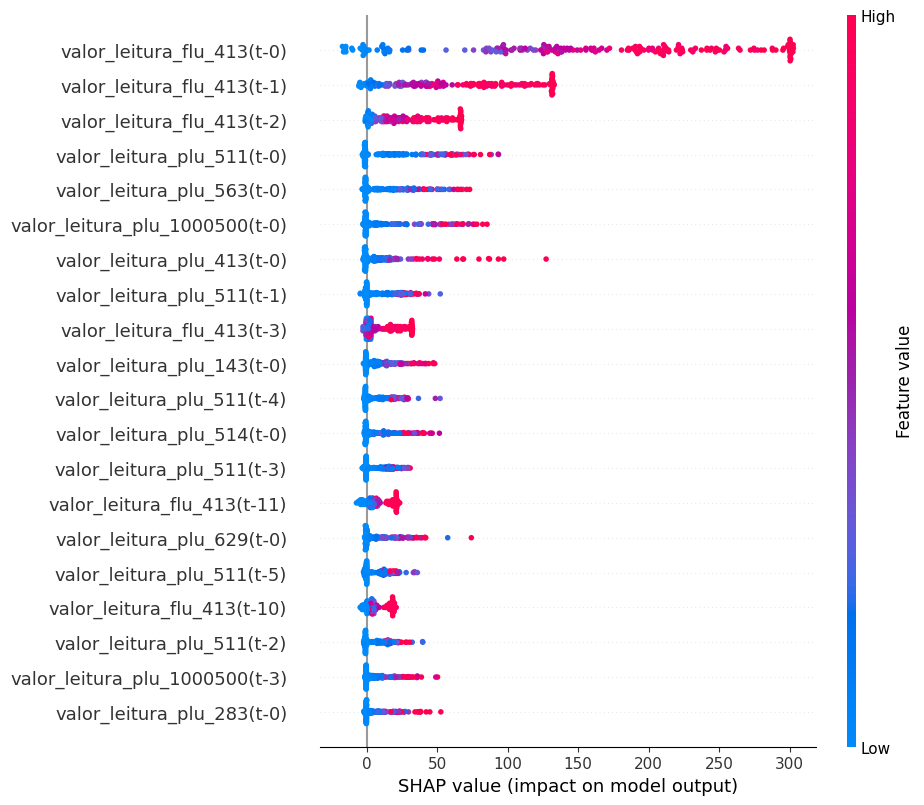

In [ ]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020)

### Usando todas as features

In [17]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [18]:
feature_names = X_train_general.columns

Average of RMSE: 41.862346691796546
Average of NSE: 0.8323543575265764


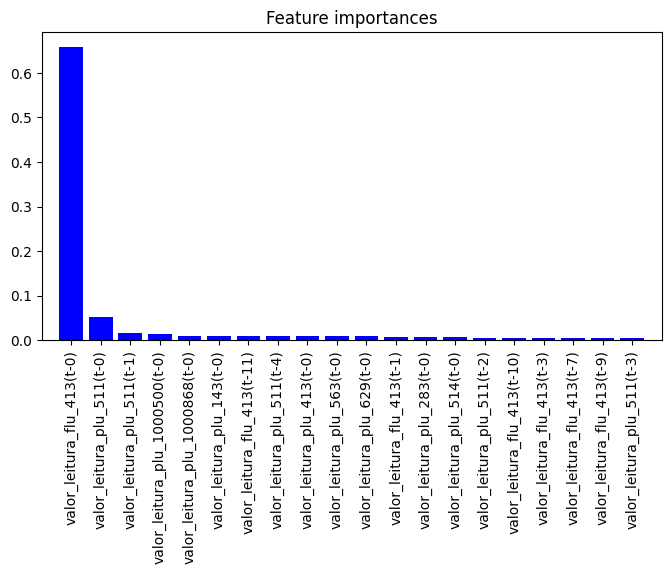

In [20]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [134]:
# Otimizando com Optuna
trial, n_estimators, max_depth, min_samples_split, min_samples_leaf = run_optuna_rf(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'max_depth': max_depth, 'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf}
pickle.dump(parameters, open("parameters/random_forest.pkl", "wb")) 
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))

[I 2024-03-13 02:32:51,306] A new study created in memory with name: no-name-c2b409f7-1dc9-49ec-bb38-7a0bc8188b95


Average of RMSE: 41.22105318691271
Average of NSE: 0.8374513762720853


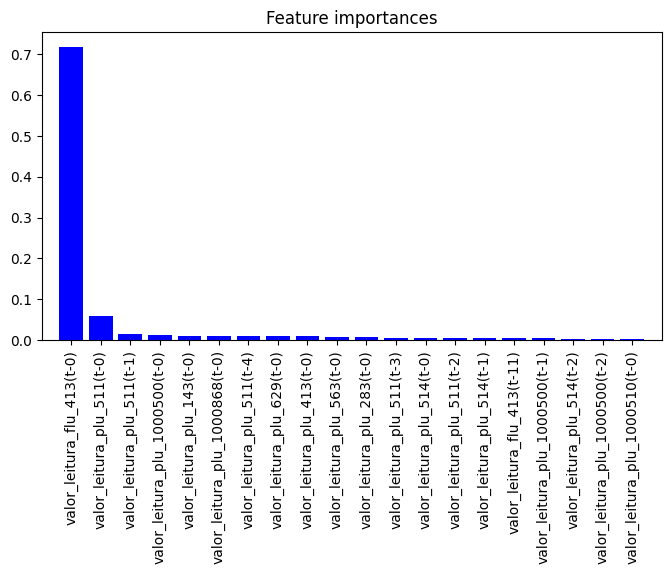

In [21]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


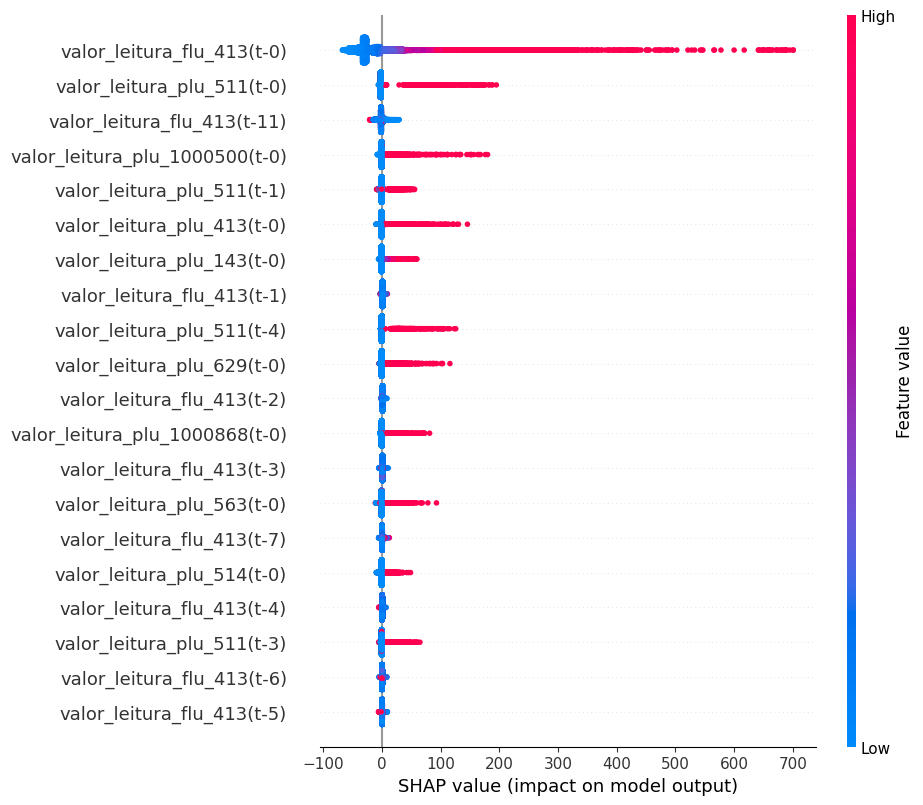

In [48]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


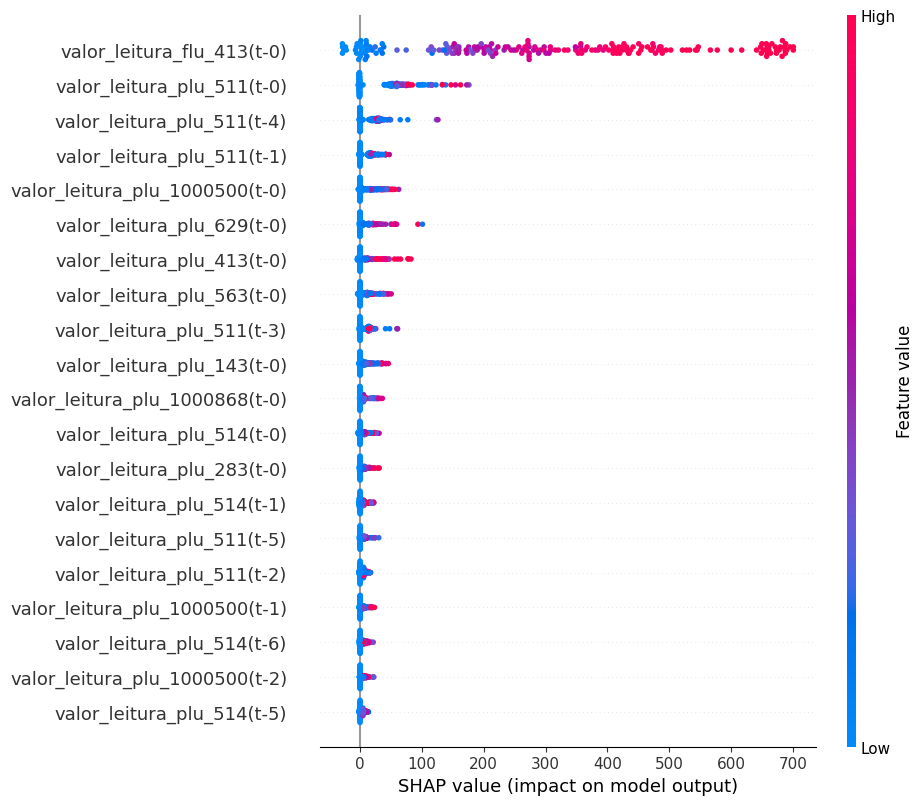

In [49]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

Average of RMSE: 41.49677372371826
Average of NSE: 0.8352695841905309


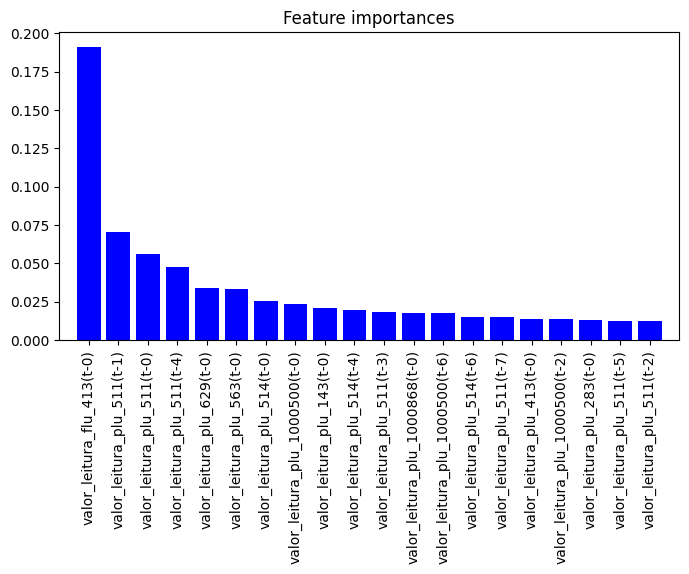

In [118]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [136]:
# Otimizando com Optuna
trial, max_depth, learning_rate , n_estimators, min_child_weight, gamma, subsample, colsample_bytree, reg_alpha, reg_lambda, = run_optuna_xgb(n_trials=50)
parameters = {'trial': trial, 'max_depth': max_depth, 'learning_rate': learning_rate, 'n_estimators': n_estimators, 'min_child_weight': min_child_weight, 'gamma': gamma, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'reg_alpha': reg_alpha, 'reg_lambda': reg_lambda}
pickle.dump(parameters, open("parameters/xgboost.pkl", "wb")) 
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))

suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-13 02:36:59,634] Trial 0 finished with value: 46.91557384710284 and parameters: {'max_depth': 7, 'learning_rate': 0.011002817226254392, 'n_estimators': 650, 'min_child_weight': 8, 'gamma': 9.728728830009641e-05, 'subsample': 0.02815744802026465, 'colsample_bytree': 0.024895779540435023, 'reg_alpha': 0.012140755068184341, 'reg_lambda': 2.2536511574969237e-07}. Best is trial 0 with value: 46.91557384710284.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-13 02:37:00,811] Trial 1 finished with value: 43.83538776169429 and parameters: {'max_depth': 1, 'learning_rate': 0.23481164807395874, 'n_estimators': 1000, 'min_child_weight': 1, 'gamma': 0.00012518091079635779, 'subsample': 0.4219314744806921, 'colsample_bytree': 0.16790055575223653, 'reg_alpha': 0.005943503728075847, 'reg_lambda': 2.162761078725784

Average of RMSE: 39.22253053151705
Average of NSE: 0.8528309966290932


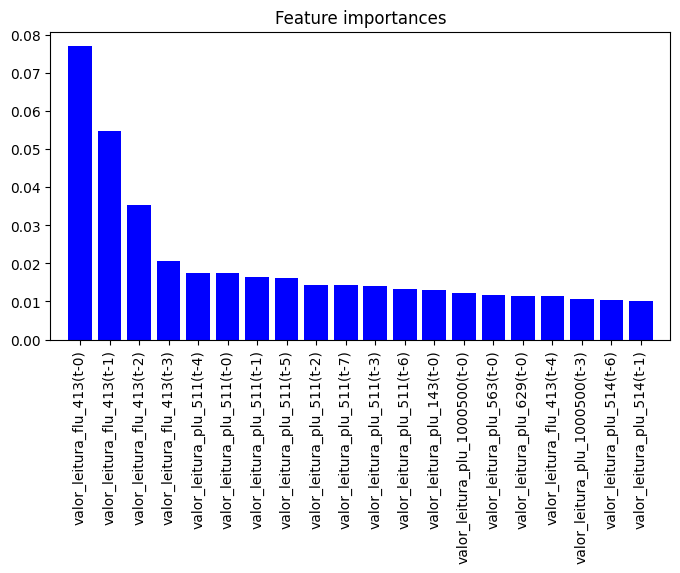

In [46]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [119]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

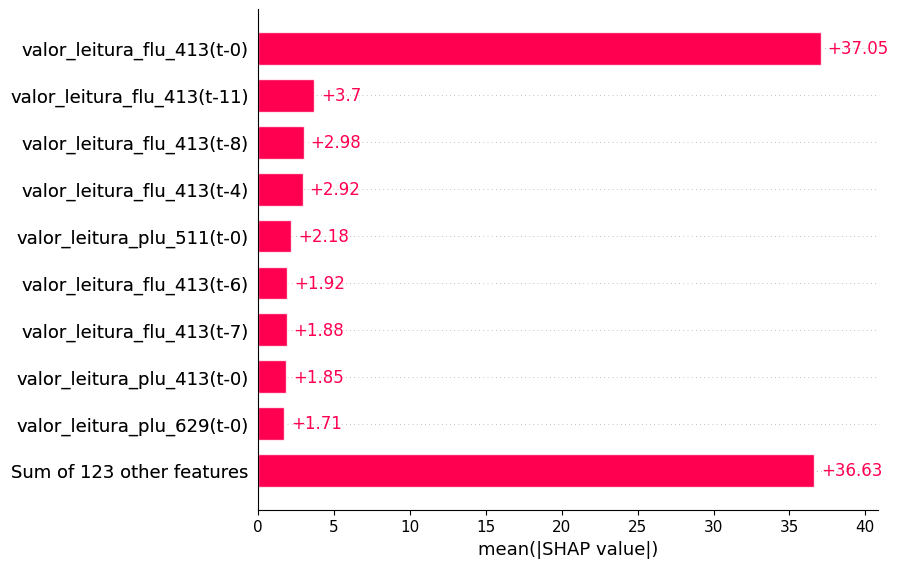

In [120]:
shap.plots.bar(shap_values)

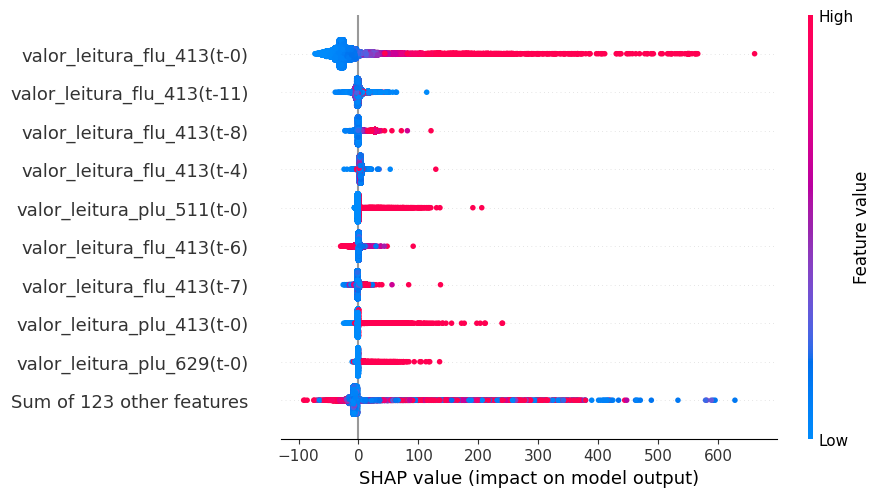

In [121]:
shap.plots.beeswarm(shap_values)

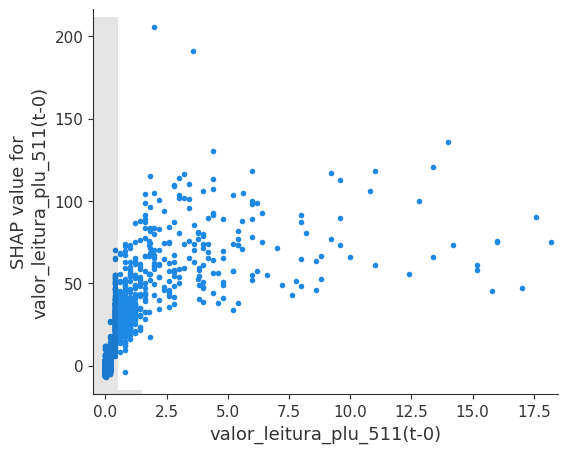

In [101]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

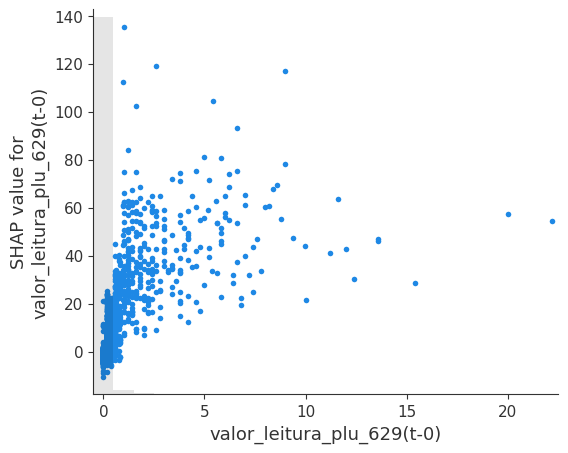

In [102]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

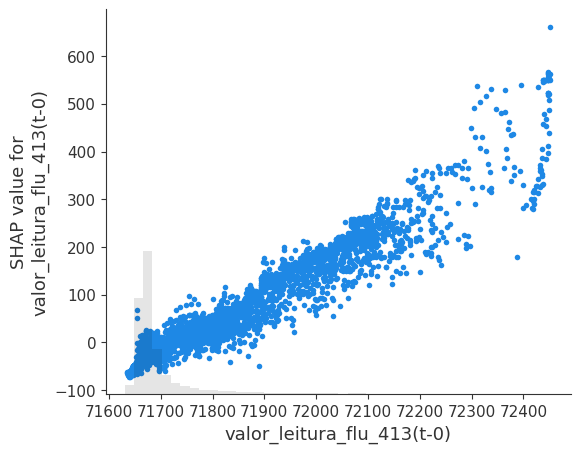

In [103]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

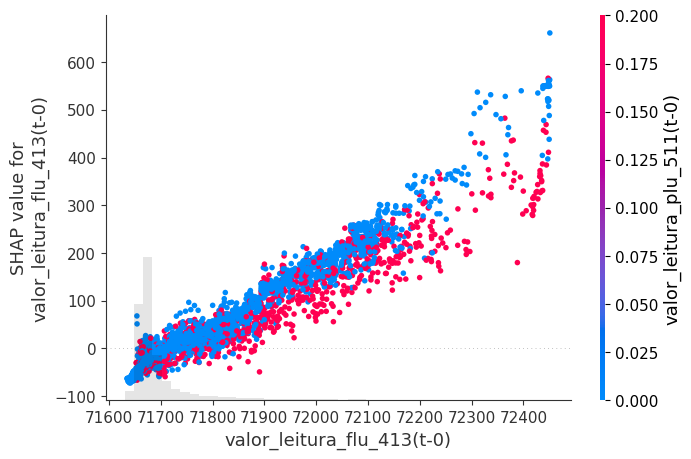

In [104]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

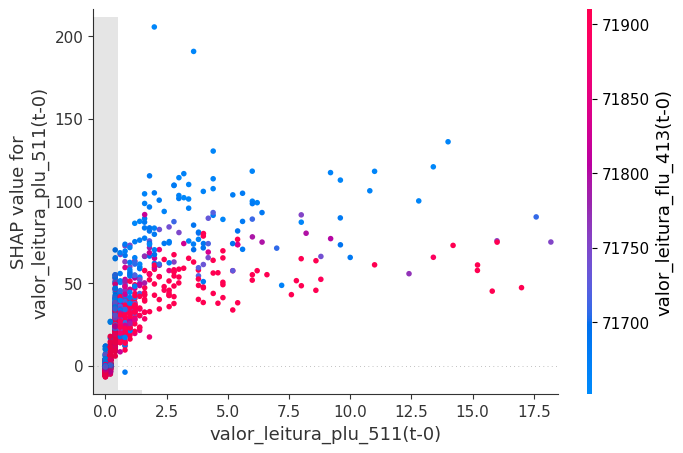

In [107]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

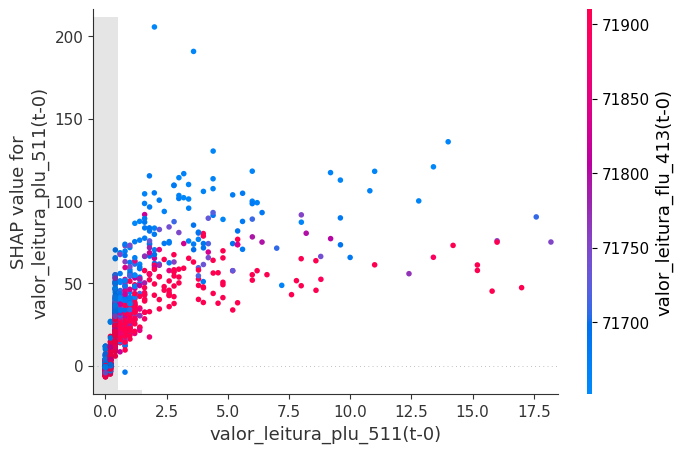

In [105]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

[01:13:22] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


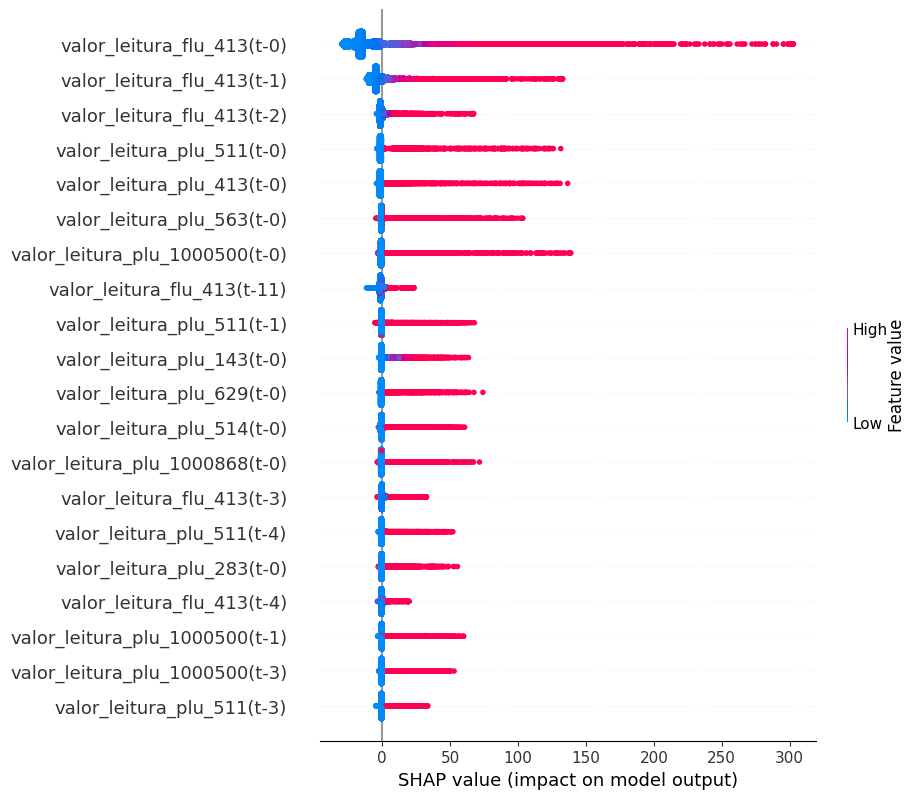

In [41]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

[14:58:43] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


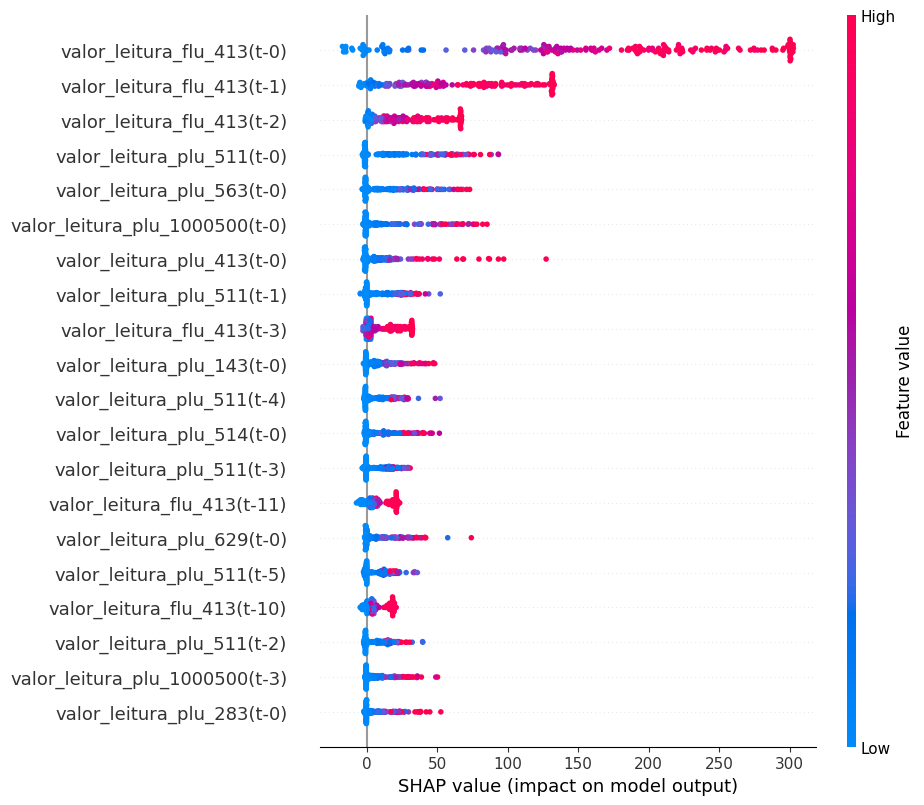

In [56]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

Average of RMSE: 40.22019440446573
Average of NSE: 0.8452490013851117


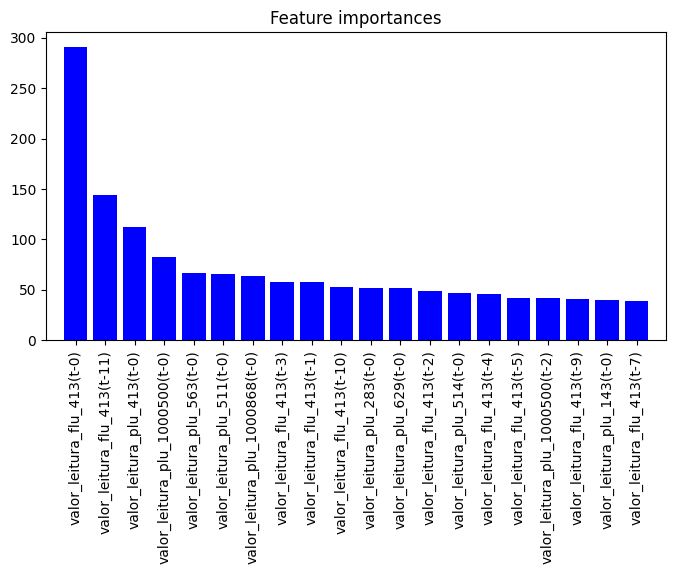

In [32]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [ ]:
# Otimizando com Optuna
trial, n_estimators, learning_rate ,num_leaves, subsample, colsample_bytree,min_data_in_leaf = run_optuna_lgb(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'learning_rate': learning_rate, 'num_leaves': num_leaves, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/light_gbm.pkl", "wb")) 
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))

[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

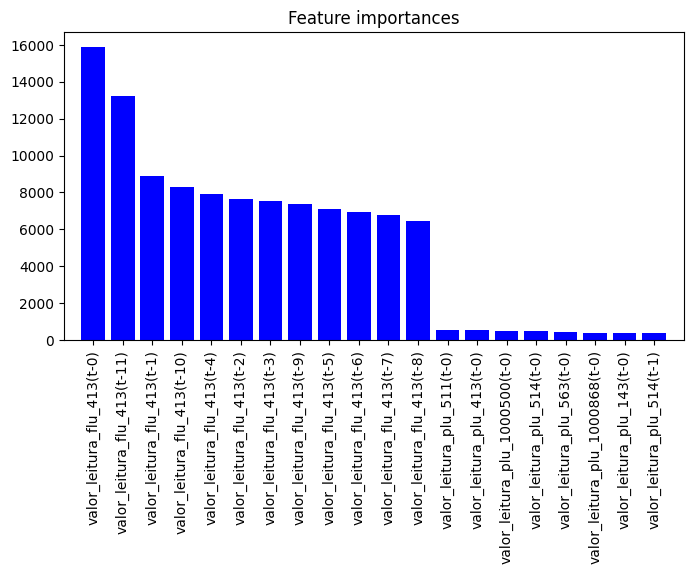

In [50]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


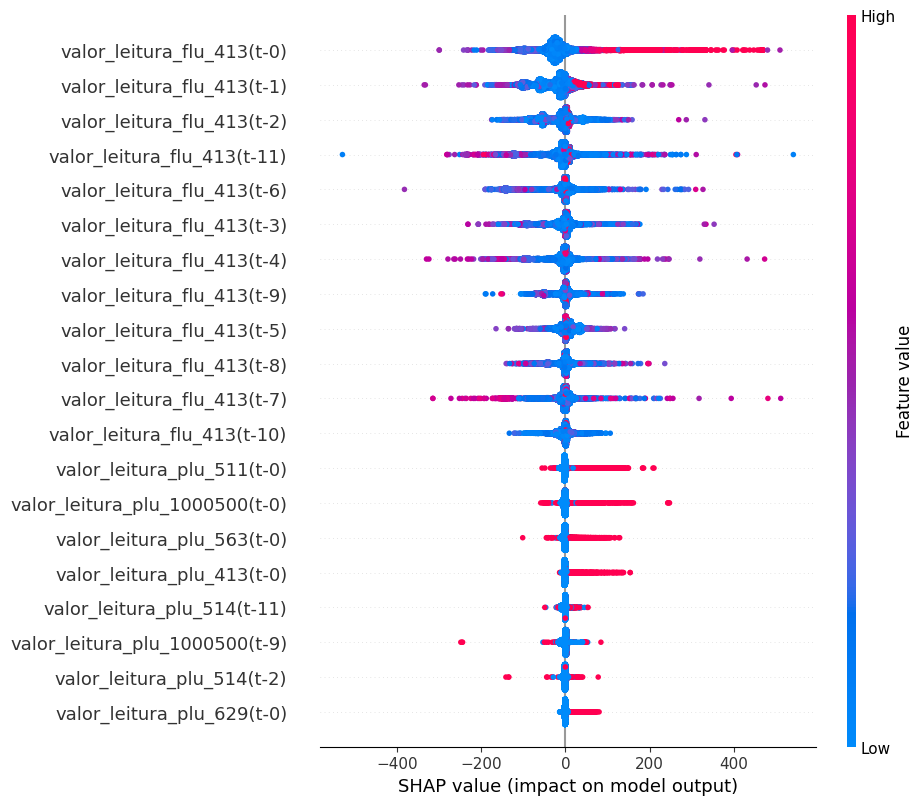

In [52]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general,check_additivity=False).values
fasttreeshap.summary_plot(shap_values,X_train_general)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


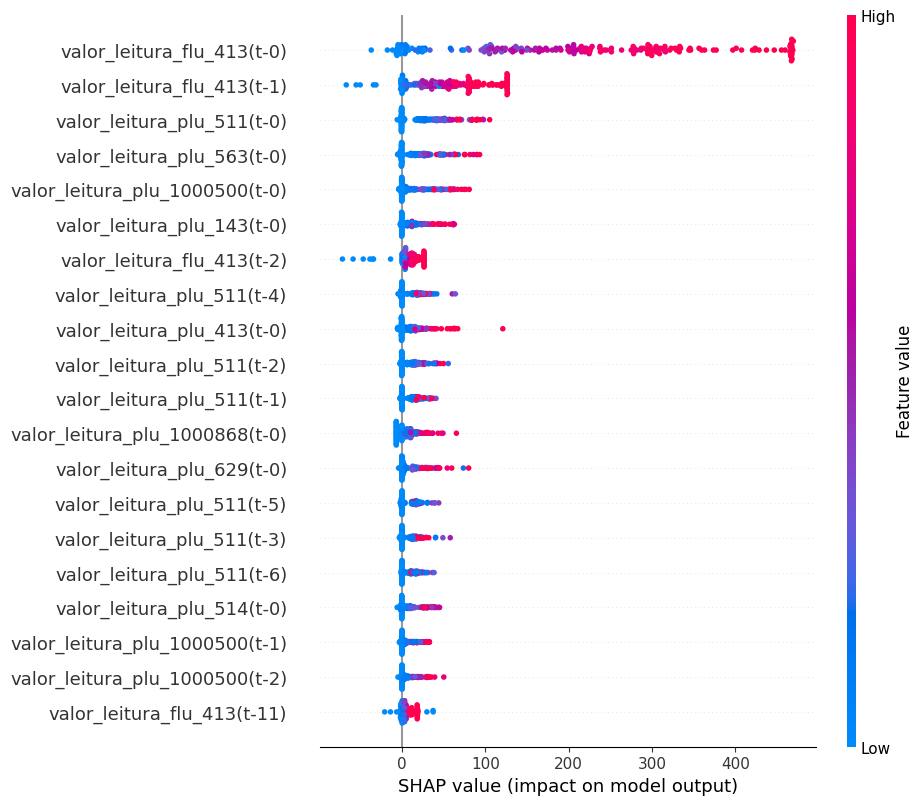

In [53]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores],check_additivity=False).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

In [139]:
# LightGBM with linear trees (https://medium.com/@alessandrotakeshimorita/linear-trees-in-lightgbm-e147f0f39ec3)
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    params = {
    "objective": "regression",
    "metric": "rmse",
    "min_data_in_bin": 1,
    "min_data_in_leaf": 1
    }
    train_data_linear = lgb.Dataset(X_train, label=y_train,
                        params={
                            'linear_tree': True
                        })
    model_linear = lgb.train(params, train_data_linear)
    prediction = model_linear.predict(X_val, num_iteration=model_linear.best_iteration)
    mse = mean_squared_error(prediction, y_val)
    rmse = np.sqrt(mse)
    nse = he.evaluator(he.nse, prediction, y_val)
    nse = nse[0]
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9812
[LightGBM] [Info] Number of data points in the train set: 25874, number of used features: 132
[LightGBM] [Info] Start training from score 71707.820580
Average of RMSE: 40.97650087564195
Average of NSE: 0.8393743608248179


Average of RMSE: 39.40096291510712
Average of NSE: 0.8514889390681348


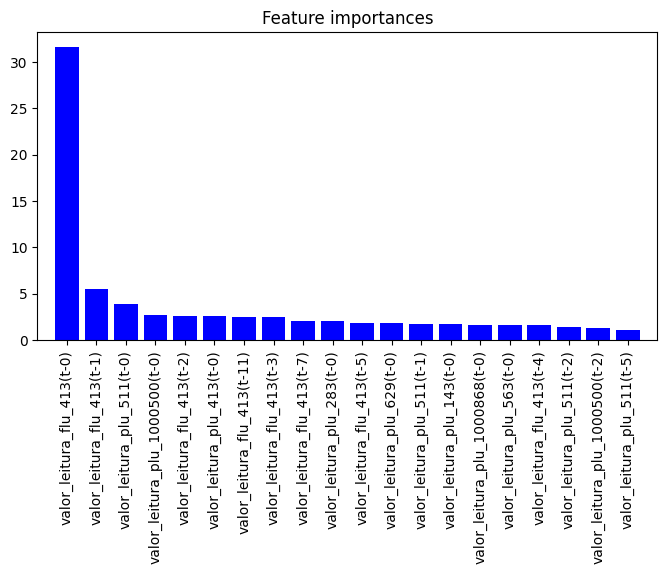

In [19]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [20]:
# Otimizando com Optuna
trial, iterations, learning_rate ,depth, subsample, colsample_bylevel,min_data_in_leaf = run_optuna_cb(n_trials=50)
parameters = {'trial': trial, 'iterations': iterations, 'learning_rate': learning_rate, 'depth': depth, 'subsample': subsample, 'colsample_bylevel': colsample_bylevel, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/cat_boost.pkl", "wb")) 
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))

[I 2024-07-25 01:18:46,791] A new study created in memory with name: no-name-7ee3b483-cb36-4d4b-9a2e-b010927ea3ac
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-07-25 01:18:55,024] Trial 0 finished with value: 64.40194299124472 and parameters: {'iterations': 800, 'learning_rate': 0.001100281722625439, 'depth': 7, 'subsample': 0.7613636884116812, 'colsample_bylevel': 0.5235816616874609, 'min_data_in_leaf': 23}. Best is trial 0 with value: 64.40194299124472.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-07-25 01:18:55,494] Trial 1 finished with value: 42.51318581009456 and parameters: {'iterations': 200, 'learning_rate': 0.033194140233275465, 'depth': 2, 'subsample': 0.13392282346530976, 'colsample_bylevel': 0.7010918274494073, 'min_data_in_leaf': 96}. Best is trial 1 with value: 42.51318581009456.
suggest_int() got {'step'} as positional arguments bu

KeyboardInterrupt: 

Average of RMSE: 39.51228096563638
Average of NSE: 0.850648588268391


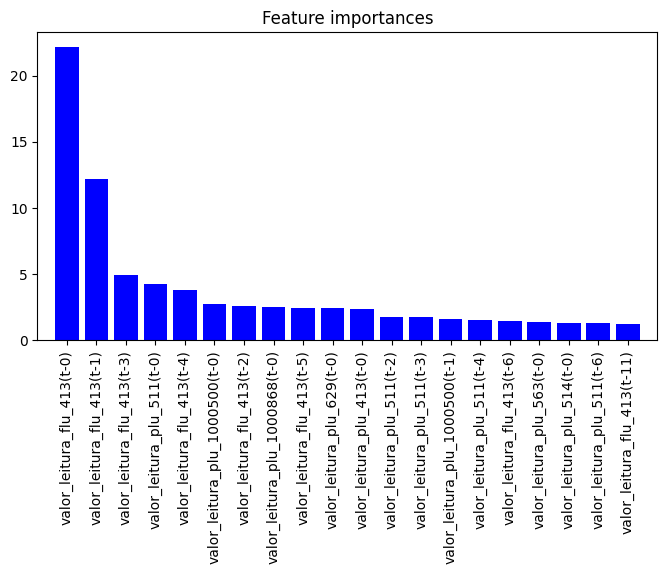

In [31]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [32]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

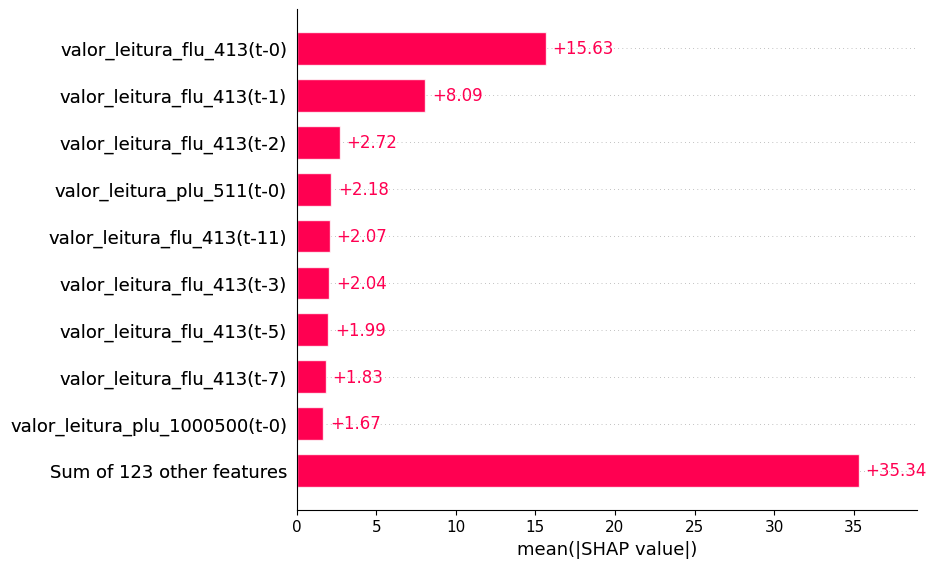

In [33]:
shap.plots.bar(shap_values)

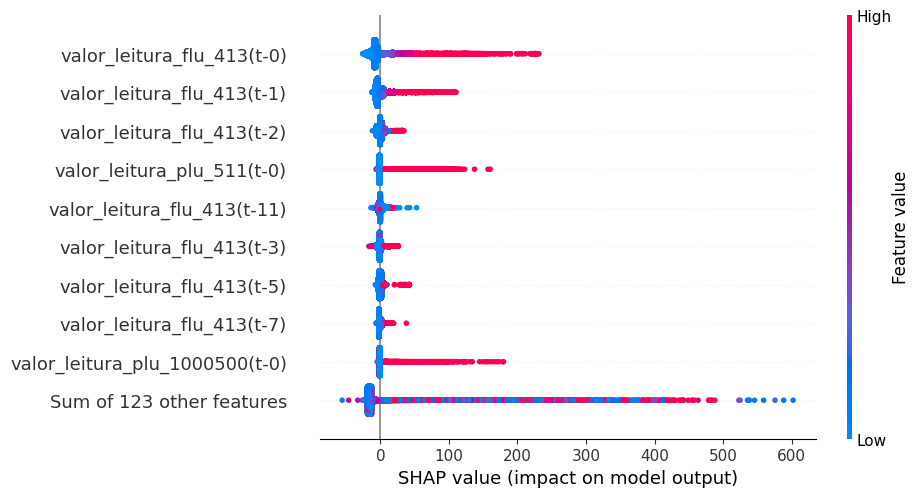

In [34]:
shap.plots.beeswarm(shap_values)

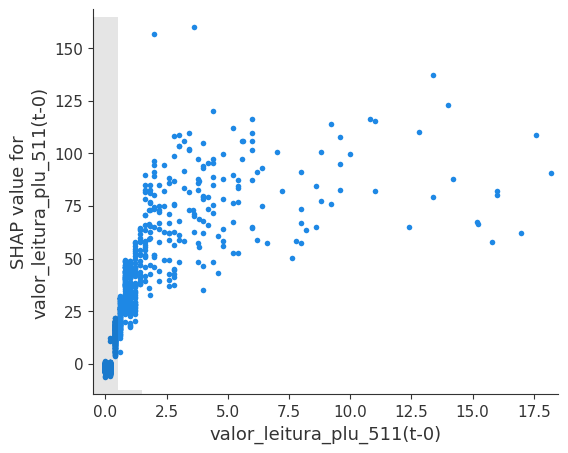

In [35]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

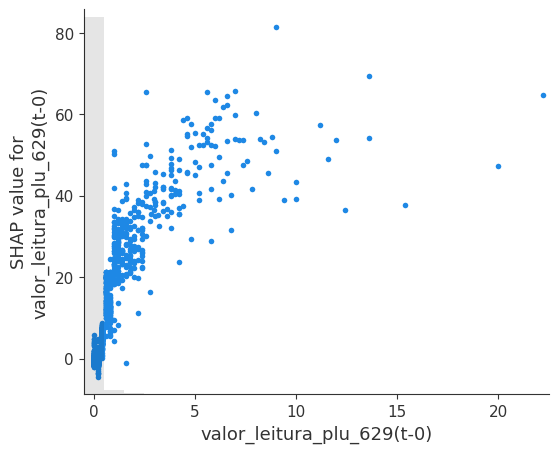

In [36]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

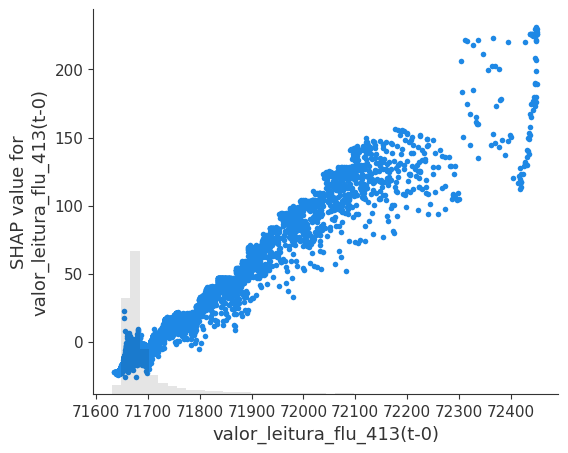

In [37]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

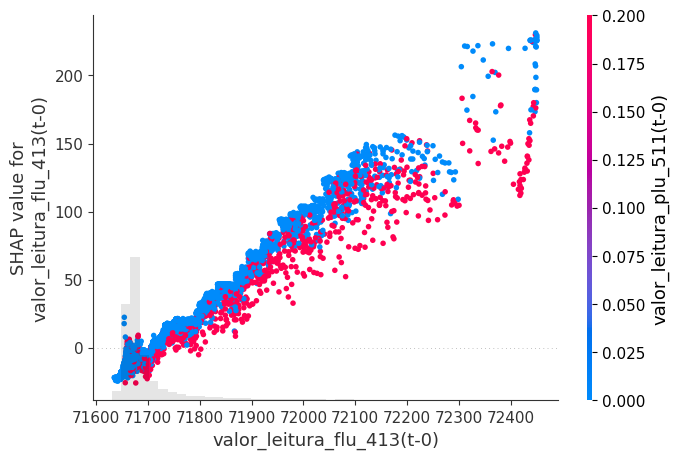

In [38]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

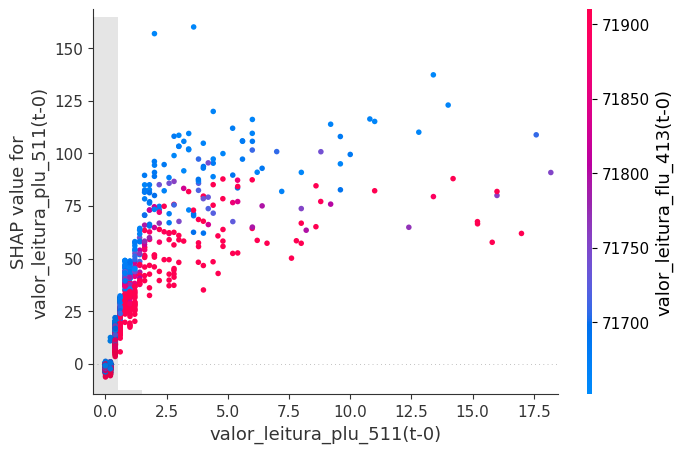

In [39]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

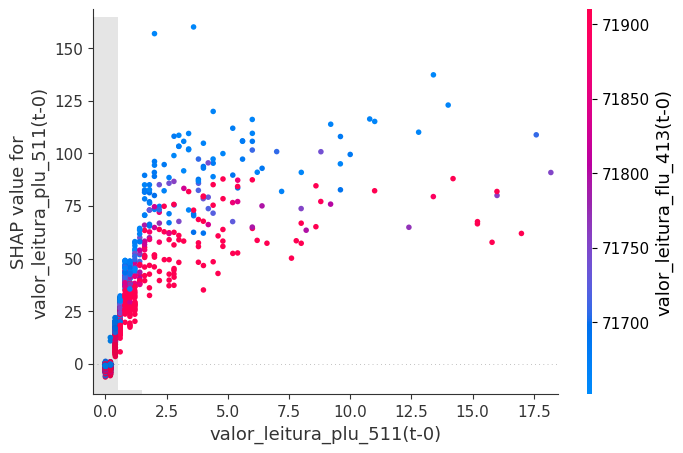

In [40]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

In [41]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

AttributeError: 'TreeEnsemble' object has no attribute 'max_depth'

[14:58:43] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


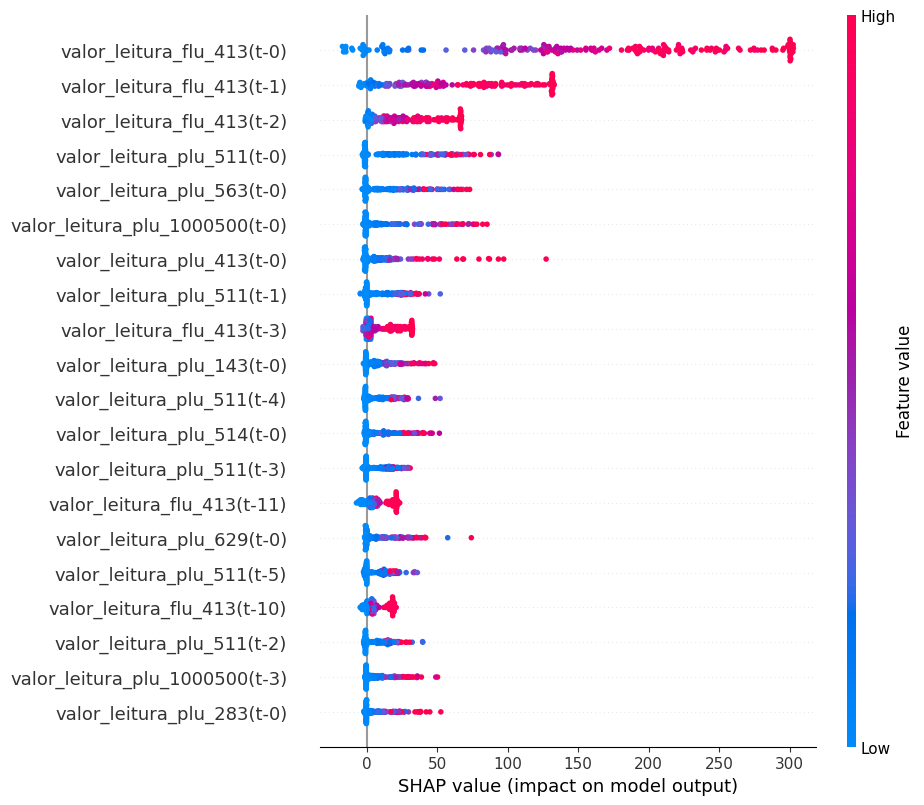

In [ ]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020) - para horizonte de 20 minutos

### Usando todas as features

In [120]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon=2)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [121]:
y_val.shape

(13081,)

In [122]:
feature_names = X_train_general.columns

Average of RMSE: 12.36411749491342
Average of NSE: 0.9853769328139115


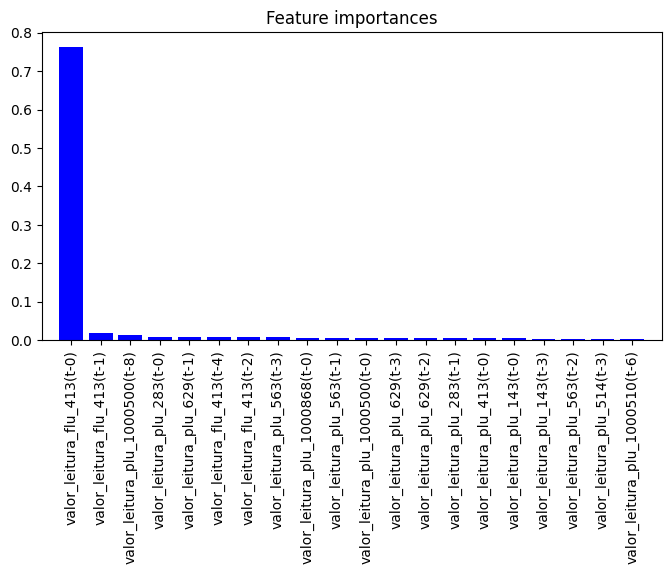

In [123]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [124]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

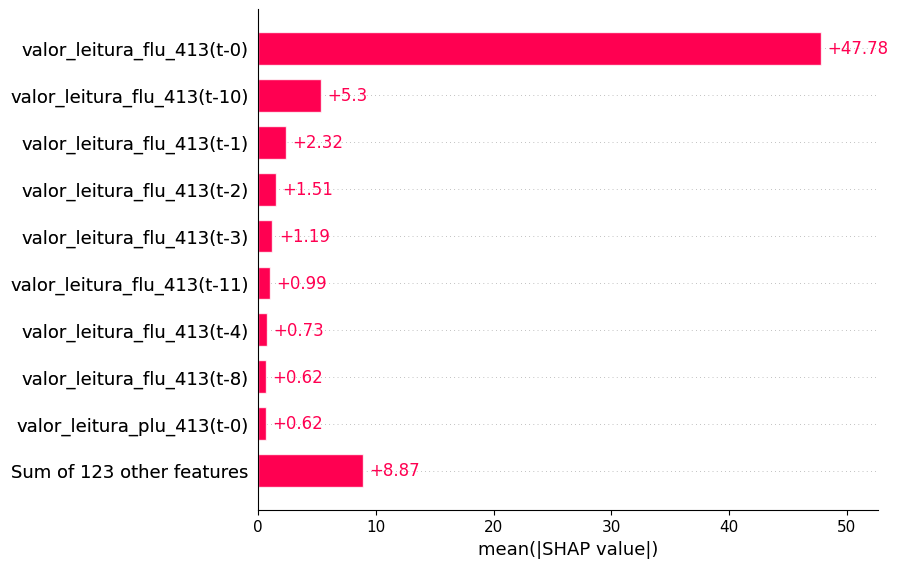

In [125]:
shap.plots.bar(shap_values)

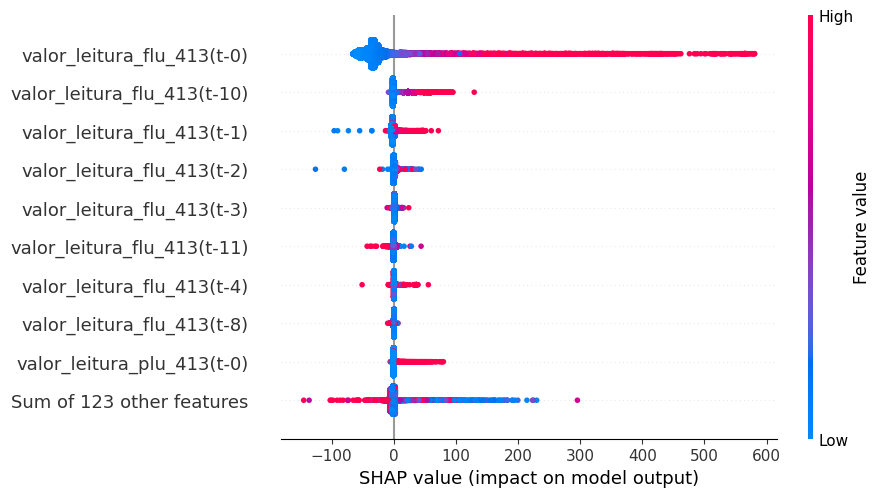

In [126]:
shap.plots.beeswarm(shap_values)

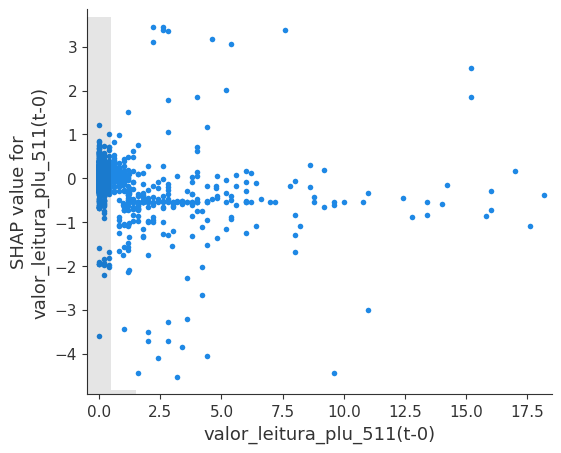

In [127]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

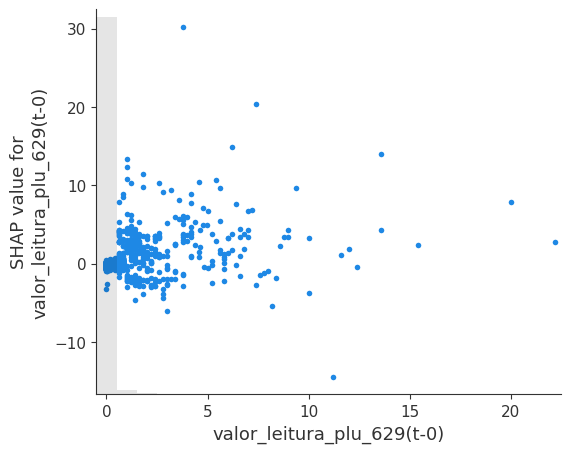

In [128]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

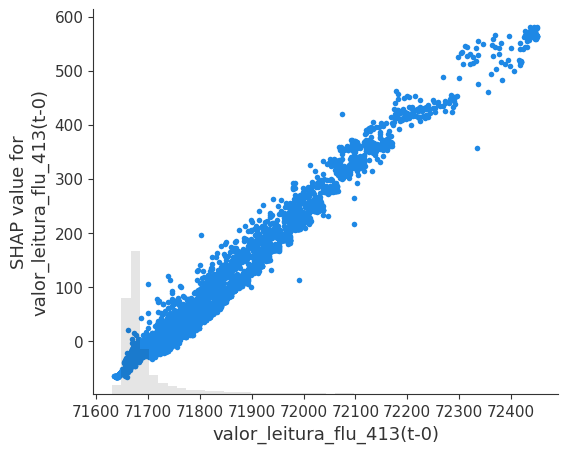

In [129]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

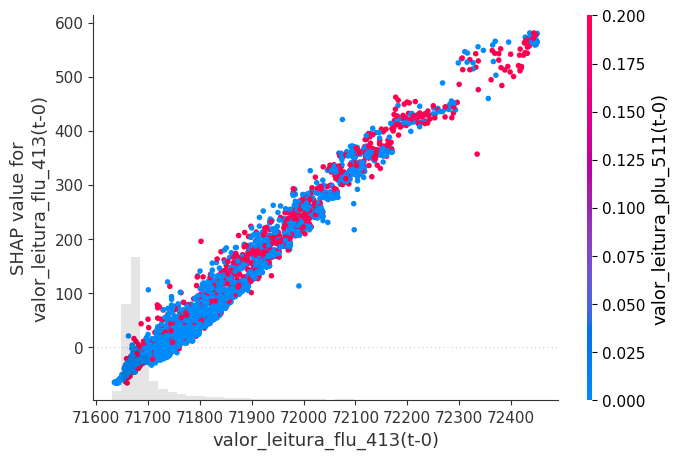

In [130]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

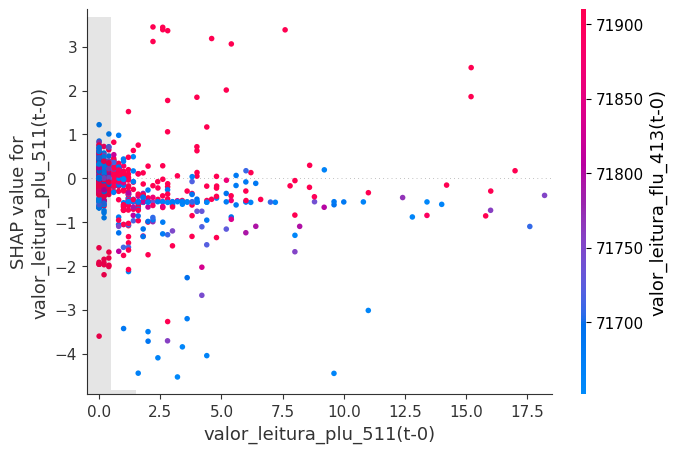

In [131]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

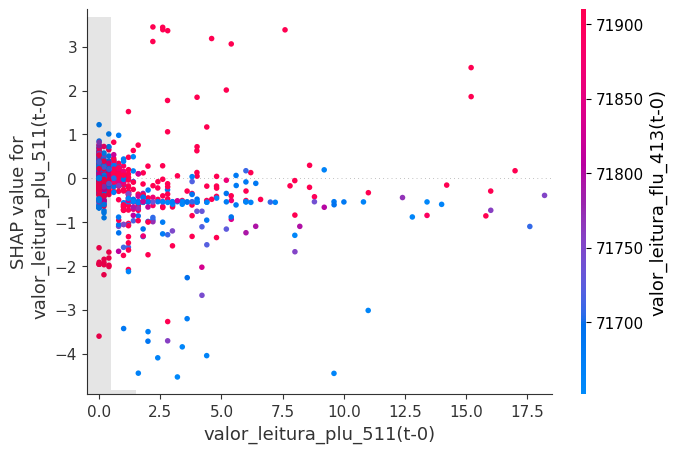

In [132]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020) - para horizonte de 1 horas

### Usando todas as features

In [133]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 6)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [134]:
feature_names = X_train_general.columns

Average of RMSE: 24.125021668474947
Average of NSE: 0.9443249744067694


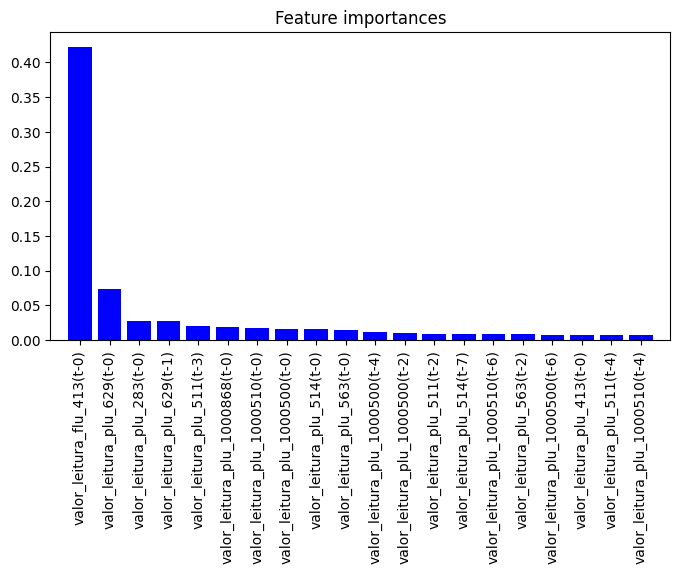

In [135]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [136]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

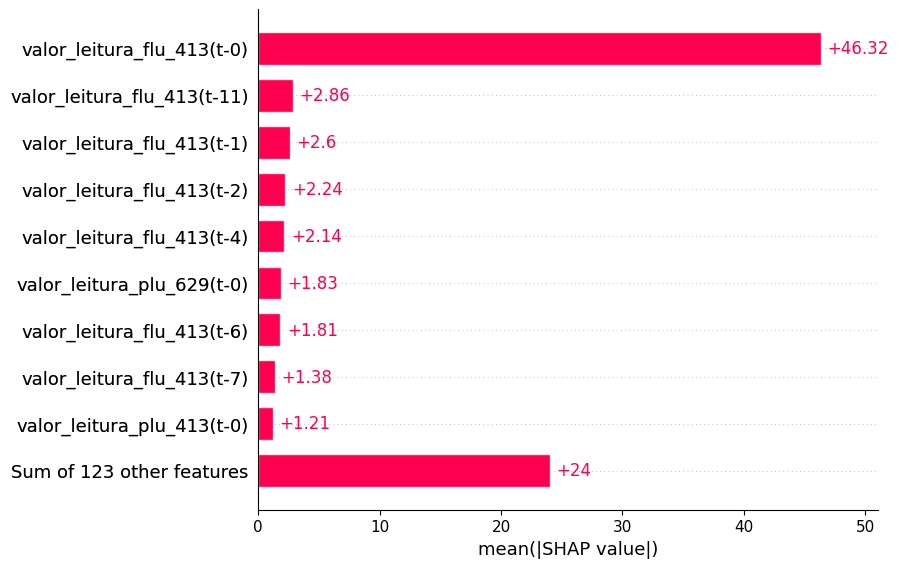

In [137]:
shap.plots.bar(shap_values)

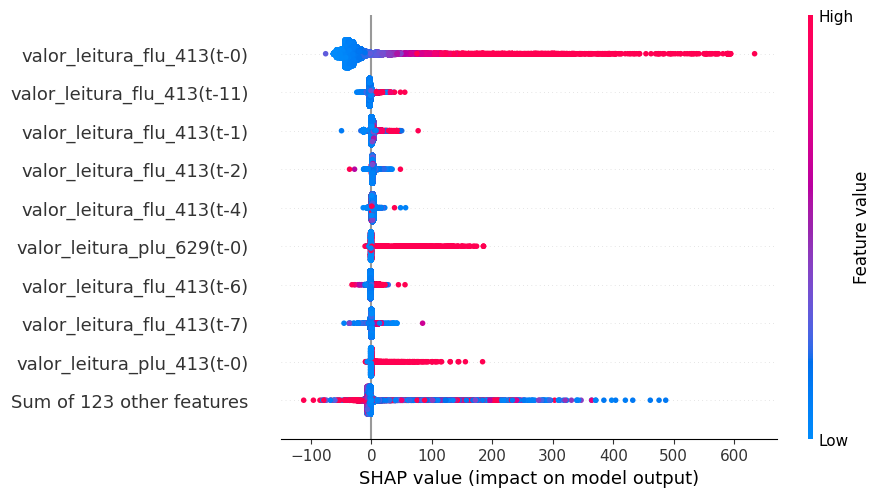

In [138]:
shap.plots.beeswarm(shap_values)

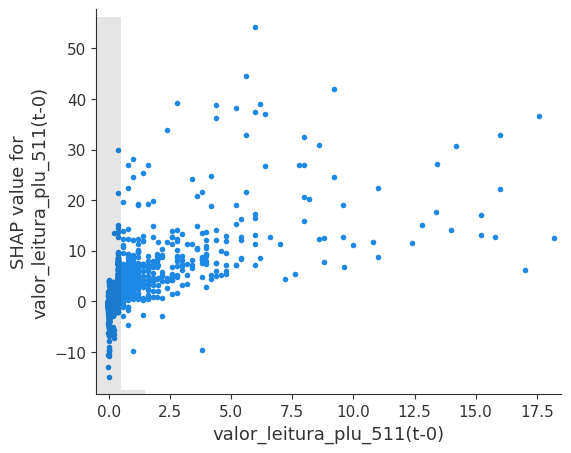

In [139]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

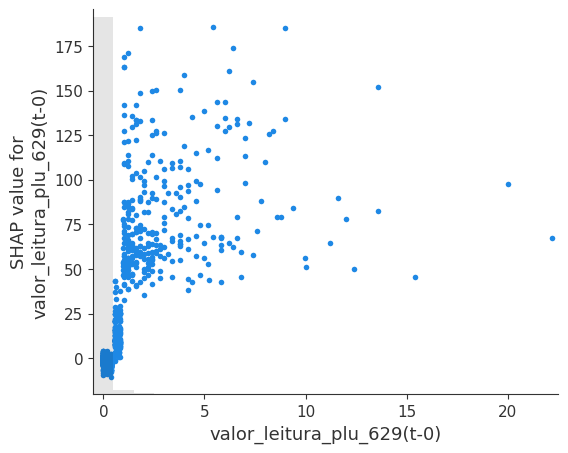

In [140]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

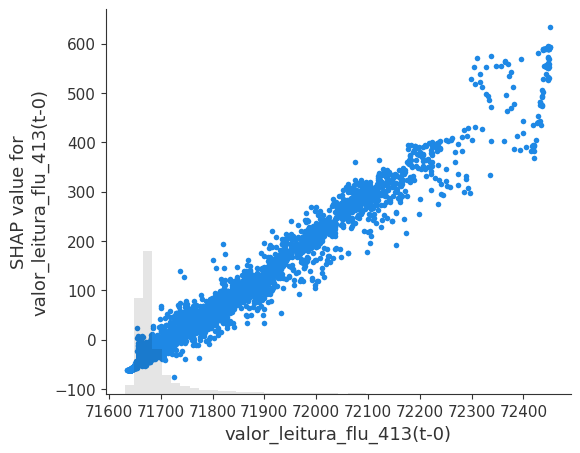

In [141]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

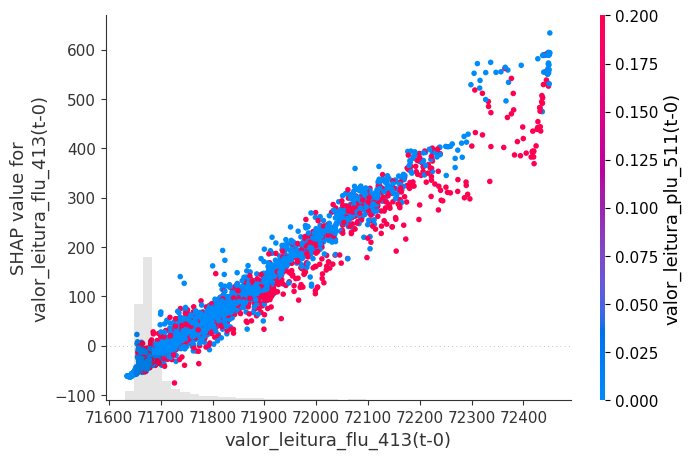

In [142]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

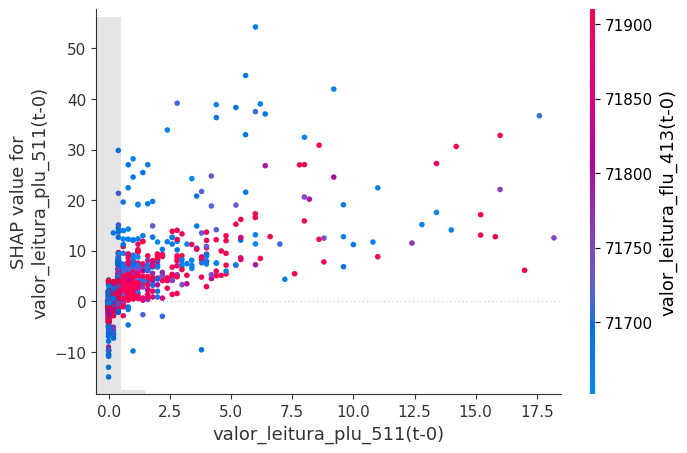

In [143]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

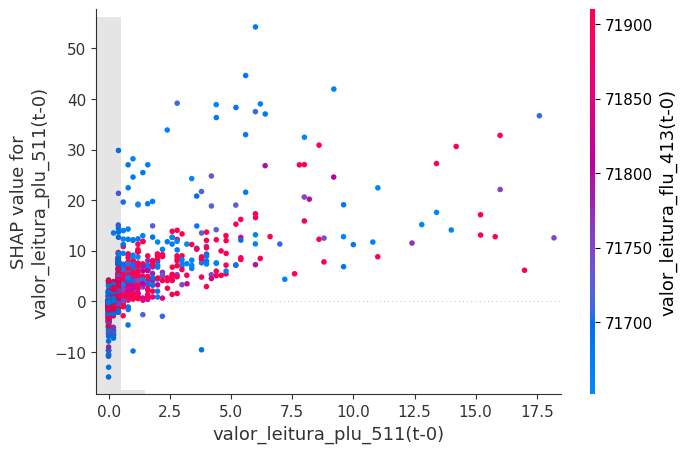

In [144]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020) - para horizonte de 4 horas

### Usando todas as features

In [149]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = 24)
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = 24)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [150]:
feature_names = X_train_general.columns

Average of RMSE: 67.99027372260478
Average of NSE: 0.5580657309427582


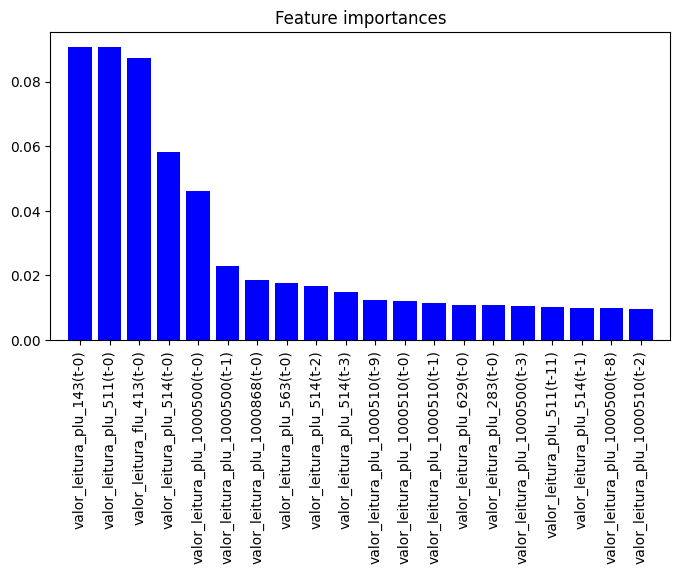

In [151]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [152]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train_general)

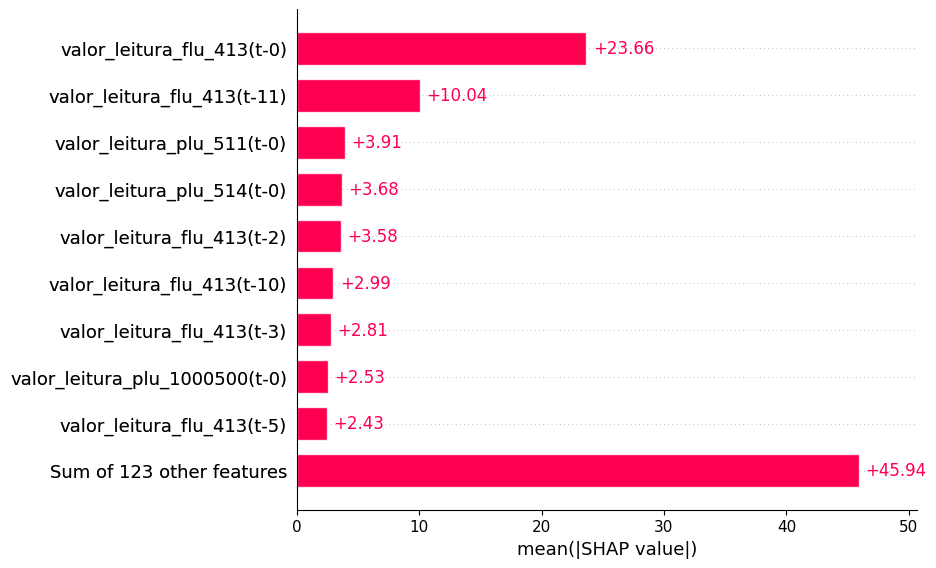

In [153]:
shap.plots.bar(shap_values)

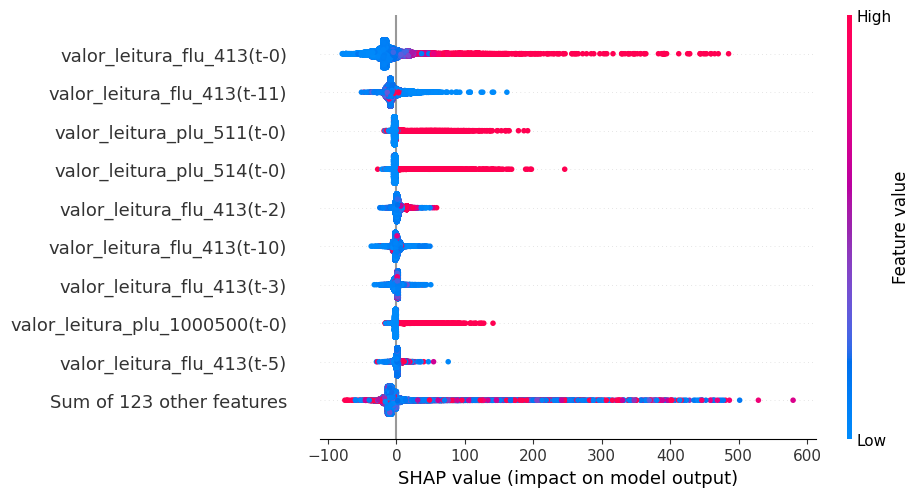

In [154]:
shap.plots.beeswarm(shap_values)

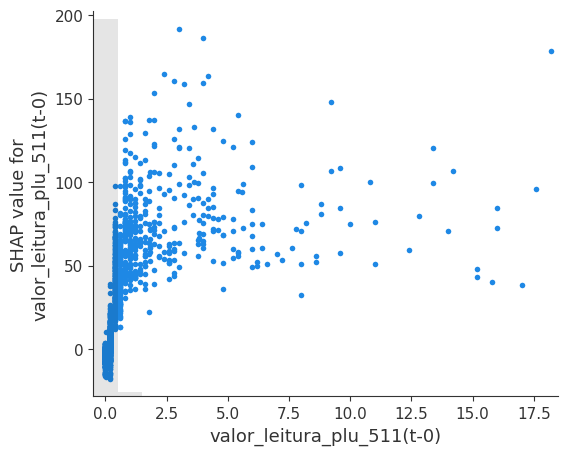

In [155]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])

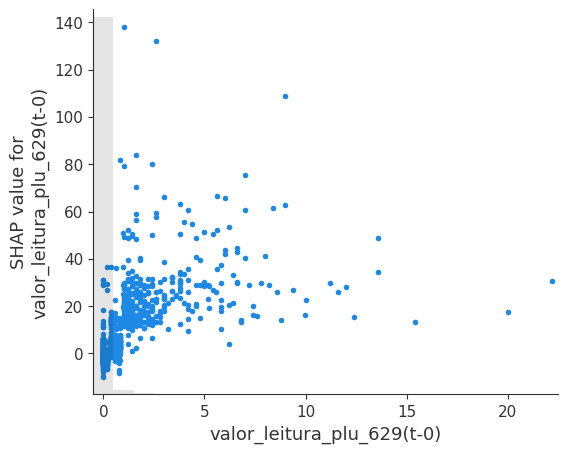

In [156]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])

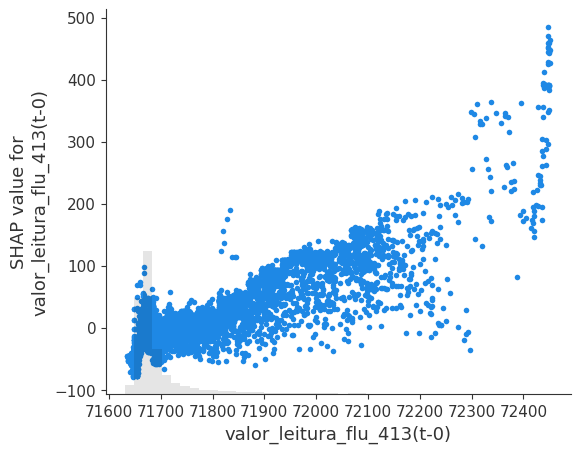

In [157]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])

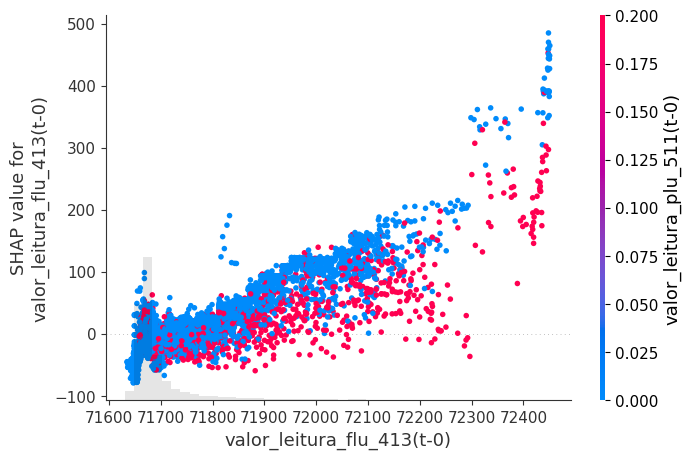

In [158]:
shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

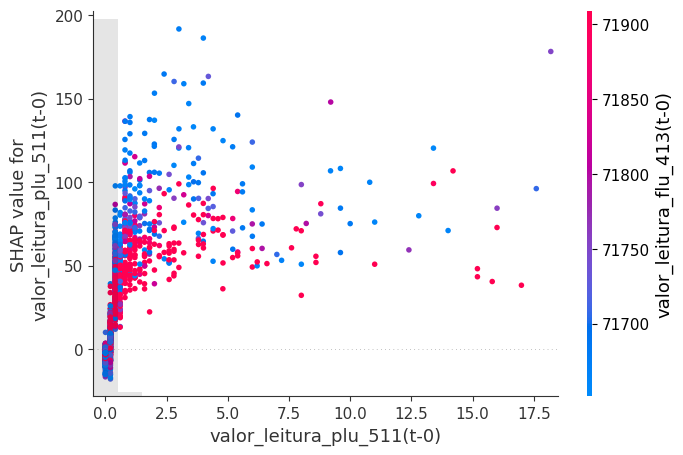

In [159]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

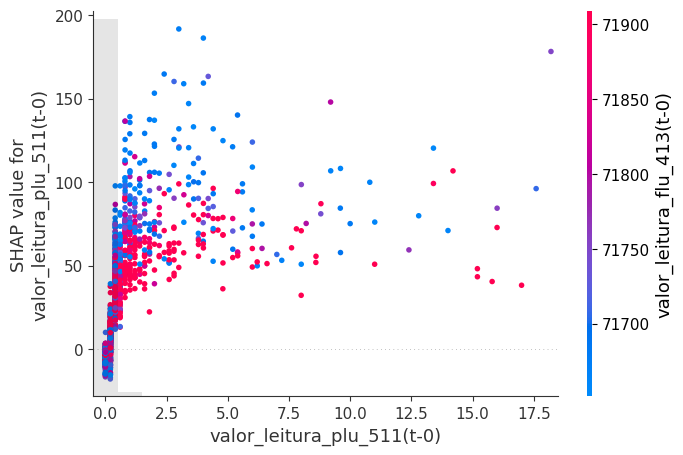

In [160]:
shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])

## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e validação em 2021/2022)

### Usando todas as features

In [17]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019, df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [18]:
feature_names = X_train_general.columns

Average of RMSE: 41.67909583945681
Average of NSE: 0.7572035621307607


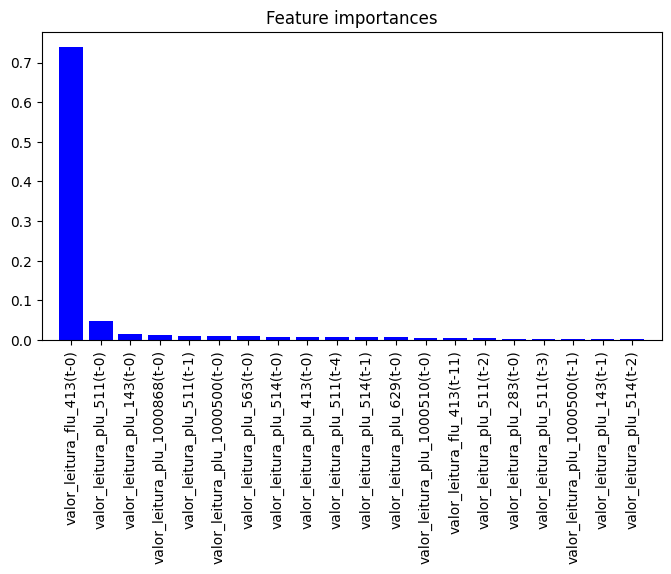

In [30]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


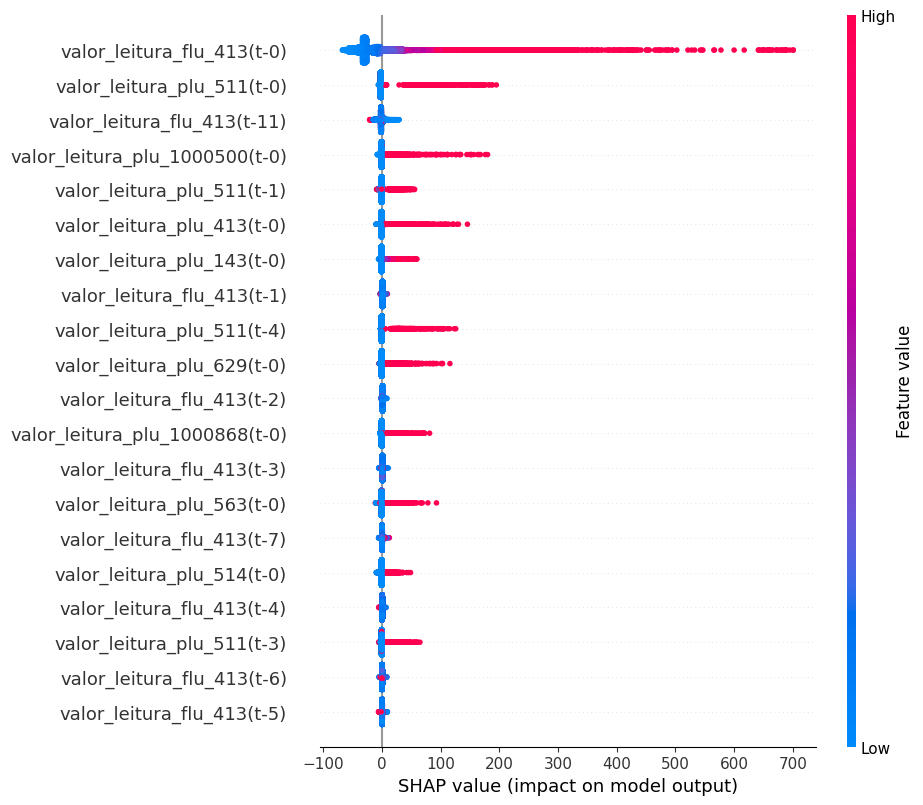

In [ ]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


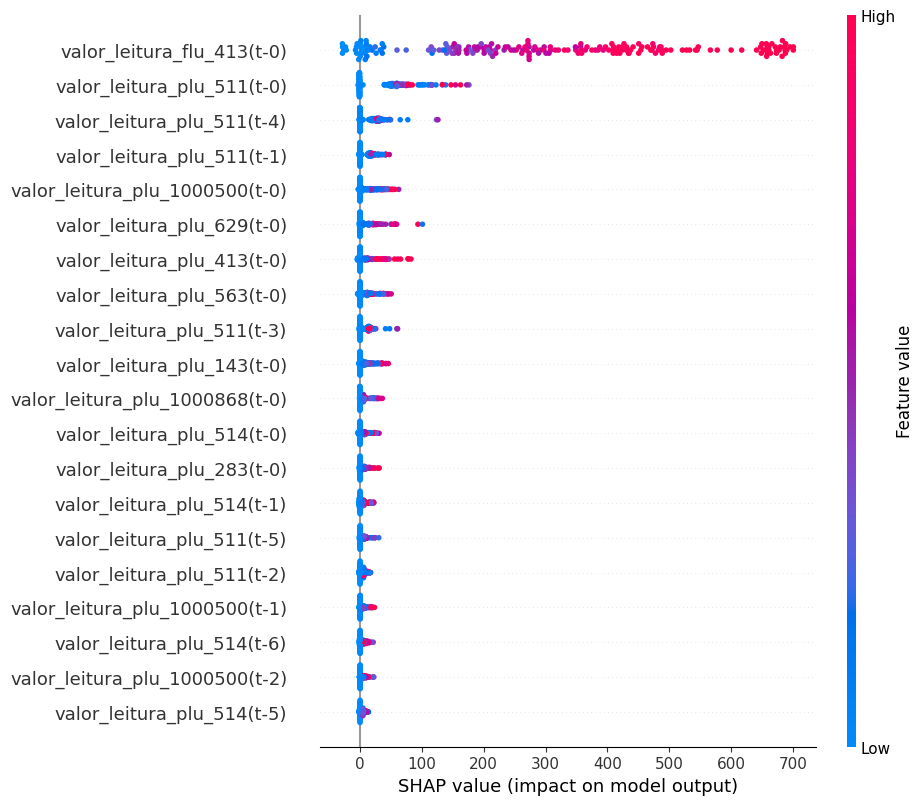

In [ ]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

Average of RMSE: 39.919850468727944
Average of NSE: 0.7772675242991163


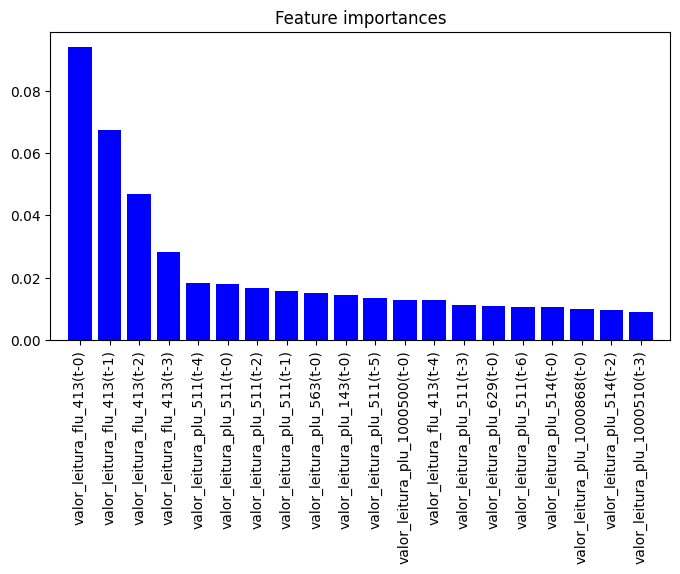

In [38]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

[23:59:10] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

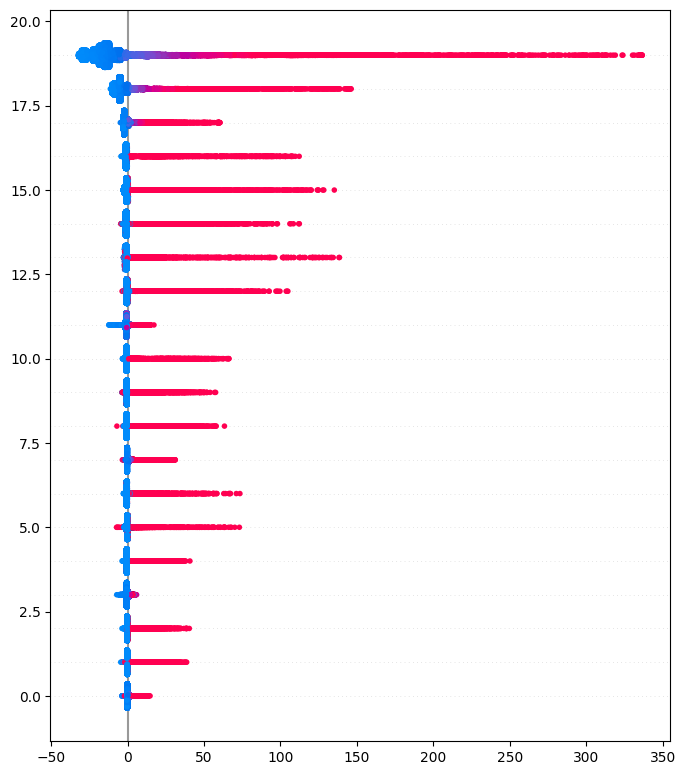

In [39]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general).values
fasttreeshap.summary_plot(shap_values,X_train_general)

[00:00:14] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

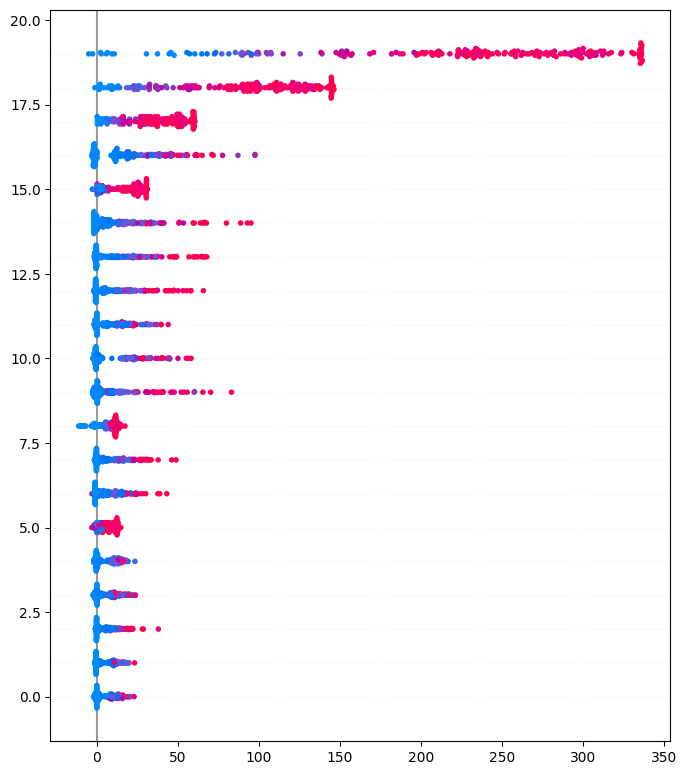

In [40]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores]).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
Average of RMSE: 40.42356408129527
Average of NSE: 0.7716111296172283


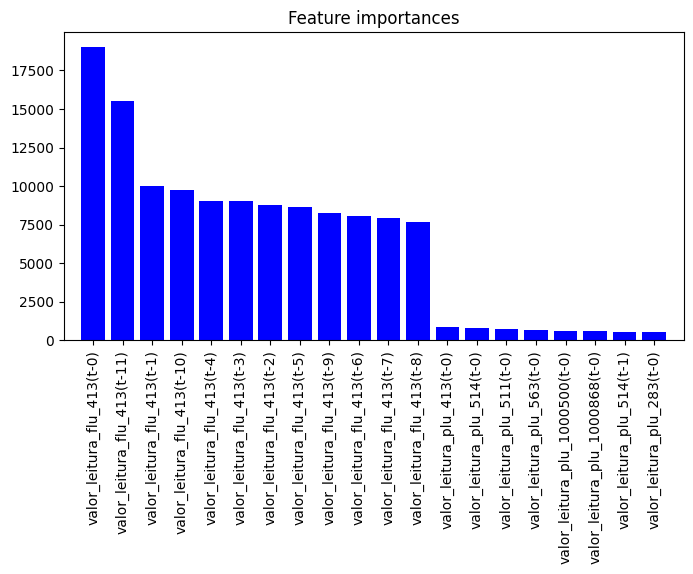

In [19]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [20]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general,check_additivity=False).values
fasttreeshap.summary_plot(shap_values,X_train_general)

: 

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


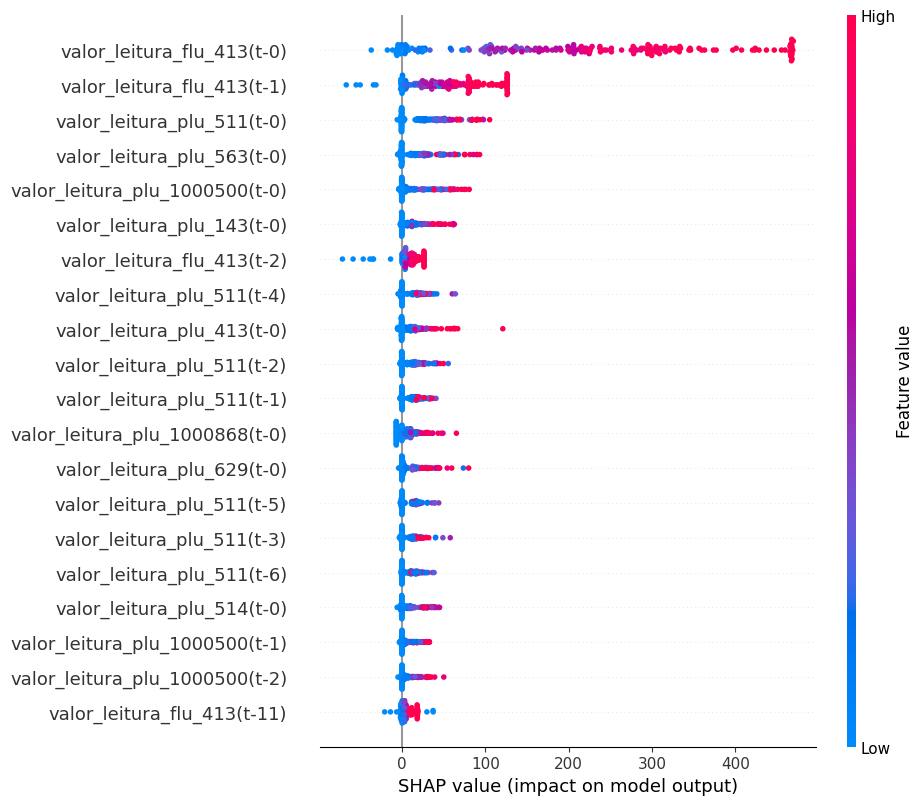

In [ ]:
indices_dos_maiores = y_train_general.reset_index().sort_values(by = 'valor_leitura_flu_413(t+12)', ascending=False)[0:200].index

# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores],check_additivity=False).values
fasttreeshap.summary_plot(shap_values,X_train_general.reset_index().drop(columns=['intervalo']).loc[indices_dos_maiores].loc[indices_dos_maiores])

Average of RMSE: 39.46632098920406
Average of NSE: 0.7822997036581055


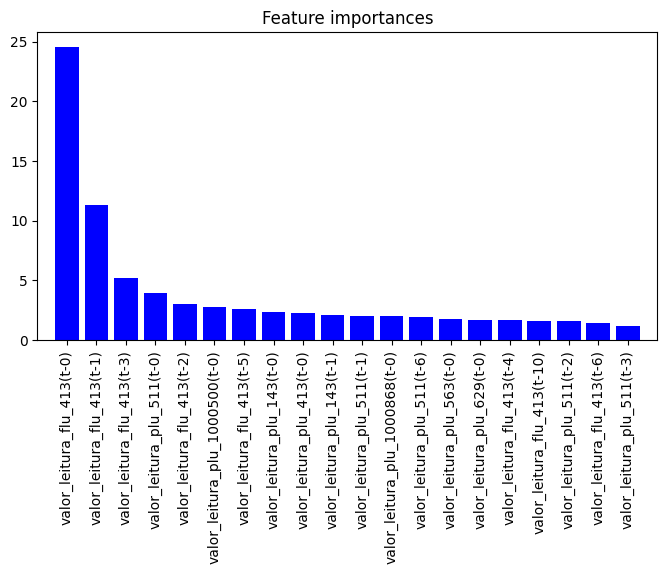

In [33]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

## Exp. 5 - Para série temporal de diferenças com lag features (com treino em 2018/2019 e validação em 2020)

In [47]:
# Função para construir a sequência de predições a partir da predição das diferenças

def reconstruct(diff_prediction,real):
    prediction_reconstructed = []
    for i in range(len(real)):
        last_element = real[i]
        cum_sum = diff_prediction[i,:].sum()
        prediction_reconstructed.append(last_element + cum_sum)
    prediction_reconstructed = np.array(prediction_reconstructed)
    return prediction_reconstructed

### Usando todas as lag features

In [48]:
df_2018_new = df_2018.copy()
df_2019_new = df_2019.copy()
df_2020_new = df_2020.copy()
df_2023_new = df_2023.copy()

for df in [df_2018_new,df_2019_new,df_2020_new,df_2023_new]:
    df['valor_leitura_flu_413_diff'] = df['valor_leitura_flu_413'].diff()
    df.dropna(inplace=True)
    df.reset_index(inplace=True)


train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_new, df_2019_new], dataframes_validacao = [df_2020_new], dataframes_teste = [df_2023_new])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos_v2(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413_diff' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [49]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 9.931563864646764
Average of NSE: 0.0


In [50]:
first_element = df_2020[df_2020['intervalo']=='2020-01-01 03:10:00+00:00']['valor_leitura_flu_413'].to_numpy()[0]
y_val_reconstructed = df_2020_new[12:-11]['valor_leitura_flu_413'].to_numpy()
prediction_reconstructed = reconstruct(prediction,df_2020_new[0:-23]['valor_leitura_flu_413'].to_numpy())

mse = mean_squared_error(prediction_reconstructed, y_val_reconstructed)
rmse = np.sqrt(mse)
print('RMSE:', rmse)
nse = he.evaluator(he.nse, prediction_reconstructed, y_val_reconstructed)
nse = nse[0]
print('NSE:', nse)

RMSE: 58.896123355709875
NSE: 0.6682149238088653


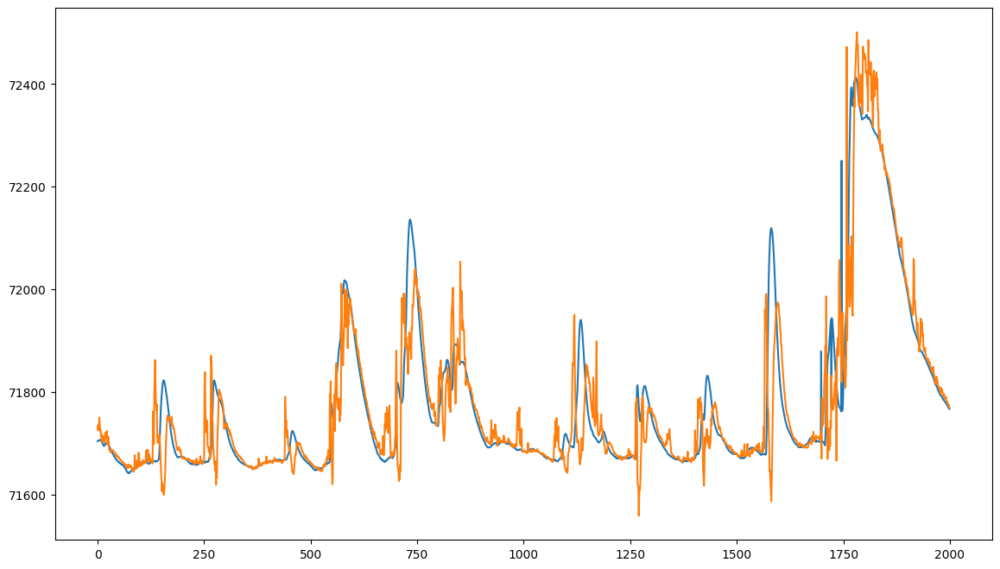

In [54]:
plt.figure(figsize=(14,8))
plt.plot(y_val_reconstructed[4000:6000])
plt.plot(prediction_reconstructed[4000:6000])

In [58]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 40)

Average of RMSE: 10.08946500910236
Average of NSE: 0.0


In [74]:
prediction.shape

(13080, 12)

In [59]:
first_element = df_2020[df_2020['intervalo']=='2020-01-01 03:10:00+00:00']['valor_leitura_flu_413'].to_numpy()[0]
y_val_reconstructed = df_2020_new[12:-11]['valor_leitura_flu_413'].to_numpy()
prediction_reconstructed = reconstruct(prediction,df_2020_new[0:-23]['valor_leitura_flu_413'].to_numpy())

mse = mean_squared_error(prediction_reconstructed, y_val_reconstructed)
rmse = np.sqrt(mse)
print('RMSE:', rmse)
nse = he.evaluator(he.nse, prediction_reconstructed, y_val_reconstructed)
nse = nse[0]
print('NSE:', nse)

RMSE: 52.05139153012217
NSE: 0.7408518477422598


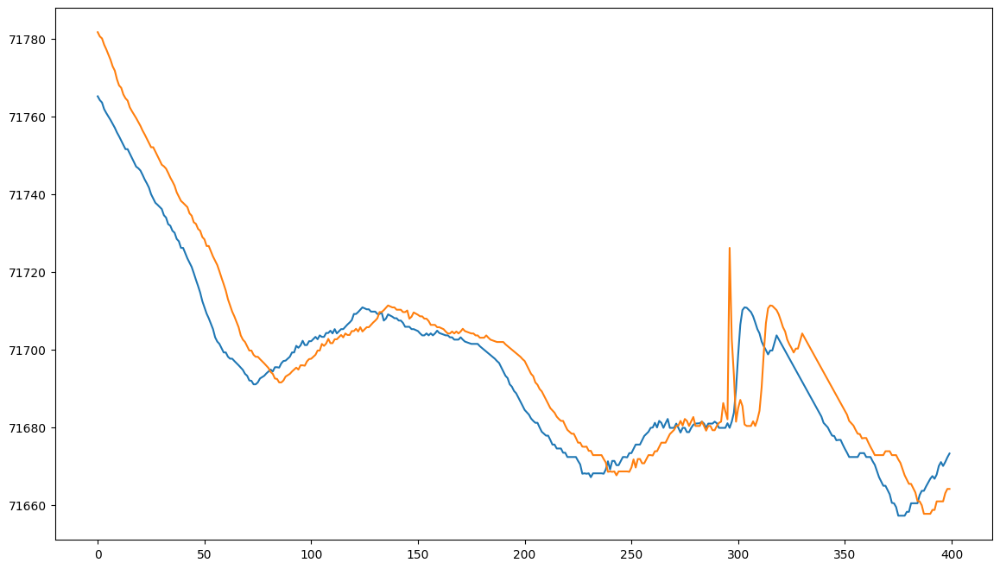

In [63]:
plt.figure(figsize=(14,8))
plt.plot(y_val_reconstructed[6000:6400])
plt.plot(prediction_reconstructed[6000:6400])

In [323]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 9.680665689991113
Average of NSE: 0.0


In [324]:
first_element = df_2020[df_2020['intervalo']=='2020-01-01 05:00:00+00:00']['valor_leitura_flu_413'].to_numpy()[0]
y_val_reconstructed = df_2020_new[12:-12]['valor_leitura_flu_413'].to_numpy()
prediction_reconstructed = reconstruct(prediction,y_val_reconstructed,first_element)

mse = mean_squared_error(prediction_reconstructed, y_val_reconstructed)
rmse = np.sqrt(mse)
print('RMSE:', rmse)
nse = he.evaluator(he.nse, prediction_reconstructed, y_val_reconstructed)
nse = nse[0]
print('NSE:', nse)

RMSE: 42.55343489801945
NSE: 0.8268095783531374


In [327]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 9.720526640013064
Average of NSE: 0.0


In [329]:
first_element = df_2020[df_2020['intervalo']=='2020-01-01 05:00:00+00:00']['valor_leitura_flu_413'].to_numpy()[0]
y_val_reconstructed = df_2020_new[12:-12]['valor_leitura_flu_413'].to_numpy()
prediction_reconstructed = reconstruct(prediction,y_val_reconstructed,first_element)

mse = mean_squared_error(prediction_reconstructed, y_val_reconstructed)
rmse = np.sqrt(mse)
print('RMSE:', rmse)
nse = he.evaluator(he.nse, prediction_reconstructed, y_val_reconstructed)
nse = nse[0]
print('NSE:', nse)

RMSE: 42.17670118154835
NSE: 0.8298625798659904


## Exp. 5 - Para série temporal de diferenças com lag features (com treino em 2018/2019/2020 e teste em 2021/2022)

In [448]:
### Usando todas as lag features
df_2018_new = df_2018.copy()
df_2019_new = df_2019.copy()
df_2020_new = df_2020.copy()
df_2021_new = df_2021.drop(df_2021.index[3000:4000]).copy()
df_2022_new = df_2022.copy()
df_2023_new = df_2023.copy()

for df in [df_2018_new,df_2019_new,df_2020_new,df_2021_new,df_2022_new,df_2023_new]:
    df['valor_leitura_flu_413_diff'] = df['valor_leitura_flu_413'].diff()
    df.dropna(inplace=True)
    df.reset_index(inplace=True)


train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_new, df_2019_new, df_2020_new], dataframes_validacao = [df_2021_new, df_2022_new], dataframes_teste = [df_2023_new])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos_v2(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413_diff' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

Average of RMSE: 7.324636381126799
Average of NSE: 0.0


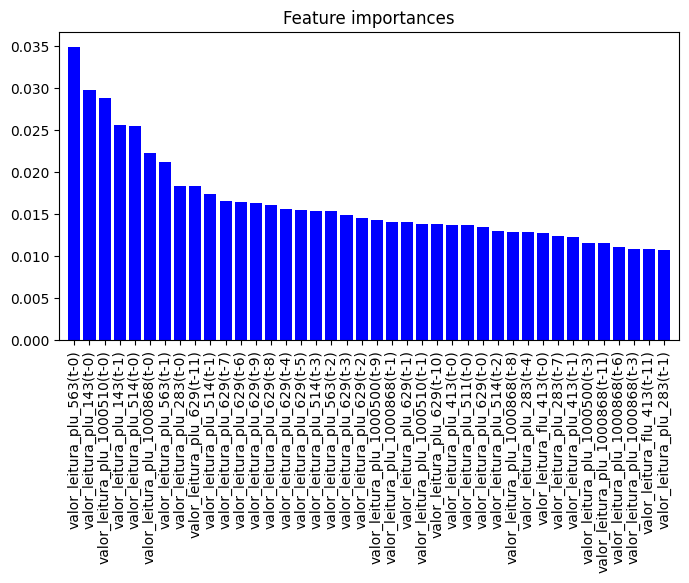

In [449]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 40)

In [450]:
first_element = df_2021[df_2021['intervalo']=='2021-01-01 05:00:00+00:00']['valor_leitura_flu_413'].to_numpy()[0]
y_val_reconstructed =pd.concat([df_2021_new[12:-12],df_2022_new[12:-12]], axis = 0)['valor_leitura_flu_413'].to_numpy()
prediction_reconstructed = reconstruct(prediction,y_val_reconstructed,first_element)

mse = mean_squared_error(prediction_reconstructed, y_val_reconstructed)
rmse = np.sqrt(mse)
print('RMSE:', rmse)
nse = he.evaluator(he.nse, prediction_reconstructed, y_val_reconstructed)
nse = nse[0]
print('NSE:', nse)

RMSE: 14.119841254745245
NSE: 0.9721382388886913


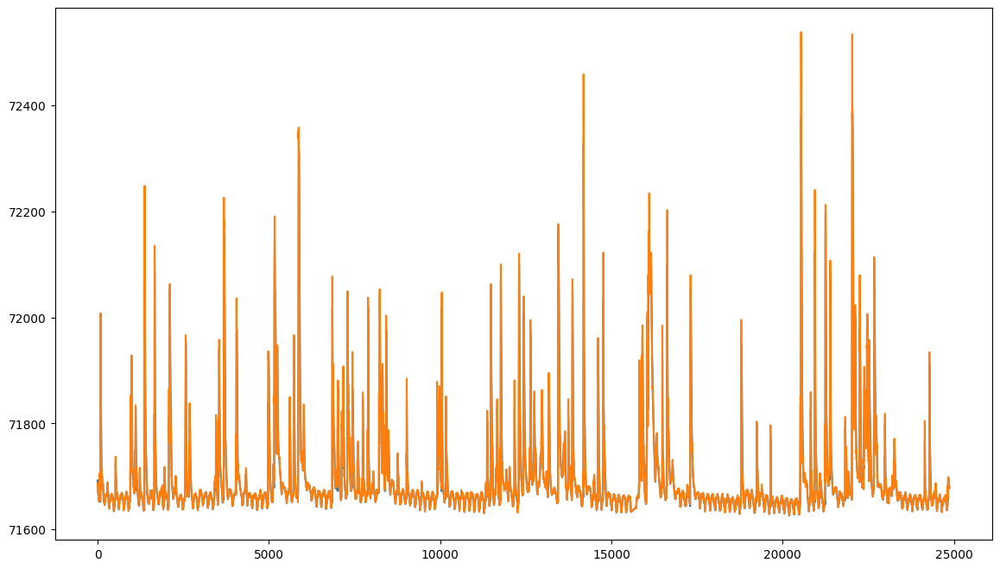

In [451]:
plt.figure(figsize=(14,8))
plt.plot(y_val_reconstructed)
plt.plot(prediction_reconstructed)

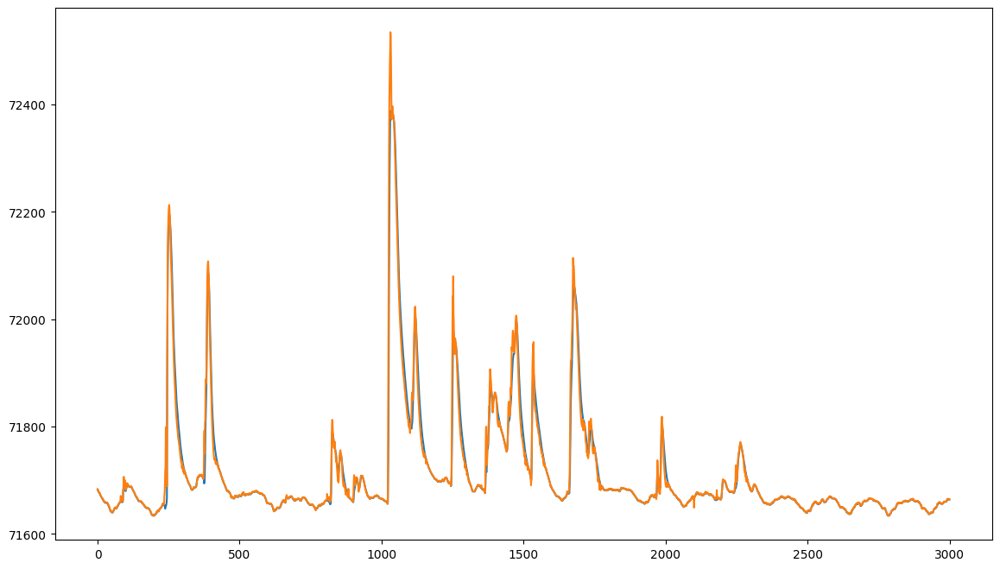

In [452]:
plt.figure(figsize=(14,8))
plt.plot(y_val_reconstructed[21000:24000])
plt.plot(prediction_reconstructed[21000:24000])

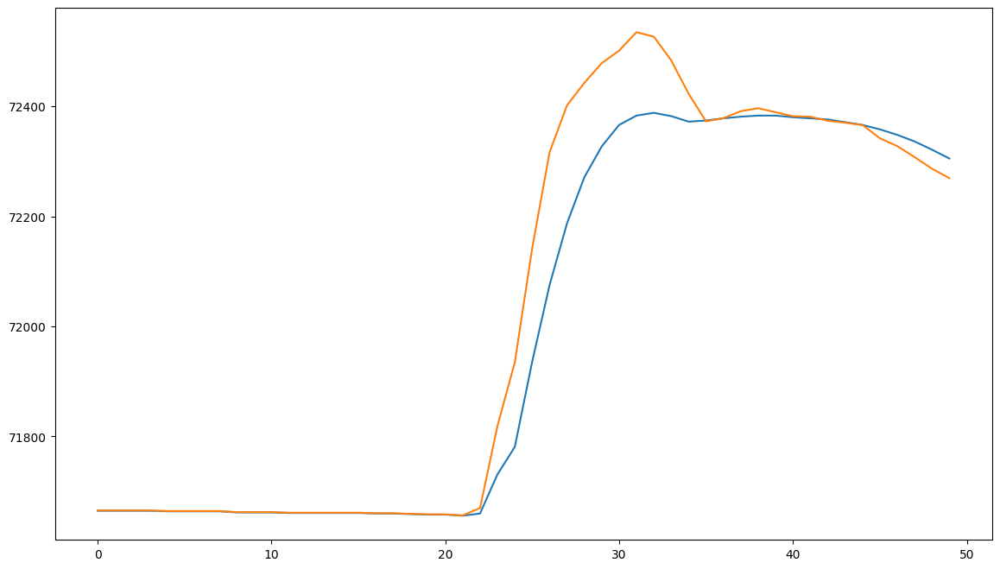

In [454]:
plt.figure(figsize=(14,8))
plt.plot(y_val_reconstructed[22000:22050])
plt.plot(prediction_reconstructed[22000:22050])

## Experimento 5: Análise da influência da escolhida do dataset de treinamento para performance

Experimento 1
Average of RMSE: 44.99652224169266
Average of NSE: 0.71701486041529


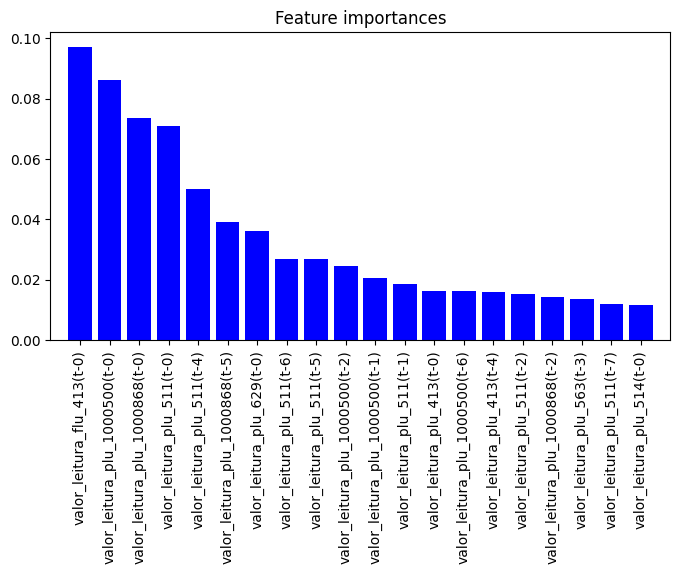

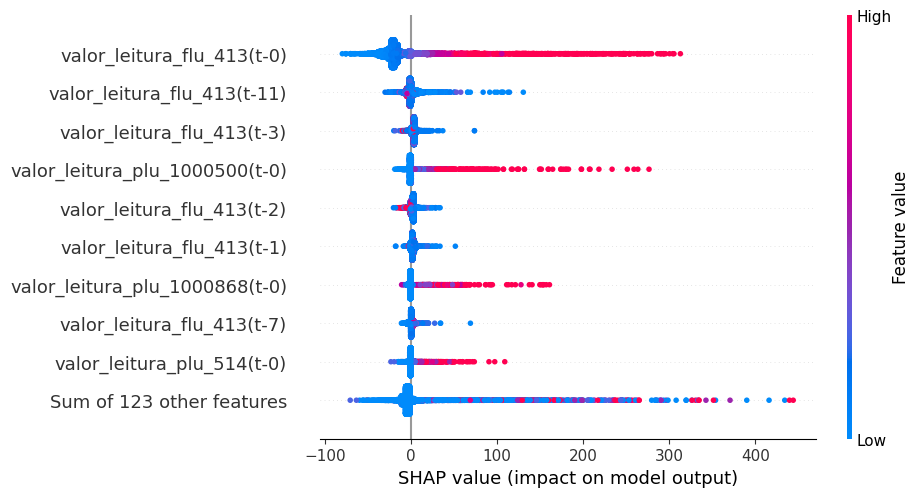

Experimento 2
Average of RMSE: 45.741625703765585
Average of NSE: 0.7075652865401029


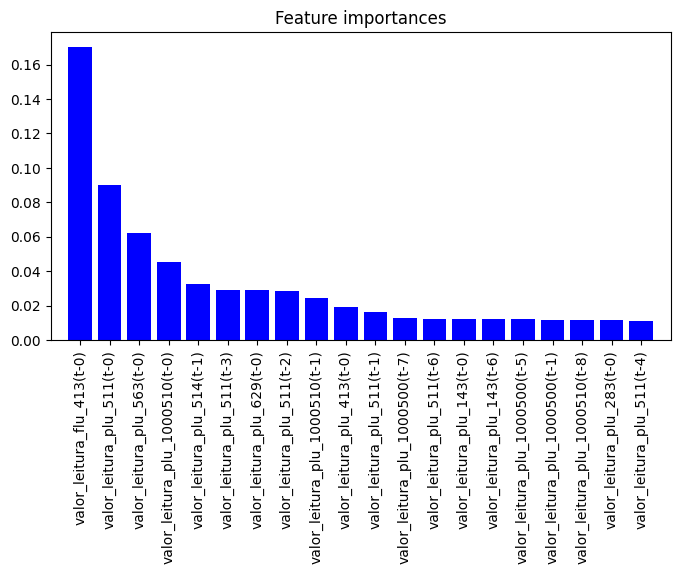

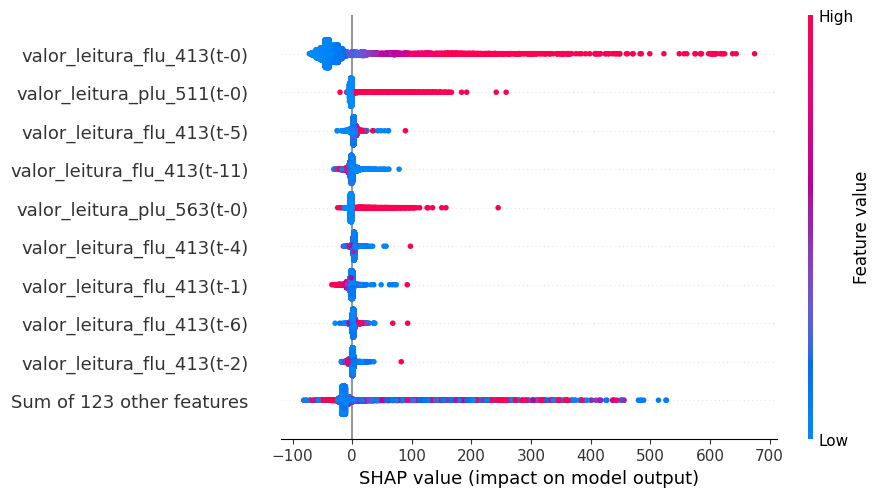

Experimento 3
Average of RMSE: 44.15188899119396
Average of NSE: 0.7275390221725708


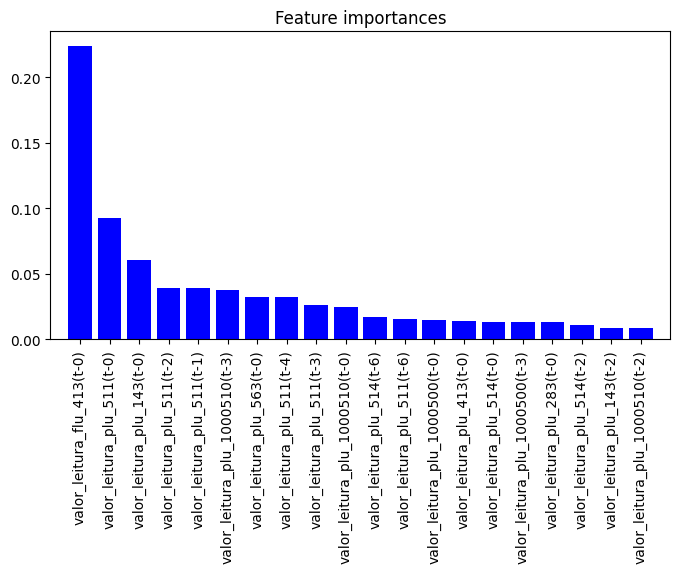

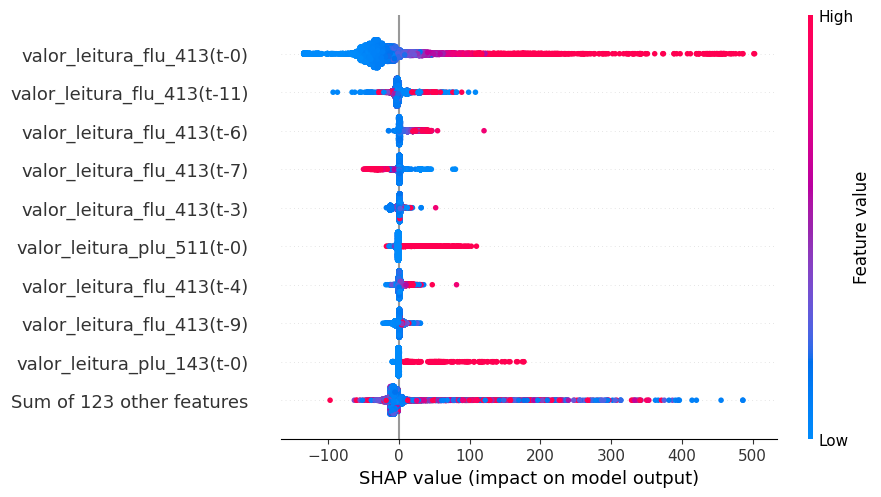

Experimento 4
Average of RMSE: 42.01966704921641
Average of NSE: 0.7532194394437592


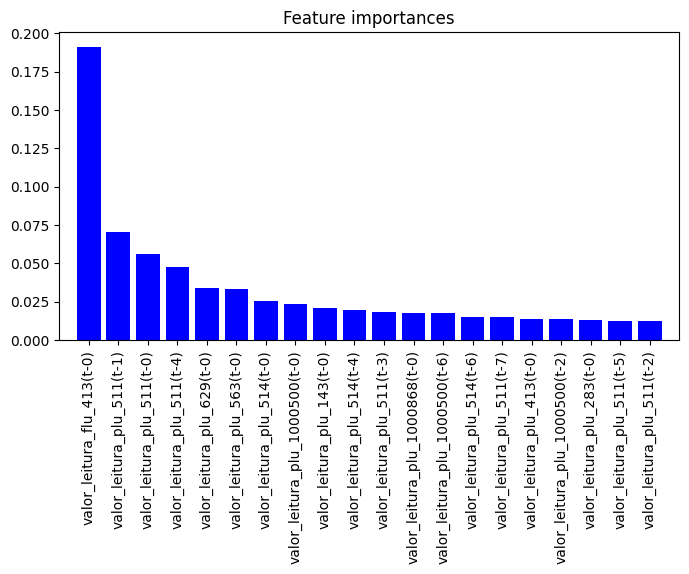

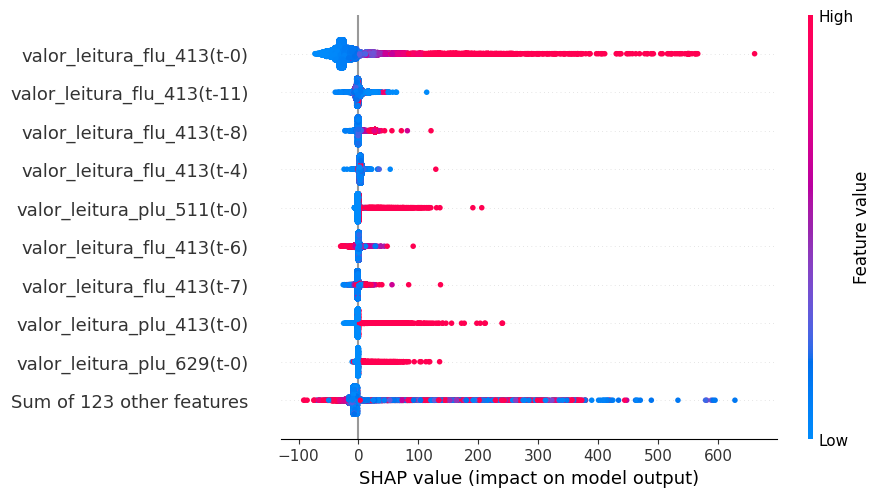

Experimento 5
Average of RMSE: 42.62524654626661
Average of NSE: 0.7460550734865092


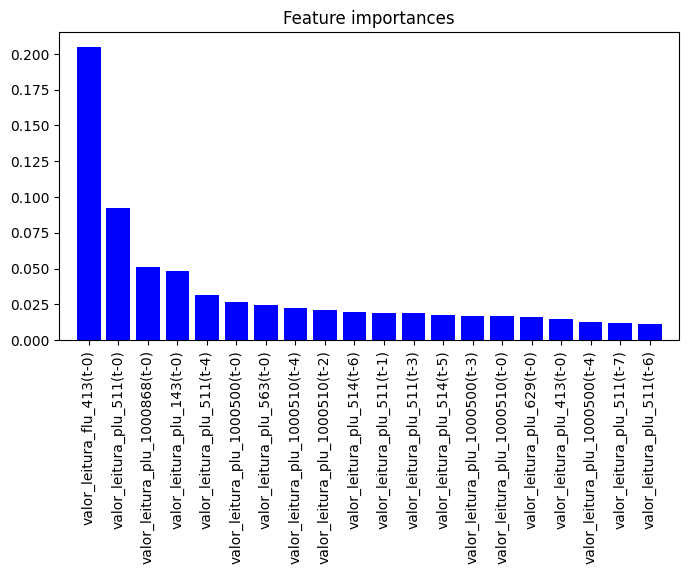

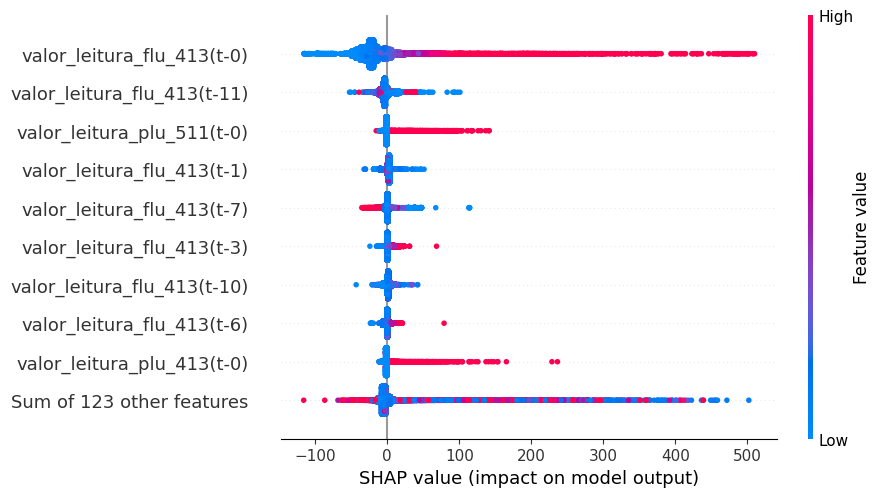

Experimento 6
Average of RMSE: 43.16787845128813
Average of NSE: 0.739548332110262


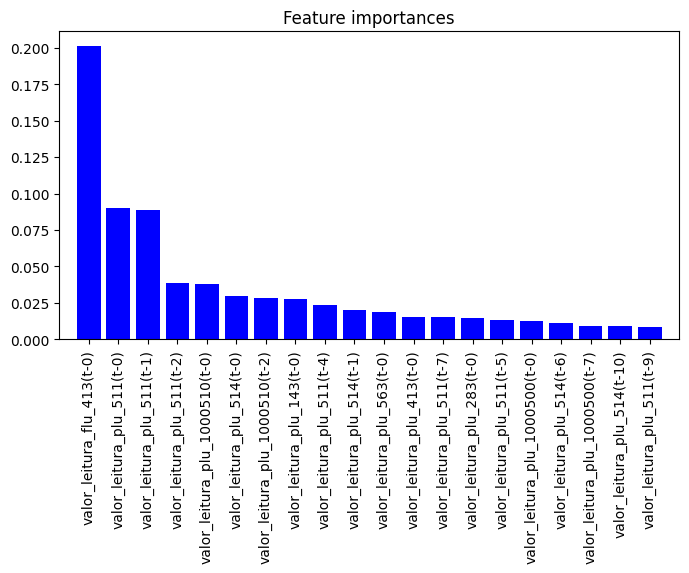

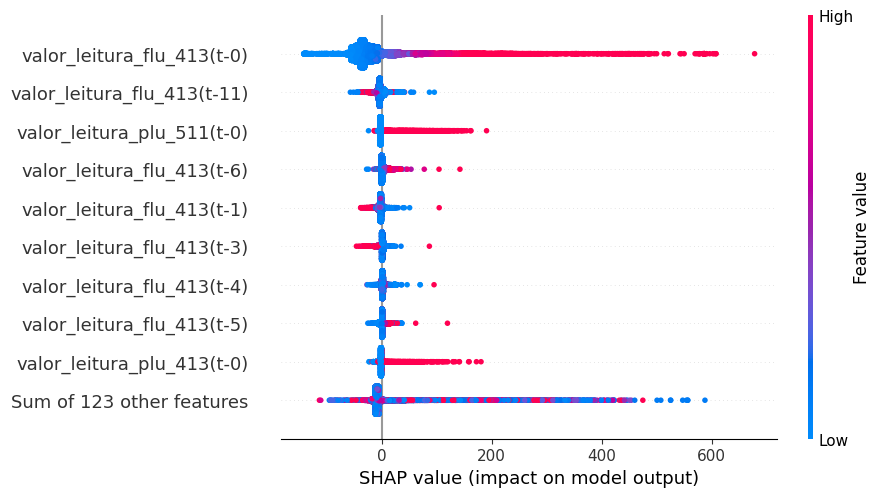

Experimento 7
Average of RMSE: 41.774664099357345
Average of NSE: 0.7560888433469741


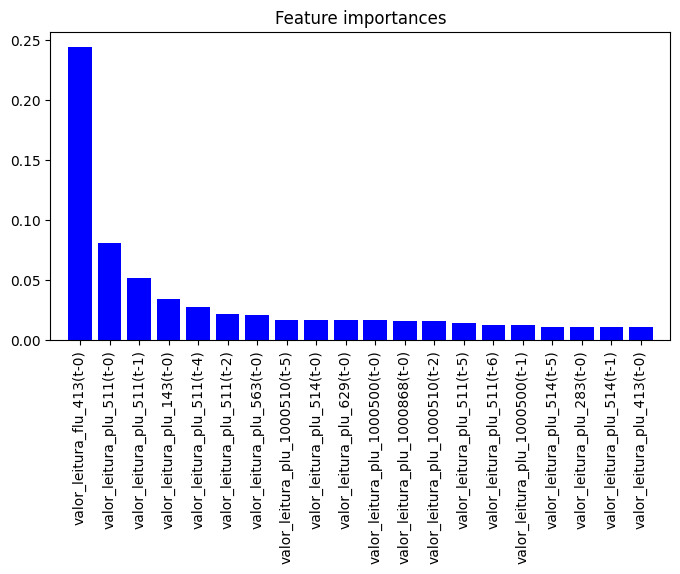

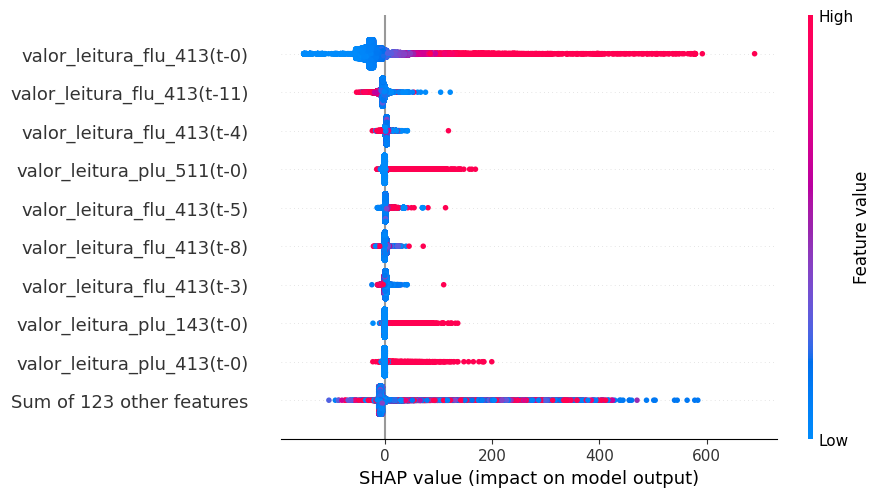

In [125]:
lista_dataframes_treinamento = [[df_2018],[df_2019],[df_2020],[df_2018, df_2019],[df_2018, df_2020],[df_2019, df_2020],[df_2018, df_2019, df_2020]]
j=0

for dataframes_treinamento in lista_dataframes_treinamento:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = dataframes_treinamento, dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # XGBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print(f'Experimento {j+1}')
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 20)
  plt.show()
  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  shap.plots.beeswarm(shap_values)
  j = j+1

## Análise da Capacidade Preditiva de Estações

## Experimento Markoviano para ver se alguém supera o Experimento 5

In [12]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)


entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [22]:
feature_names = X_train_general[entradas].columns

'valor_leitura_flu_143(t-0)'

In [14]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 45.742899640908476
Average of NSE: 0.7998329856037234


(-1.0, 10.0)

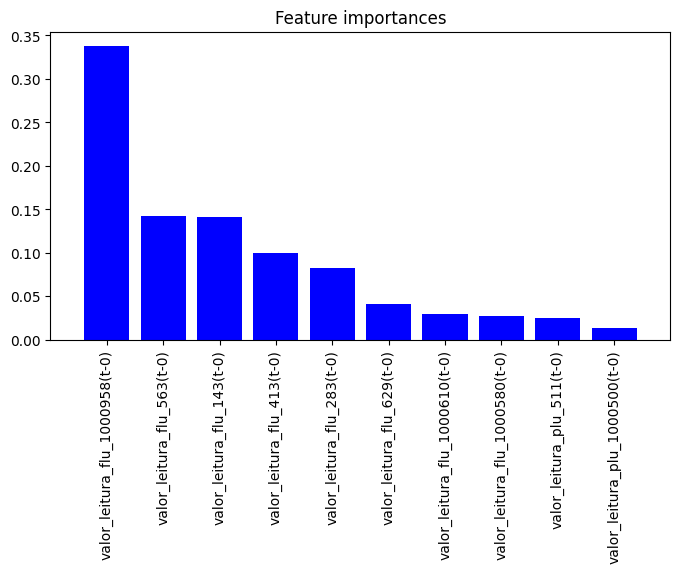

In [26]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

## Experimento com todos os lags para ver se alguém supera o Experimento 5

In [28]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [29]:
feature_names = X_train_general.columns

In [30]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 44.06298579297038
Average of NSE: 0.814265331820194


In [ ]:
indices = np.argsort(importances)[::-1]

n_features_show = 20

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(n_features_show), importances[indices[0:n_features_show]],
        color="b", align="center")
plt.xticks(range(n_features_show), feature_names[indices[0:n_features_show]], rotation='vertical')
plt.xlim([-1, n_features_show])

## Experimento para análise de concept drift (usando Kolmogorov-Smirnov)

In [71]:
for column in df_2018.drop(columns = ['intervalo']).columns:
    statistic, p_value = kstest(df_2018[column], df_2019[column])
    print(f'p_value para {column}:',p_value)

p_value para valor_leitura_flu_143: 0.0
p_value para valor_leitura_flu_283: 0.0
p_value para valor_leitura_flu_413: 0.0
p_value para valor_leitura_flu_563: 0.0
p_value para valor_leitura_flu_629: 0.0
p_value para valor_leitura_flu_1000580: 0.0
p_value para valor_leitura_flu_1000610: 0.0
p_value para valor_leitura_flu_1000958: 9.068524077335024e-207
p_value para valor_leitura_plu_143: 0.022348402271976
p_value para valor_leitura_plu_283: 0.2812444749259584
p_value para valor_leitura_plu_413: 0.07977154453319324
p_value para valor_leitura_plu_511: 0.07977154453319324
p_value para valor_leitura_plu_514: 0.0441051173575725
p_value para valor_leitura_plu_563: 0.07023247137473454
p_value para valor_leitura_plu_629: 0.0725214223672268
p_value para valor_leitura_plu_1000500: 0.03579892850311839
p_value para valor_leitura_plu_1000510: 0.06583845277399503
p_value para valor_leitura_plu_1000868: 0.17657216966434708


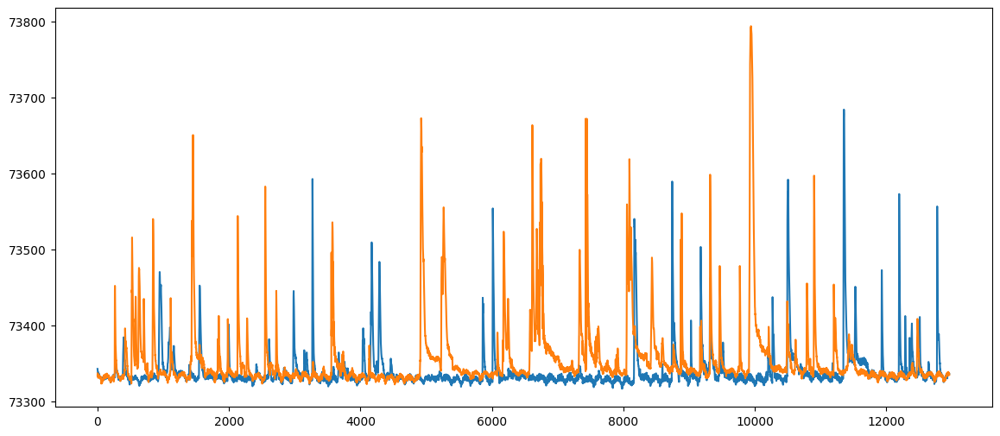

In [85]:
plt.figure(figsize=(14,6))

# plt.plot(df_2018['intervalo'],df_2018['valor_leitura_flu_143'])
# plt.plot(df_2019['intervalo'],df_2019['valor_leitura_flu_143'])

plt.plot(df_2018['valor_leitura_flu_143'])
plt.plot(df_2019['valor_leitura_flu_143'])

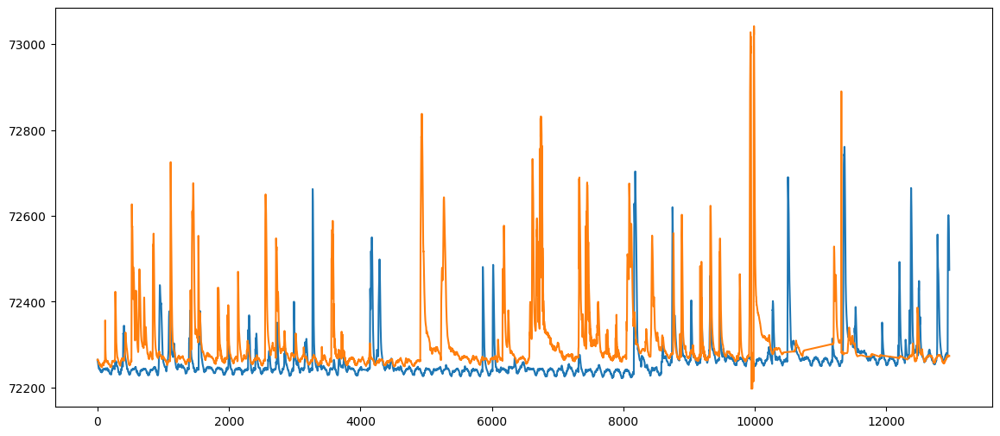

In [89]:
plt.figure(figsize=(14,6))

# plt.plot(df_2018['intervalo'],df_2018['valor_leitura_flu_143'])
# plt.plot(df_2019['intervalo'],df_2019['valor_leitura_flu_143'])

plt.plot(df_2018['valor_leitura_flu_283'])
plt.plot(df_2019['valor_leitura_flu_283'])

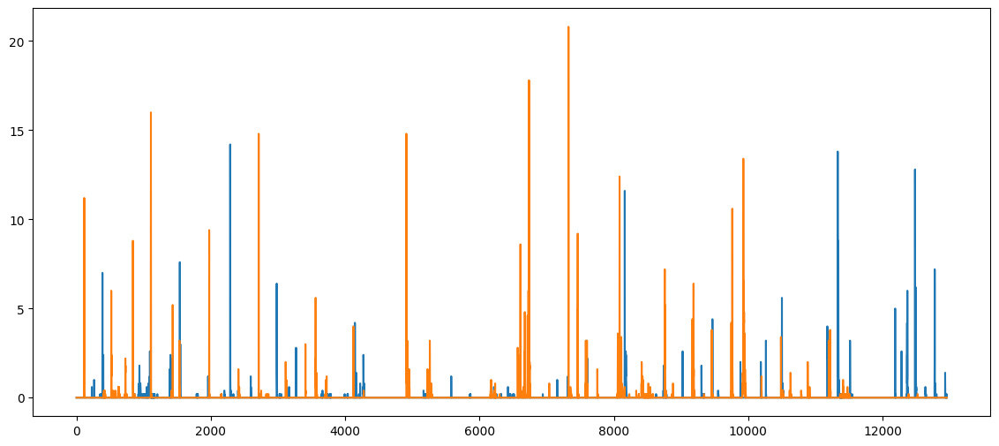

In [87]:
plt.figure(figsize=(14,6))

# plt.plot(df_2018['intervalo'],df_2018['valor_leitura_flu_143'])
# plt.plot(df_2019['intervalo'],df_2019['valor_leitura_flu_143'])

plt.plot(df_2018['valor_leitura_plu_1000868'])
plt.plot(df_2019['valor_leitura_plu_1000868'])

Conclusão: Enquanto as séries temporais de chuva tendem a manter a mesma distribuição de um ano para outro, o mesmo não ocorre com as séries temporais de nível de rio.

### Vamos considerar agora os dataframes, mas com as variações de nível do rio (e não o nível em si)

In [105]:
for column in df_2018.drop(columns = ['intervalo']).columns:
    statistic, p_value = kstest(df_2018[column].diff().dropna(), df_2019[column].diff().dropna())
    print(f'p_value para {column}:',p_value)

p_value para valor_leitura_flu_143: 1.7406519026119016e-08
p_value para valor_leitura_flu_283: 1.6616516581142926e-22
p_value para valor_leitura_flu_413: 1.6017943503439972e-47
p_value para valor_leitura_flu_563: 1.8730247737320958e-24
p_value para valor_leitura_flu_629: 1.5945000533645733e-11
p_value para valor_leitura_flu_1000580: 7.245548637972463e-07
p_value para valor_leitura_flu_1000610: 1.5136756587194078e-16
p_value para valor_leitura_flu_1000958: 8.624935485484044e-14
p_value para valor_leitura_plu_143: 0.3804461324202312
p_value para valor_leitura_plu_283: 0.8230645372297938
p_value para valor_leitura_plu_413: 0.5487562713560958
p_value para valor_leitura_plu_511: 0.6837678881819824
p_value para valor_leitura_plu_514: 0.5386523686904796
p_value para valor_leitura_plu_563: 0.6733164594901455
p_value para valor_leitura_plu_629: 0.8409749983892495
p_value para valor_leitura_plu_1000500: 0.6105337934338037
p_value para valor_leitura_plu_1000510: 0.7556978612296894
p_value para va

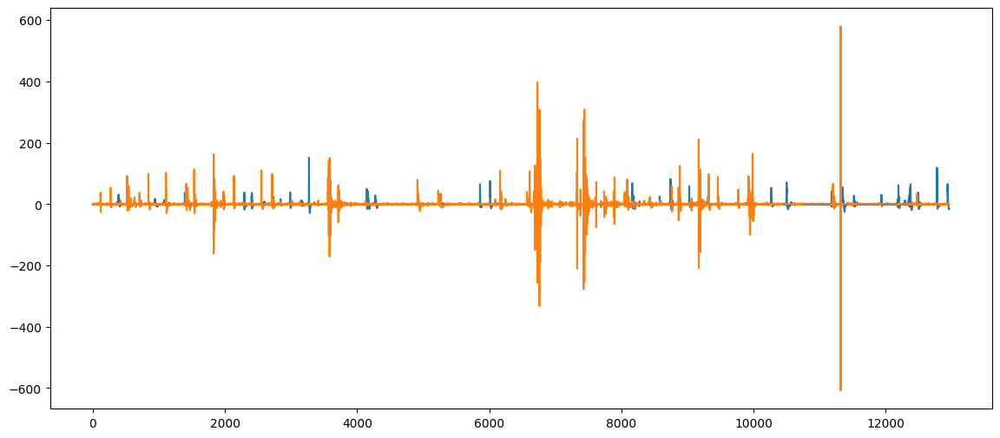

In [103]:
plt.figure(figsize=(14,6))

# plt.plot(df_2018['intervalo'],df_2018['valor_leitura_flu_143'])
# plt.plot(df_2019['intervalo'],df_2019['valor_leitura_flu_143'])

plt.plot(df_2018['valor_leitura_flu_283'].diff())
plt.plot(df_2019['valor_leitura_flu_283'].diff())

In [ ]:
fig = px.line(df_2018, x='intervalo', y='valor_leitura_flu_143')
fig.show()

In [ ]:
fig = px.line(x=df_2018['intervalo'], y=df_2018['valor_leitura_flu_143'].diff())
fig = px.line(x=df_2019['intervalo'], y=df_2019['valor_leitura_flu_143'].diff())
fig.show()

In [117]:
df_2018

,intervalo,valor_leitura_flu_143,valor_leitura_flu_283,valor_leitura_flu_413,valor_leitura_flu_563,valor_leitura_flu_629,valor_leitura_flu_1000580,valor_leitura_flu_1000610,valor_leitura_flu_1000958,valor_leitura_plu_143,valor_leitura_plu_283,valor_leitura_plu_413,valor_leitura_plu_511,valor_leitura_plu_514,valor_leitura_plu_563,valor_leitura_plu_629,valor_leitura_plu_1000500,valor_leitura_plu_1000510,valor_leitura_plu_1000868
0,2018-01-01 02:00:00+00:00,73342.5,72264.600,71707.500,74574.59,72840.400,77205.800,309.5,72447.90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
1,2018-01-01 02:10:00+00:00,73342.0,72263.700,71705.200,74574.59,72840.400,77205.500,309.2,72447.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
2,2018-01-01 02:20:00+00:00,73341.1,72263.100,71703.695,74574.59,72840.695,77205.500,308.3,72446.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
3,2018-01-01 02:30:00+00:00,73340.0,72262.500,71702.000,74574.59,72840.500,77205.700,307.8,72444.90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
4,2018-01-01 02:40:00+00:00,73339.1,72261.900,71700.300,74574.00,72840.100,77205.500,307.0,72443.91,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12955,2018-04-01 01:10:00+00:00,73335.8,72540.195,72043.700,74601.50,72849.200,77215.100,364.8,72712.20,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.25,0.0
12956,2018-04-01 01:20:00+00:00,73335.8,72523.800,72030.900,74600.00,72848.800,77215.600,361.5,72694.80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
12957,2018-04-01 01:30:00+00:00,73335.8,72506.300,72016.700,74598.40,72848.100,77216.305,358.3,72676.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
12958,2018-04-01 01:40:00+00:00,73335.8,72489.900,72001.800,74596.90,72847.805,77220.695,356.0,72657.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0


# Experimentos com Diferentes Estações de Nível

(Vamos descobrir por que elas atrapalham de um ano para outro)

## Exp. 7: Nível exutório, níveis a montante e todos os pluviômetros da bacia

In [14]:
df_2018_clean = df_2018.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2019_clean = df_2019.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2020_clean = df_2020.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2021_clean = df_2021.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2022_clean = df_2022.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2023_clean = df_2023.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])

### Treino em 2018 e validação em 2020

In [37]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [38]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [39]:
feature_names = X_train_general[entradas].columns

In [40]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 52.558270575501275
Average of NSE: 0.7357425364707157


(-1.0, 10.0)

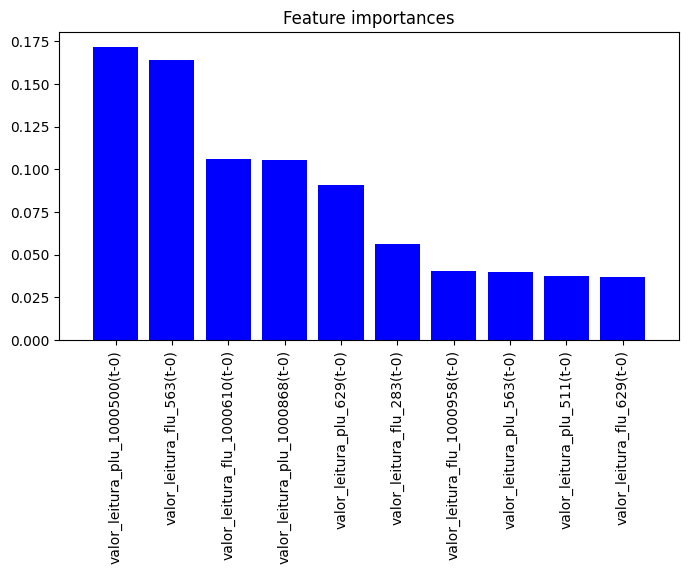

In [41]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:03:17] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



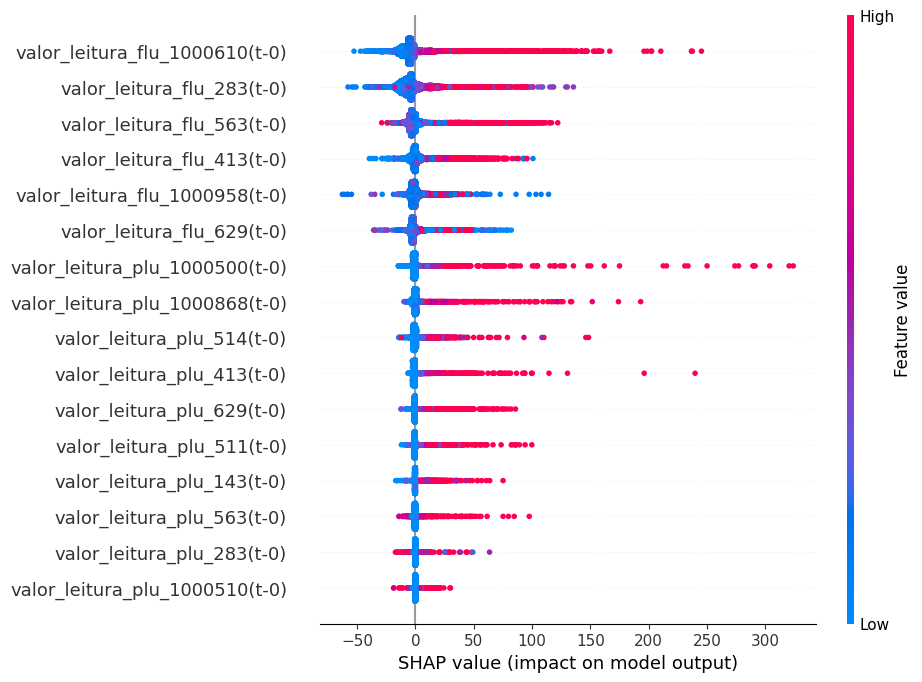

In [42]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### Treino em 2019 e validação em 2020

In [74]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2019_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [75]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [76]:
feature_names = X_train_general[entradas].columns

In [88]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 48.60837070953757
Average of NSE: 0.7739693895198453


(-1.0, 10.0)

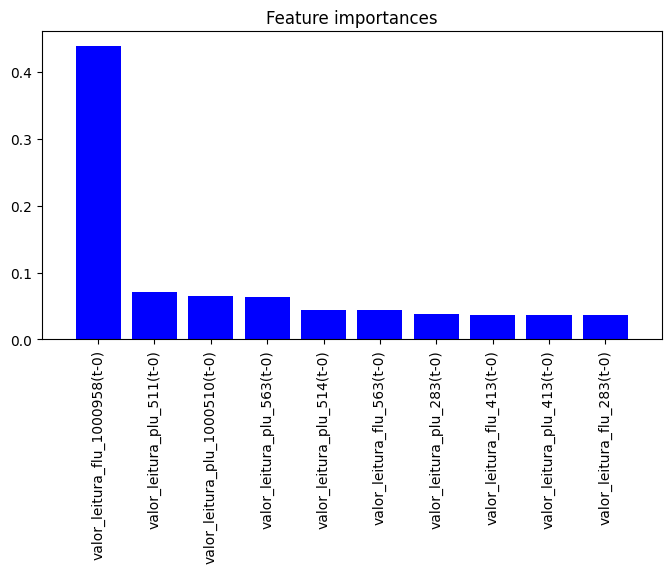

In [89]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

In [90]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:15:38] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 337: invalid start byte

### Treino em 2020 e validação em 2020

In [91]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2020_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [92]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [93]:
feature_names = X_train_general[entradas].columns

In [94]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 7.841071310680223
Average of NSE: 0.9941183938904005


(-1.0, 10.0)

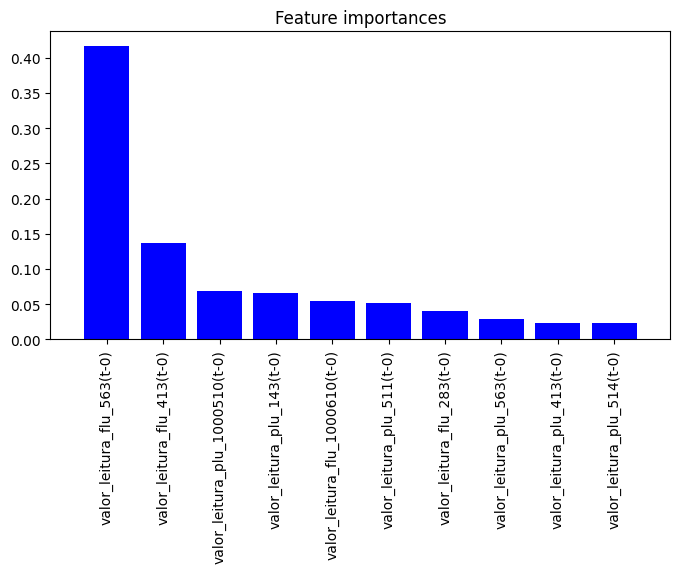

In [95]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:21:08] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



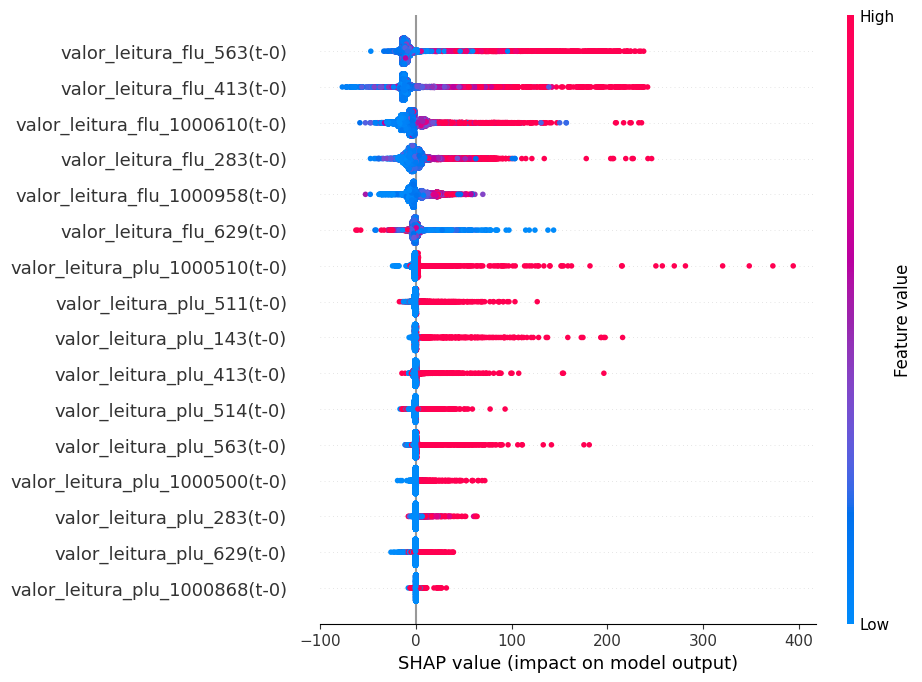

In [96]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### Treino em 2018, 2019 e validação em 2020

In [15]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean, df_2019_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [16]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [17]:
feature_names = X_train_general[entradas].columns

In [18]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 44.95762485243257
Average of NSE: 0.8066465847892026


(-1.0, 10.0)

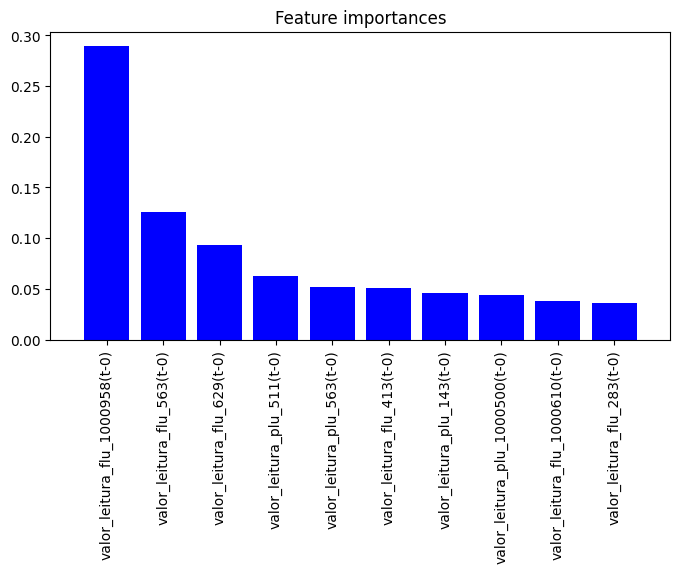

In [19]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

[16:44:14] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


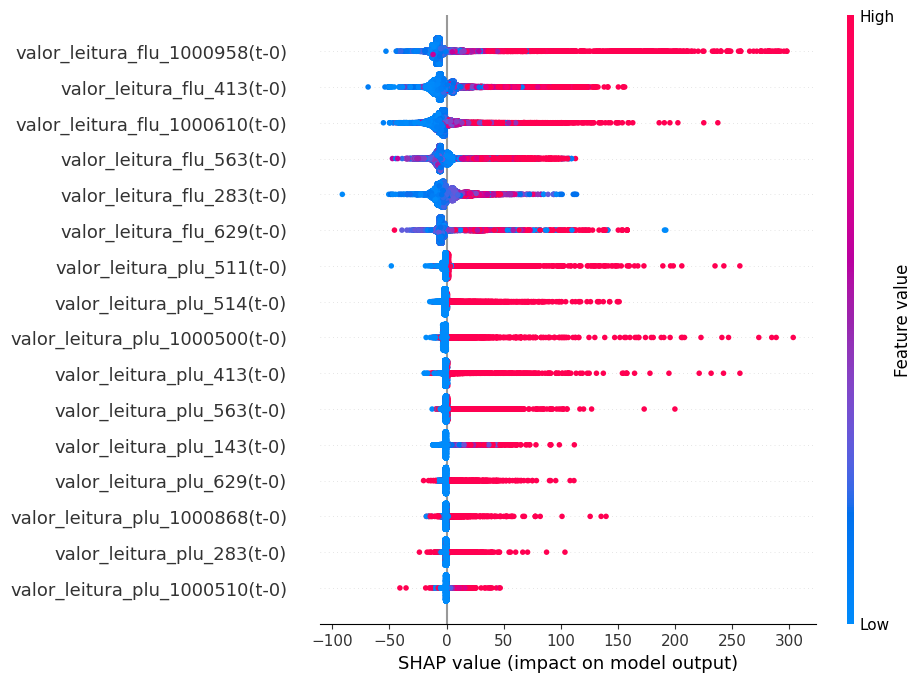

In [20]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### Treino em 2018, 2019, 2020 e validação em 2020 (só para analisar shap values)

In [21]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean, df_2019_clean, df_2020_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [22]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [23]:
feature_names = X_train_general[entradas].columns

In [24]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 18.538951701096344
Average of NSE: 0.9671212365706611


(-1.0, 10.0)

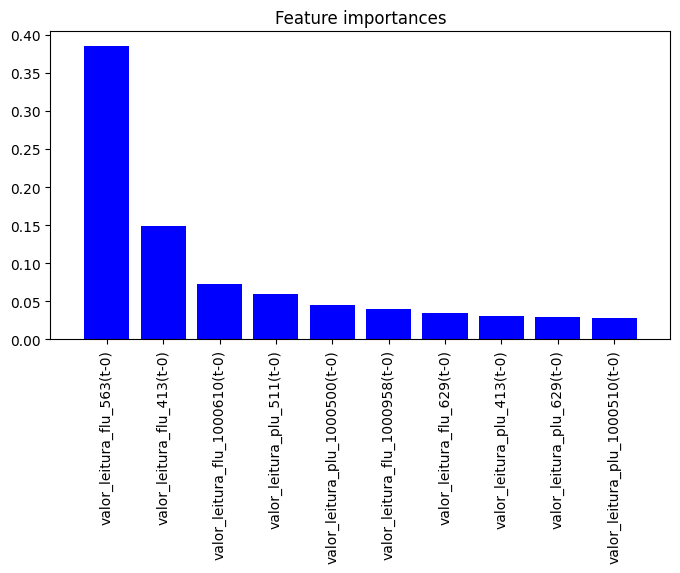

In [25]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

[16:45:19] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


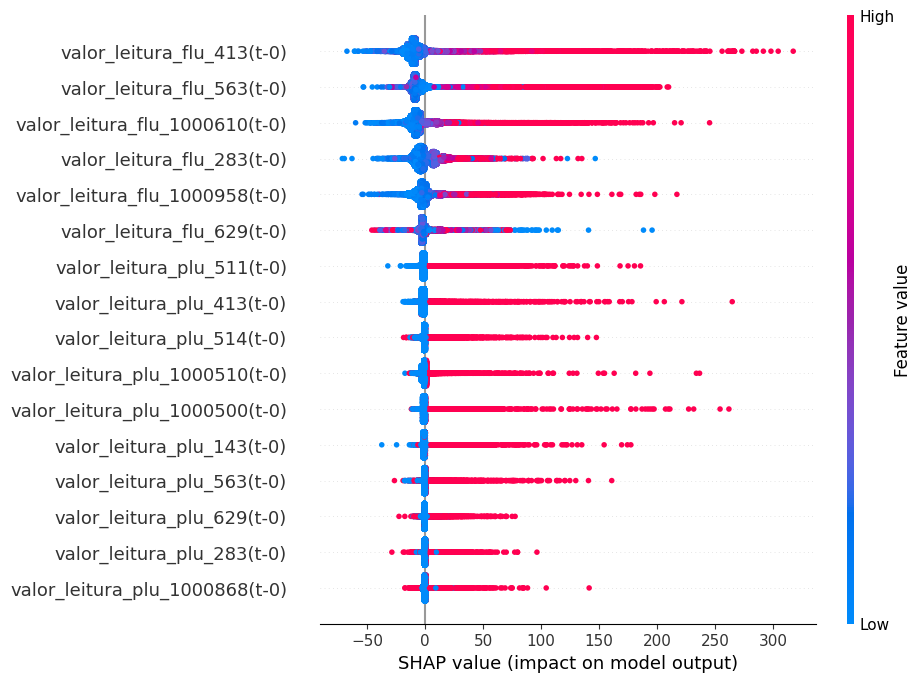

In [26]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

## Testes intratrimestre

### 2018

In [99]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean[0:10000]], dataframes_validacao = [df_2018_clean[10000:]], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [100]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [101]:
feature_names = X_train_general[entradas].columns

In [102]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 54.04133649100374
Average of NSE: 0.6899168076927144


(-1.0, 10.0)

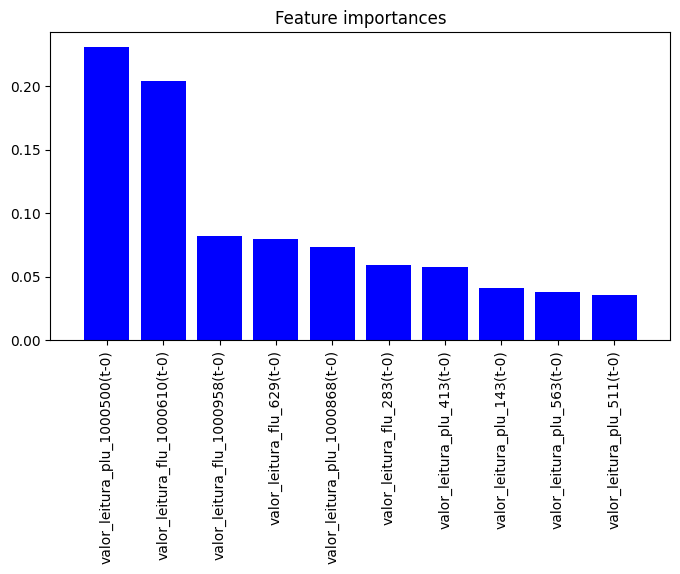

In [103]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:28:17] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



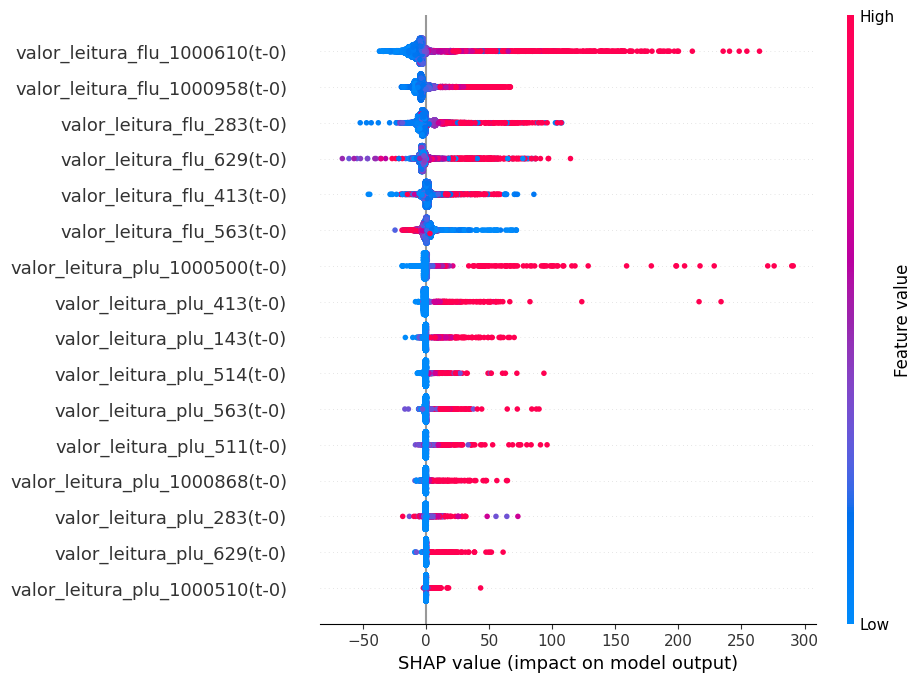

In [104]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### 2019

In [107]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2019_clean[0:10000]], dataframes_validacao = [df_2019_clean[10000:]], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [108]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [109]:
feature_names = X_train_general[entradas].columns

In [110]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 38.9974559889849
Average of NSE: 0.4907408852486278


(-1.0, 10.0)

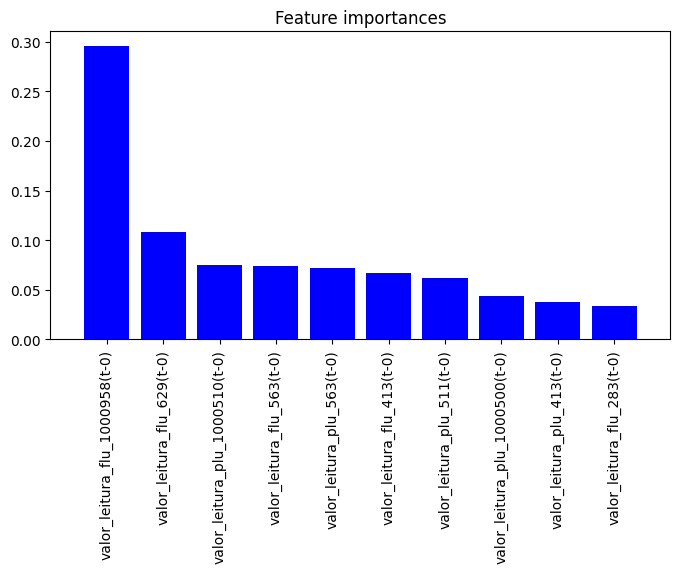

In [111]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:28:54] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



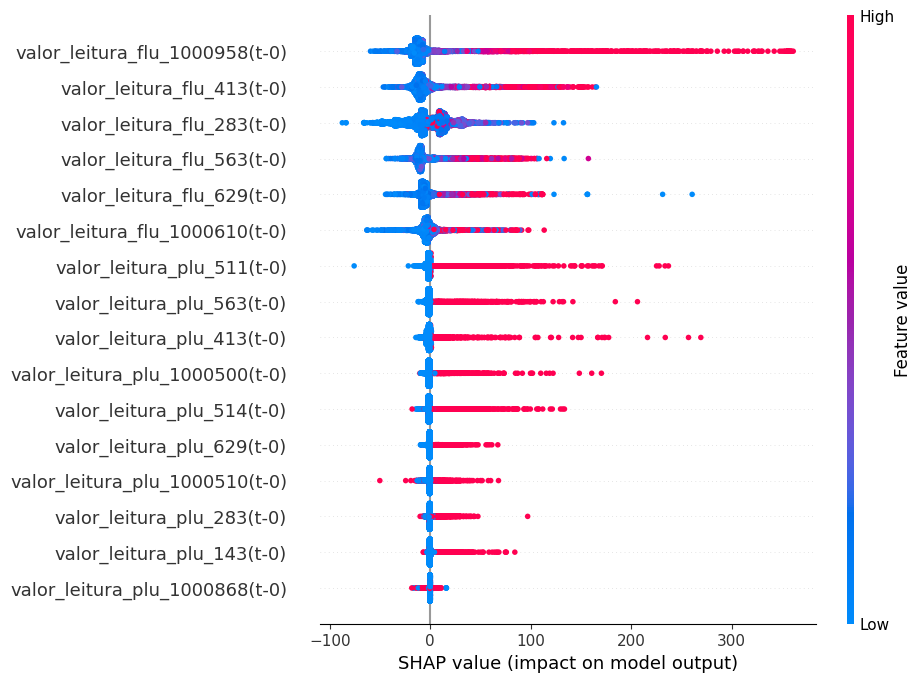

In [112]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### 2020

In [125]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2020_clean[0:10000]], dataframes_validacao = [df_2020_clean[10000:]], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [126]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [127]:
feature_names = X_train_general[entradas].columns

In [128]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 34.59230661942416
Average of NSE: 0.025626553831458843


(-1.0, 10.0)

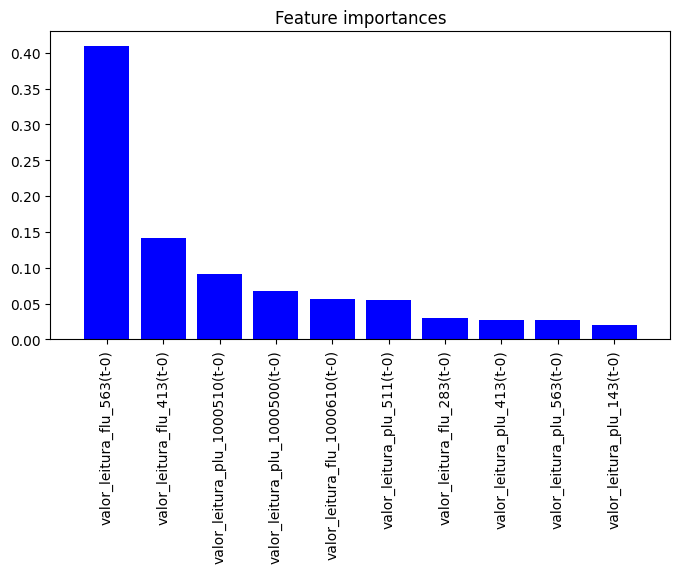

In [117]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:29:32] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



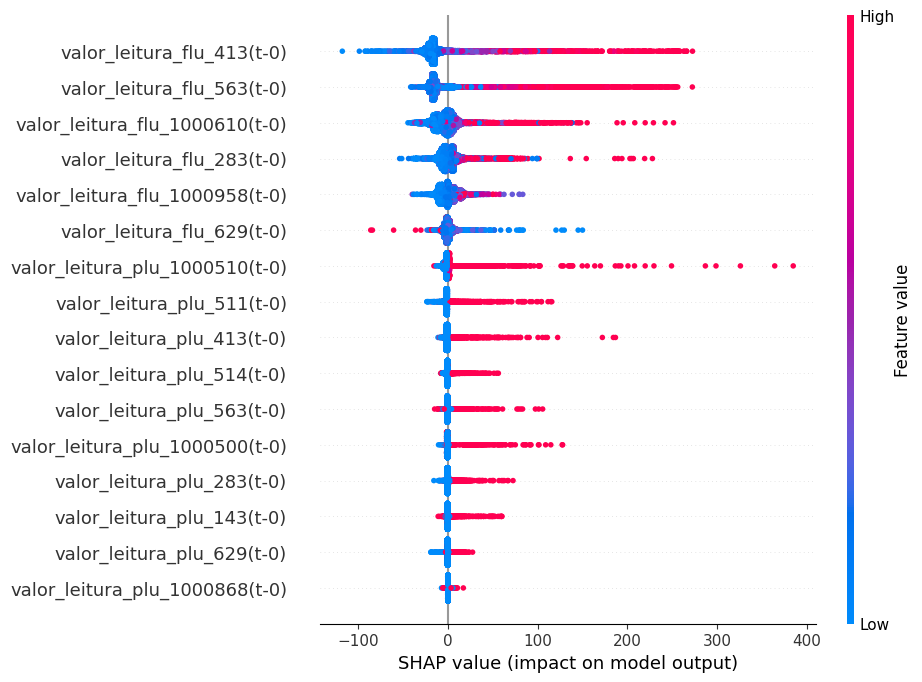

In [118]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

## Exp. 7 - Menos algums estações fluviométricas que podem estar atrapalhando

In [212]:
df_2018_clean = df_2018.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2019_clean = df_2019.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2020_clean = df_2020.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2021_clean = df_2021.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2022_clean = df_2022.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])
df_2023_clean = df_2023.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])

### Treino em 2018 e 2019 e validação em 2020

In [213]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean,df_2019_clean], dataframes_validacao = [df_2020_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [232]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

#entradas = [x for x in entradas if x not in ['valor_leitura_flu_283(t-0)','valor_leitura_flu_629(t-0)','valor_leitura_flu_1000958(t-0)','valor_leitura_flu_1000610(t-0)','valor_leitura_flu_563(t-0)','valor_leitura_flu_413(t-0)']]
entradas = [x for x in entradas if x not in ['valor_leitura_flu_629(t-0)']]
#entradas = [x for x in entradas if x not in ['valor_leitura_flu_1000610(t-0)']]

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [233]:
feature_names = X_train_general[entradas].columns

In [234]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 43.76388218017392
Average of NSE: 0.8167783416284764


(-1.0, 10.0)

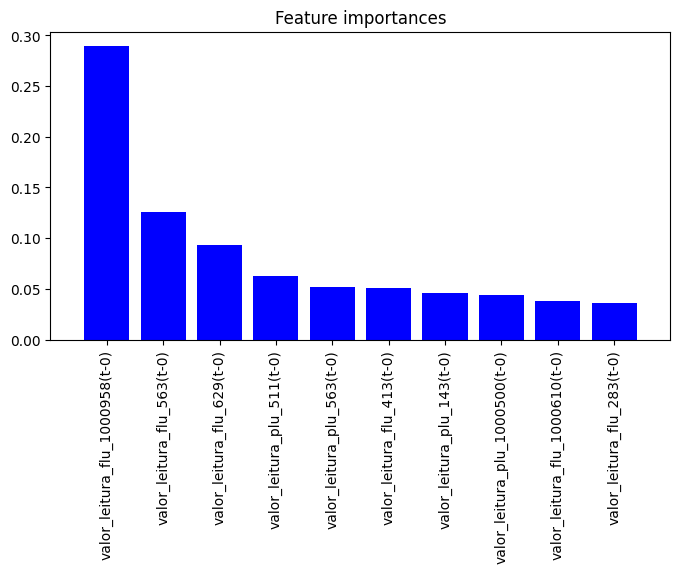

In [211]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:03:17] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



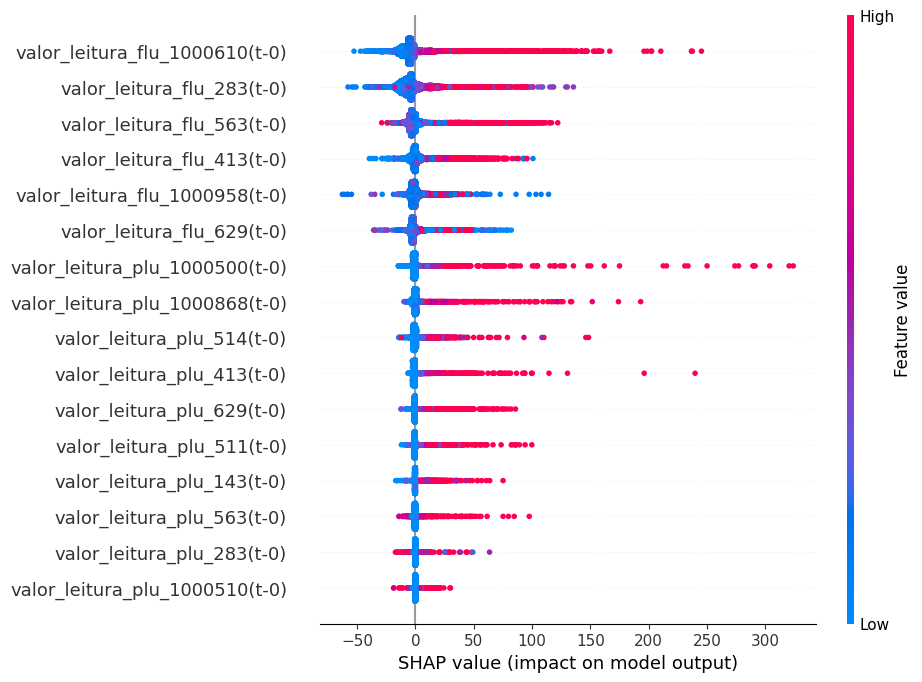

In [ ]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### Treino em 2018 e 2019 e 2020 e testando em 2022

In [277]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2020_clean], dataframes_validacao = [df_2022_clean], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [278]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

#entradas = [x for x in entradas if x not in ['valor_leitura_flu_283(t-0)','valor_leitura_flu_629(t-0)','valor_leitura_flu_1000958(t-0)','valor_leitura_flu_1000610(t-0)','valor_leitura_flu_563(t-0)','valor_leitura_flu_413(t-0)']]
entradas = [x for x in entradas if x not in ['valor_leitura_flu_629(t-0)']]
#entradas = [x for x in entradas if x not in ['valor_leitura_flu_1000610(t-0)']]

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [279]:
feature_names = X_train_general[entradas].columns

In [280]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 54.658702163667385
Average of NSE: 0.6428416735317926


(-1.0, 10.0)

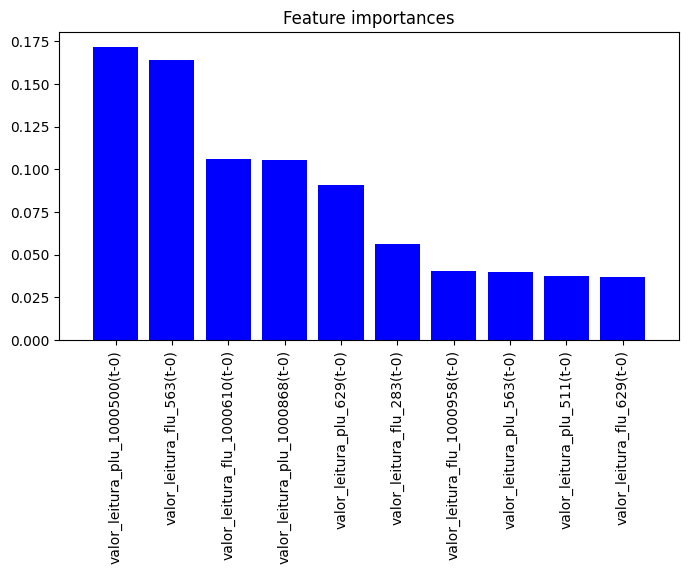

In [ ]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:03:17] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



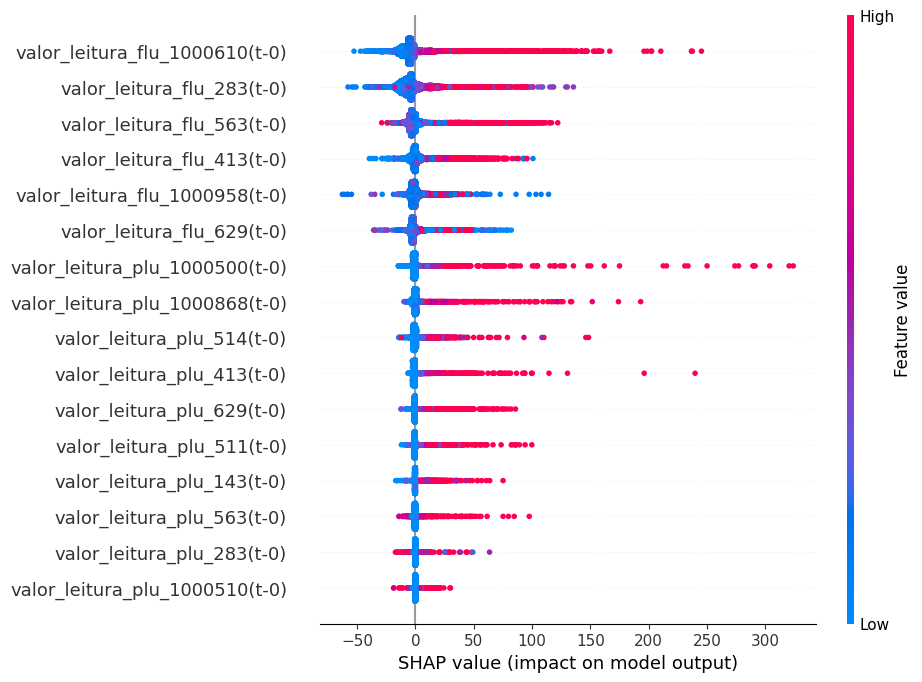

In [ ]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

### Treino em 2018 e 2019 e 2020 e testando em 2021

In [300]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018_clean,df_2019_clean,df_2020_clean], dataframes_validacao = [df_2021_clean.drop(df_2021_clean.index[3000:4000])], dataframes_teste = [df_2023_clean])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

In [316]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

#entradas = [x for x in entradas if x not in ['valor_leitura_flu_283(t-0)','valor_leitura_flu_629(t-0)','valor_leitura_flu_1000958(t-0)','valor_leitura_flu_1000610(t-0)','valor_leitura_flu_563(t-0)','valor_leitura_flu_413(t-0)']]
entradas = [x for x in entradas if x not in ['valor_leitura_flu_283(t-0)']]
#entradas = [x for x in entradas if x not in ['valor_leitura_flu_1000610(t-0)']]

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

In [317]:
feature_names = X_train_general[entradas].columns

In [318]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)

Average of RMSE: 40.373098449322534
Average of NSE: 0.7205640879314976


(-1.0, 10.0)

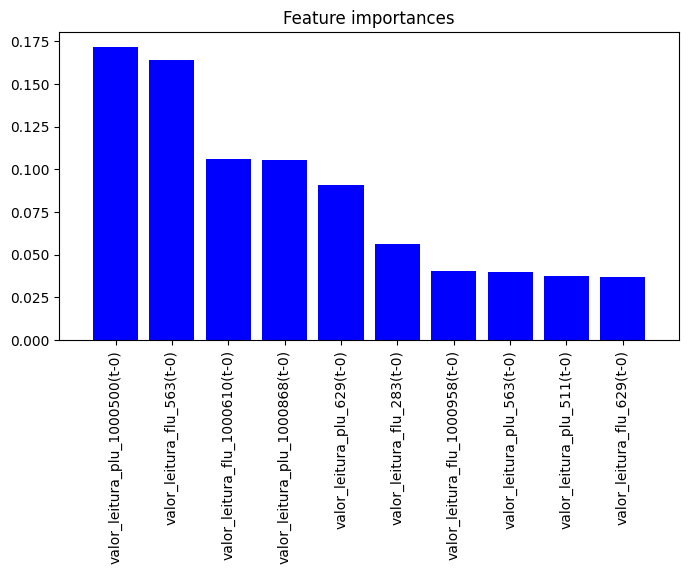

In [ ]:
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(8, 4))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[17:03:17] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/fasttreeshap/plots/_beeswarm.py:663: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



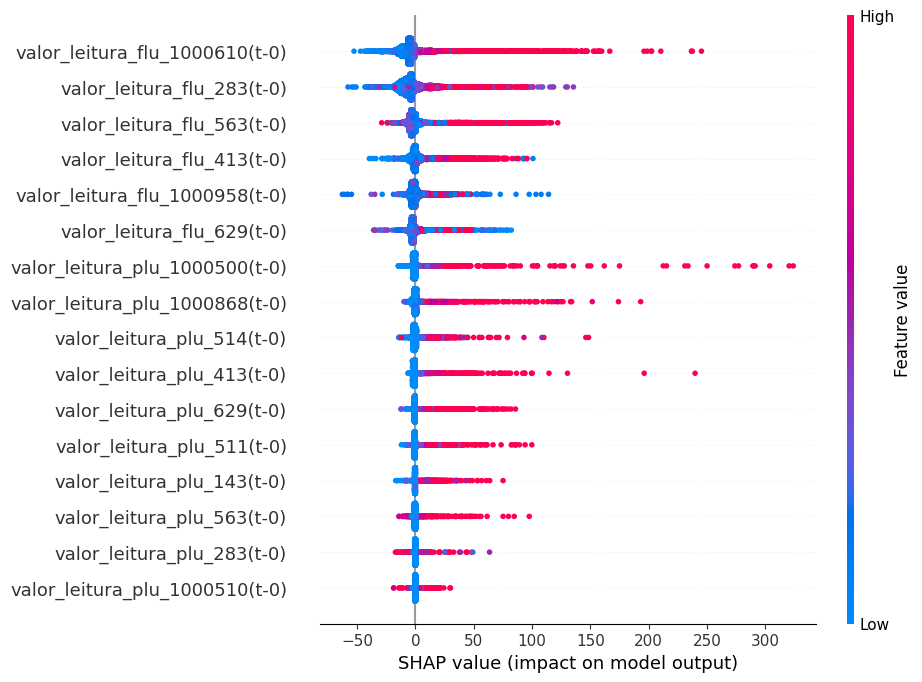

In [ ]:
# compute SHAP values via automatic TreeSHAP algorithm selection (parallel on all cores)
shap_explainer = fasttreeshap.TreeExplainer(model, algorithm = "auto", n_jobs = -1)
shap_values = shap_explainer(X_train_general[entradas]).values
fasttreeshap.summary_plot(shap_values,X_train_general[entradas])

# Análise visual das estações fluviométricas

In [27]:
df_2018.columns

Index(['intervalo', 'valor_leitura_flu_143', 'valor_leitura_flu_283',
       'valor_leitura_flu_413', 'valor_leitura_flu_563',
       'valor_leitura_flu_629', 'valor_leitura_flu_1000580',
       'valor_leitura_flu_1000610', 'valor_leitura_flu_1000958',
       'valor_leitura_plu_143', 'valor_leitura_plu_283',
       'valor_leitura_plu_413', 'valor_leitura_plu_511',
       'valor_leitura_plu_514', 'valor_leitura_plu_563',
       'valor_leitura_plu_629', 'valor_leitura_plu_1000500',
       'valor_leitura_plu_1000510', 'valor_leitura_plu_1000868'],
      dtype='object')

In [129]:
df_2018_grouped = df_2018.groupby(pd.Grouper(key='intervalo', axis=0, freq='12H')).mean()
df_2019_grouped = df_2019.groupby(pd.Grouper(key='intervalo', axis=0, freq='12H')).mean()
df_2020_grouped = df_2020.groupby(pd.Grouper(key='intervalo', axis=0, freq='12H')).mean()
df_2021_grouped = df_2021.groupby(pd.Grouper(key='intervalo', axis=0, freq='12H')).mean()
df_2022_grouped = df_2022.groupby(pd.Grouper(key='intervalo', axis=0, freq='12H')).mean()

In [36]:
#fig = px.line(df_2018_grouped.reset_index(), x='intervalo', y='valor_leitura_flu_413')
fig = px.line(df_2018_grouped.reset_index(), y='valor_leitura_flu_413', markers = True)
fig.add_scatter(y=df_2019_grouped.reset_index()['valor_leitura_flu_413'])
#fig = px.line(df_2019_grouped.reset_index(), y='valor_leitura_flu_413', markers = True)
#fig = px.line(df_2020_grouped.reset_index(), y='valor_leitura_flu_413', markers = True)
fig.show()

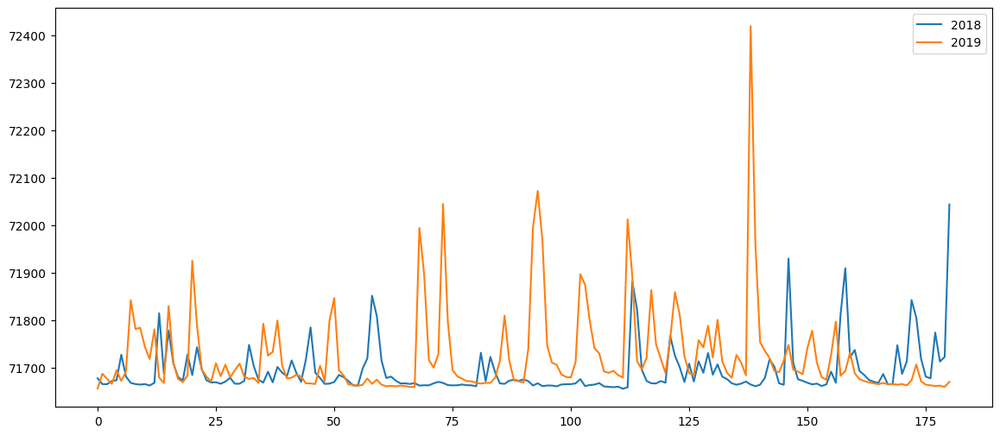

In [131]:
plt.figure(figsize=(14,6))
plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_413'],label = '2018')
plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_413'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_413'],label = '2020')
#plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_413'],label = '2021')
#plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_413'],label = '2022')
plt.legend()

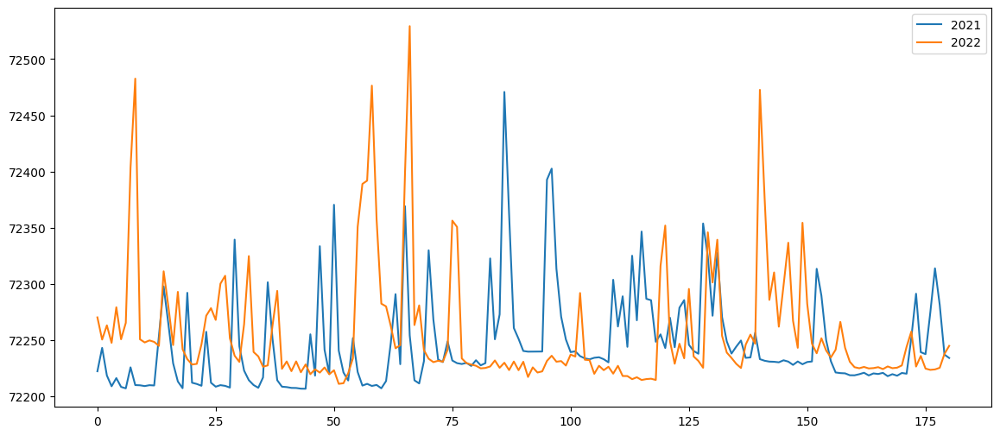

In [116]:
plt.figure(figsize=(14,6))
#plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_283'],label = '2018')
#plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_283'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_283'],label = '2020')
plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_283'],label = '2021')
plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_283'],label = '2022')
plt.legend()

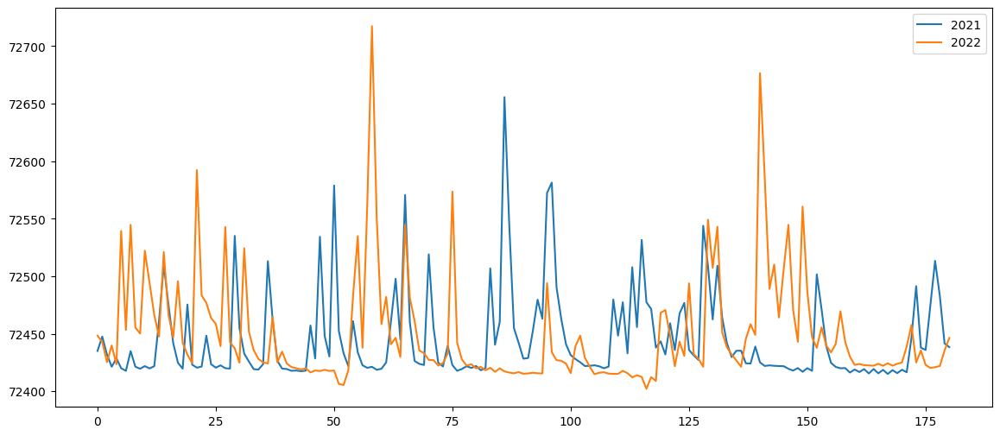

In [123]:
plt.figure(figsize=(14,6))
#plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_1000958'],label = '2018')
#plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_1000958'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_1000958'],label = '2020')
plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_1000958'],label = '2021')
plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_1000958'],label = '2022')
plt.legend()

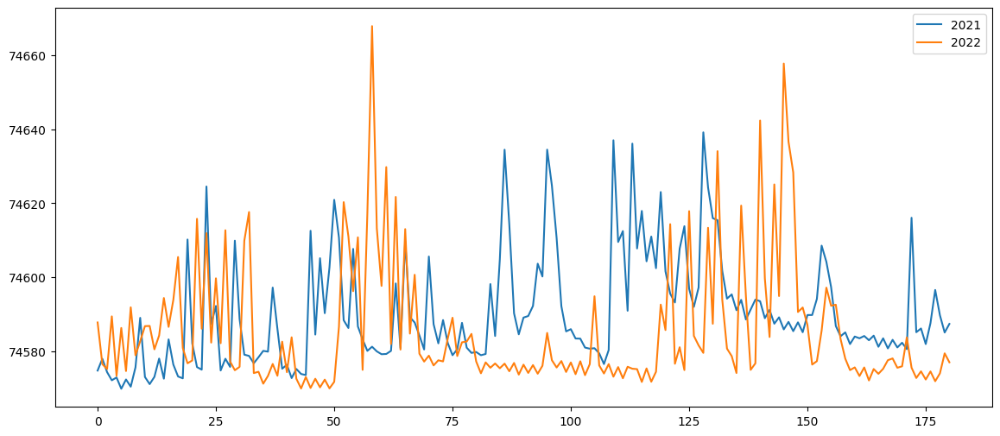

In [128]:
plt.figure(figsize=(14,6))
#plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_563'],label = '2018')
#plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_563'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_563'],label = '2020')
plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_563'],label = '2021')
plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_563'],label = '2022')
plt.legend()

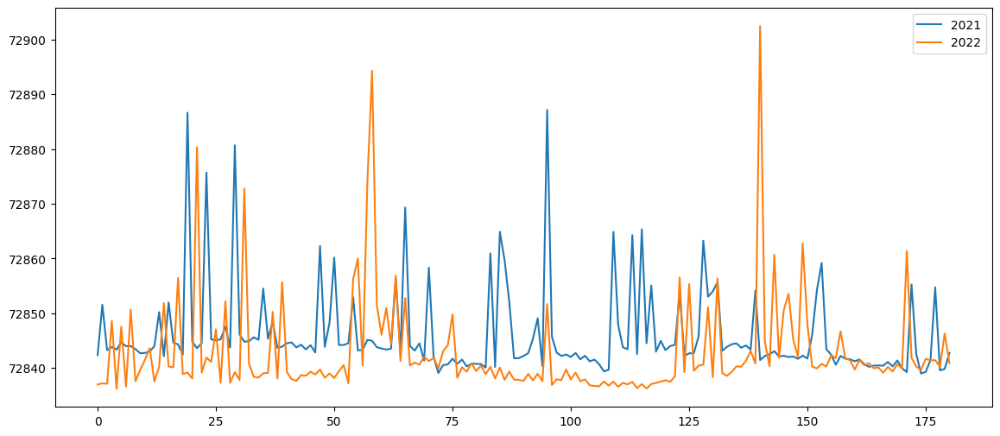

In [133]:
plt.figure(figsize=(14,6))
#plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_629'],label = '2018')
#plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_629'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_629'],label = '2020')
plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_629'],label = '2021')
plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_629'],label = '2022')
plt.legend()

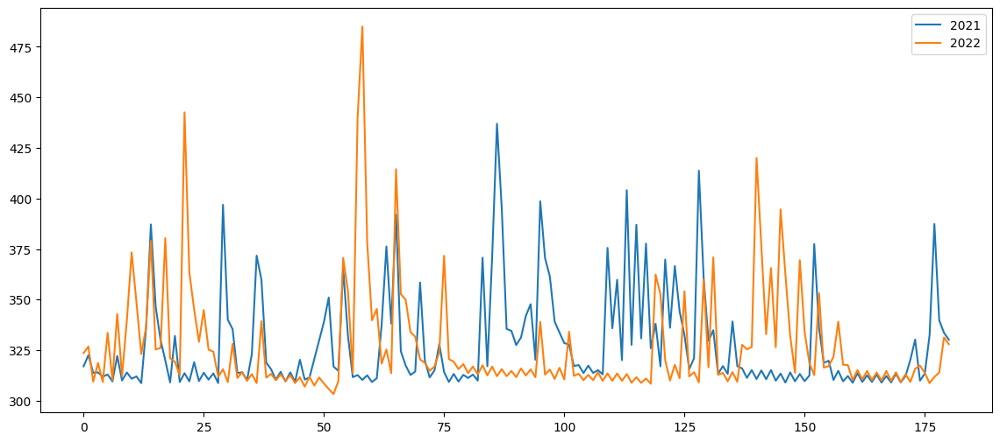

In [324]:
plt.figure(figsize=(14,6))
#plt.plot(df_2018_grouped.reset_index()['valor_leitura_flu_1000610'],label = '2018')
#plt.plot(df_2019_grouped.reset_index()['valor_leitura_flu_1000610'],label = '2019')
#plt.plot(df_2020_grouped.reset_index()['valor_leitura_flu_1000610'],label = '2020')
plt.plot(df_2021_grouped.reset_index()['valor_leitura_flu_1000610'],label = '2021')
plt.plot(df_2022_grouped.reset_index()['valor_leitura_flu_1000610'],label = '2022')
plt.legend()

# Experimentos relativos a Feature Engineering

### Usando todas as features

#### Lags padrão: 12

In [135]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [136]:
feature_names = X_train_general.columns

Average of RMSE: 41.49677372371826
Average of NSE: 0.8352695841905309


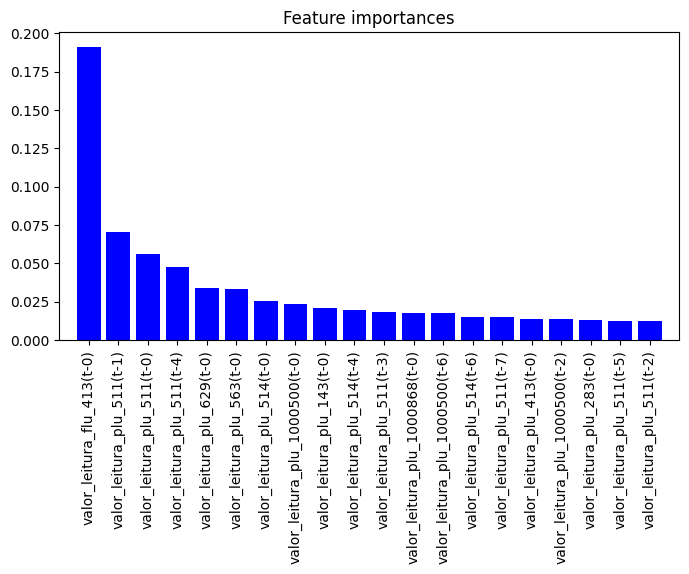

In [137]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

#### Lags: 18

In [139]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], n_lags = 18)
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [140]:
feature_names = X_train_general.columns

Average of RMSE: 41.36296812212335
Average of NSE: 0.8363843875219076


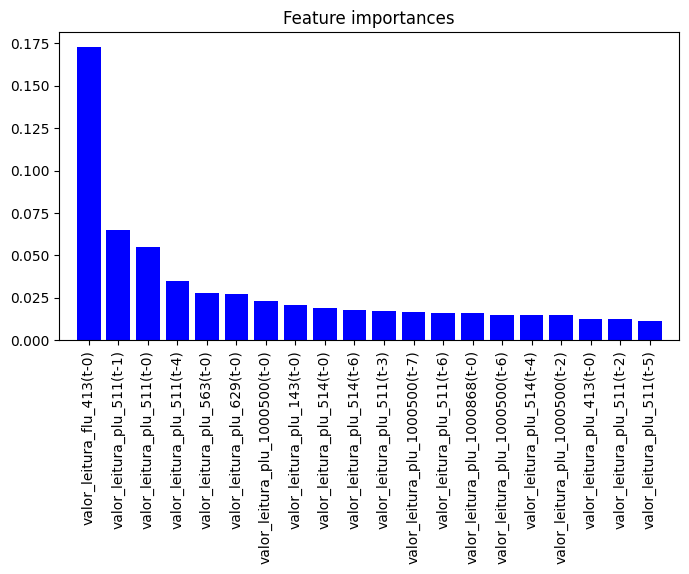

In [141]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

#### Lags: 24

In [142]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], n_lags = 24)
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [143]:
feature_names = X_train_general.columns

Average of RMSE: 42.65593367478013
Average of NSE: 0.8260505719137228


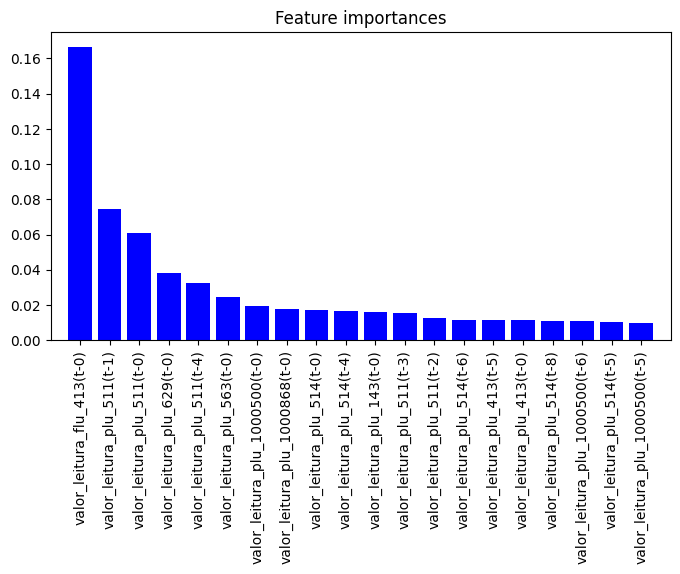

In [144]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

### Usando chuva acumulada

In [193]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

# Feature engineering: accumulated rain
pluviometric_stations = ['valor_leitura_plu_143','valor_leitura_plu_283','valor_leitura_plu_413','valor_leitura_plu_511','valor_leitura_plu_514','valor_leitura_plu_563','valor_leitura_plu_629','valor_leitura_plu_1000500','valor_leitura_plu_1000510','valor_leitura_plu_1000868']
for station in pluviometric_stations:
    list_columns = [column for column in X_train_general.columns if station in column]
    X_train_general[f'{station}_acc'] = X_train_general[list_columns].sum(axis=1)
    X_val_general[f'{station}_acc'] = X_val_general[list_columns].sum(axis=1)
    X_test_general[f'{station}_acc'] = X_test_general[list_columns].sum(axis=1)


entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [194]:
feature_names = X_train_general.columns

Average of RMSE: 41.936353096205
Average of NSE: 0.831761088446861


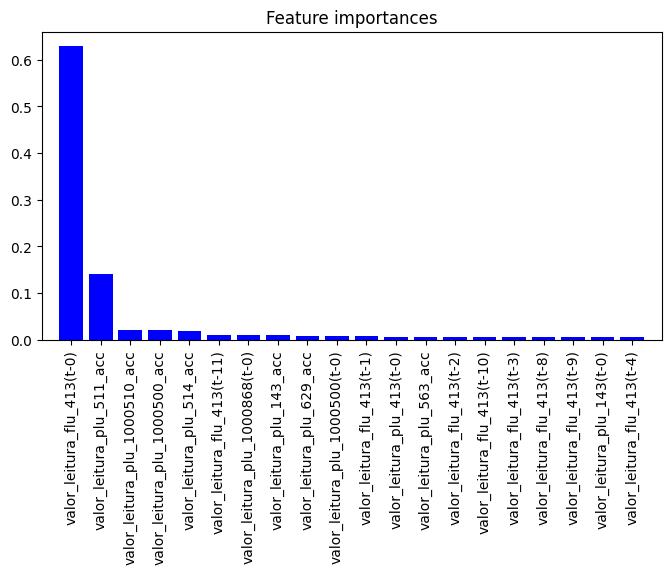

In [195]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [196]:
# Otimizando com Optuna
trial, n_estimators, max_depth, min_samples_split, min_samples_leaf = run_optuna_rf(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'max_depth': max_depth, 'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf}
pickle.dump(parameters, open("parameters/random_forest_with_acc_rain.pkl", "wb")) 
parameters = pickle.load(open("parameters/random_forest_with_acc_rain.pkl", "rb"))

[I 2024-03-31 01:02:00,345] A new study created in memory with name: no-name-cdfdc4a2-93b2-4a78-928b-8875c6245f6a


Average of RMSE: 41.142962061296394
Average of NSE: 0.8380666725990366


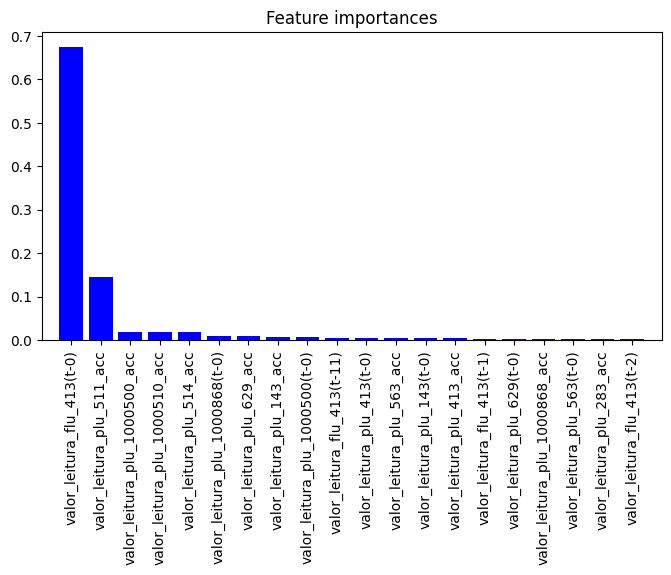

In [197]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest_with_acc_rain.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 41.90778690068784
Average of NSE: 0.8319902122704571


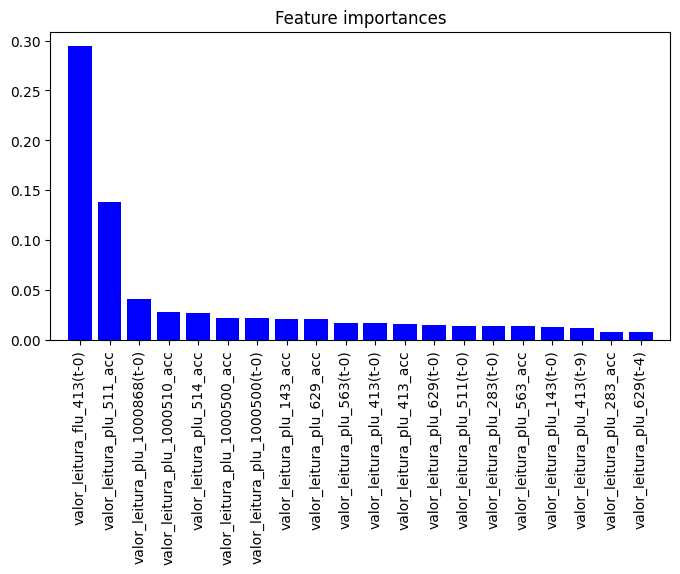

In [198]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [199]:
# Otimizando com Optuna
trial, max_depth, learning_rate , n_estimators, min_child_weight, gamma, subsample, colsample_bytree, reg_alpha, reg_lambda, = run_optuna_xgb(n_trials=50)
parameters = {'trial': trial, 'max_depth': max_depth, 'learning_rate': learning_rate, 'n_estimators': n_estimators, 'min_child_weight': min_child_weight, 'gamma': gamma, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'reg_alpha': reg_alpha, 'reg_lambda': reg_lambda}
pickle.dump(parameters, open("parameters/xgboost_with_acc_rain.pkl", "wb")) 
parameters = pickle.load(open("parameters/xgboost_with_acc_rain.pkl", "rb"))

suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 01:24:30,470] Trial 0 finished with value: 46.56039420330756 and parameters: {'max_depth': 7, 'learning_rate': 0.011002817226254392, 'n_estimators': 650, 'min_child_weight': 8, 'gamma': 9.728728830009641e-05, 'subsample': 0.02815744802026465, 'colsample_bytree': 0.024895779540435023, 'reg_alpha': 0.012140755068184341, 'reg_lambda': 2.2536511574969237e-07}. Best is trial 0 with value: 46.56039420330756.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 01:24:31,596] Trial 1 finished with value: 42.448747721913094 and parameters: {'max_depth': 1, 'learning_rate': 0.23481164807395874, 'n_estimators': 1000, 'min_child_weight': 1, 'gamma': 0.00012518091079635779, 'subsample': 0.4219314744806921, 'colsample_bytree': 0.16790055575223653, 'reg_alpha': 0.005943503728075847, 'reg_lambda': 2.16276107872578

Average of RMSE: 38.526737282787366
Average of NSE: 0.8580061312035729


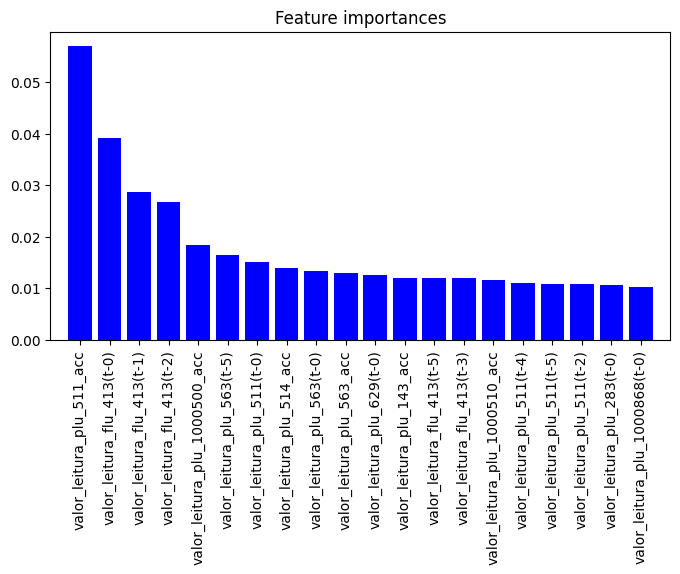

In [200]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost_with_acc_rain.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 40.732328669269585
Average of NSE: 0.8412829407271698


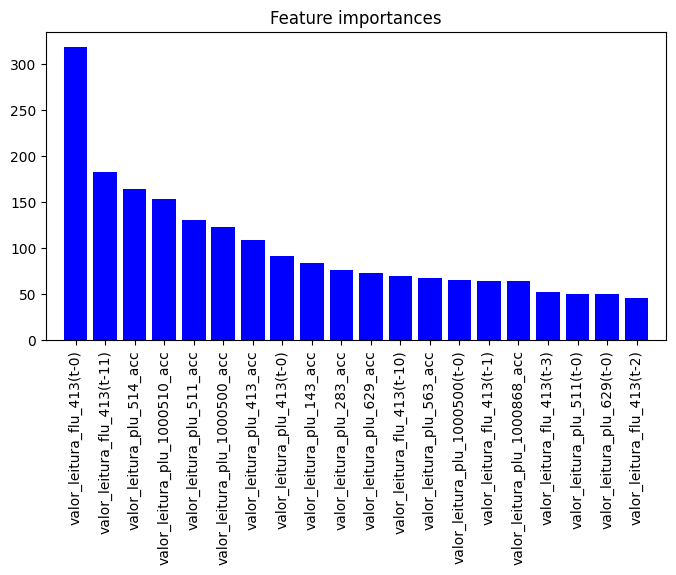

In [181]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [188]:
# Otimizando com Optuna
trial, n_estimators, learning_rate ,num_leaves, subsample, colsample_bytree,min_data_in_leaf = run_optuna_lgb(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'learning_rate': learning_rate, 'num_leaves': num_leaves, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/light_gbm_with_acc_rain.pkl", "wb")) 
parameters = pickle.load(open("parameters/light_gbm_with_acc_rain.pkl", "rb"))

suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 00:46:04,824] Trial 0 finished with value: 58.30045424325409 and parameters: {'n_estimators': 800, 'learning_rate': 0.001100281722625439, 'num_leaves': 650, 'subsample': 0.7613636884116812, 'colsample_bytree': 0.5235816616874609, 'min_data_in_leaf': 23}. Best is trial 0 with value: 58.30045424325409.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 00:46:05,724] Trial 1 finished with value: 44.83052356365552 and parameters: {'n_estimators': 200, 'learning_rate': 0.033194140233275465, 'num_leaves': 175, 'subsample': 0.13392282346530976, 'colsample_bytree': 0.7010918274494073, 'min_data_in_leaf': 96}. Best is trial 1 with value: 44.83052356365552.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 00:46:07,798] Trial 2 finishe

[LightGBM] [Warning] min_data_in_leaf is set=78, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=78
[LightGBM] [Warning] min_data_in_leaf is set=78, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=78
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

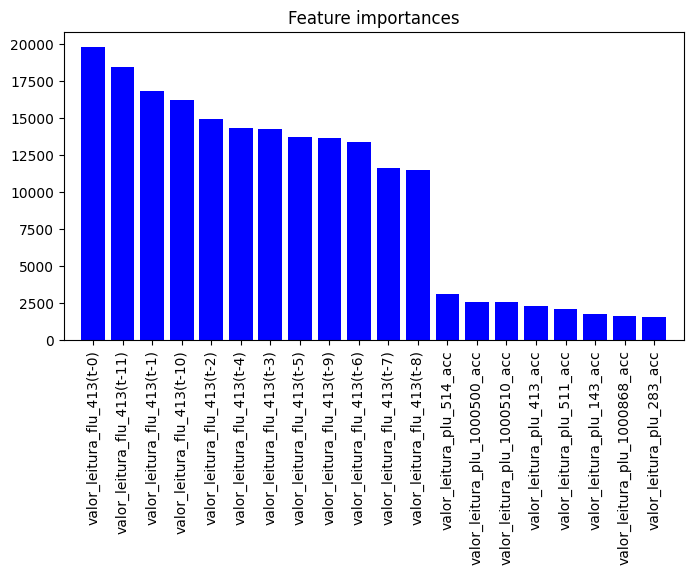

In [189]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm_with_acc_rain.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 40.18168310709868
Average of NSE: 0.84554521121659


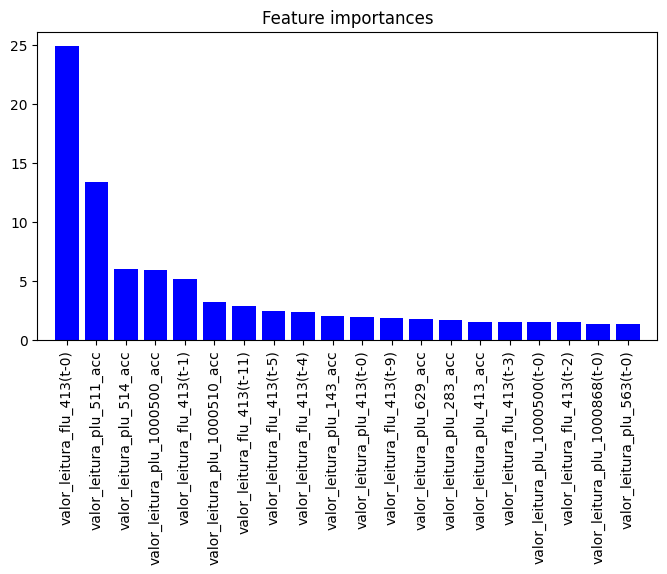

In [182]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [190]:
# Otimizando com Optuna
trial, iterations, learning_rate ,depth, subsample, colsample_bylevel,min_data_in_leaf = run_optuna_cb(n_trials=50)
parameters = {'trial': trial, 'iterations': iterations, 'learning_rate': learning_rate, 'depth': depth, 'subsample': subsample, 'colsample_bylevel': colsample_bylevel, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/cat_boost_with_acc_rain.pkl", "wb")) 
parameters = pickle.load(open("parameters/cat_boost_with_acc_rain.pkl", "rb"))

[I 2024-03-31 00:55:53,995] A new study created in memory with name: no-name-caf9daab-3e9b-4bcd-a9e7-72bc6addfdab
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 00:56:01,939] Trial 0 finished with value: 64.33842920437935 and parameters: {'iterations': 800, 'learning_rate': 0.001100281722625439, 'depth': 7, 'subsample': 0.7613636884116812, 'colsample_bylevel': 0.5235816616874609, 'min_data_in_leaf': 23}. Best is trial 0 with value: 64.33842920437935.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-31 00:56:02,377] Trial 1 finished with value: 41.35168540836806 and parameters: {'iterations': 200, 'learning_rate': 0.033194140233275465, 'depth': 2, 'subsample': 0.13392282346530976, 'colsample_bylevel': 0.7010918274494073, 'min_data_in_leaf': 96}. Best is trial 1 with value: 41.35168540836806.
suggest_int() got {'step'} as positional arguments bu

Average of RMSE: 38.628424006014974
Average of NSE: 0.8572555903002541


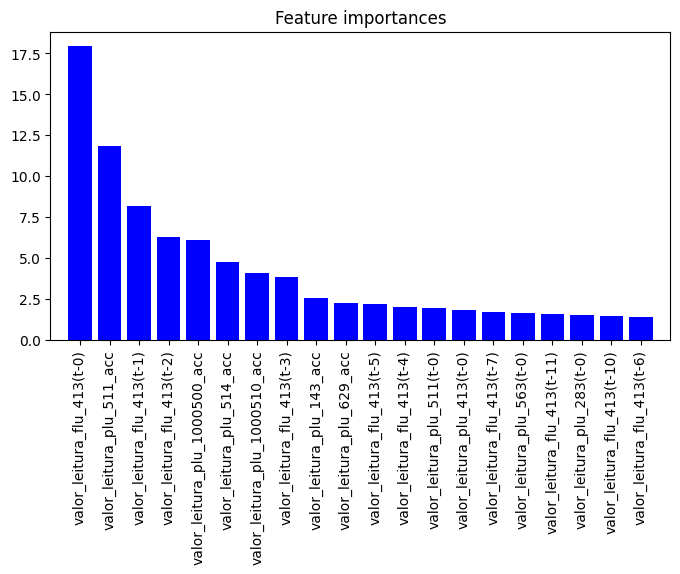

In [191]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost_with_acc_rain.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

### Usando chuva acumulada (2018/2019/2020 --> 2021/2022)

In [175]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019, df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

# Feature engineering: accumulated rain
pluviometric_stations = ['valor_leitura_plu_143','valor_leitura_plu_283','valor_leitura_plu_413','valor_leitura_plu_511','valor_leitura_plu_514','valor_leitura_plu_563','valor_leitura_plu_629','valor_leitura_plu_1000500','valor_leitura_plu_1000510','valor_leitura_plu_1000868']
for station in pluviometric_stations:
    list_columns = [column for column in X_train_general.columns if station in column]
    X_train_general[f'{station}_acc'] = X_train_general[list_columns].sum(axis=1)
    X_val_general[f'{station}_acc'] = X_val_general[list_columns].sum(axis=1)
    X_test_general[f'{station}_acc'] = X_test_general[list_columns].sum(axis=1)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

Average of RMSE: 41.22105318691271
Average of NSE: 0.8374513762720853


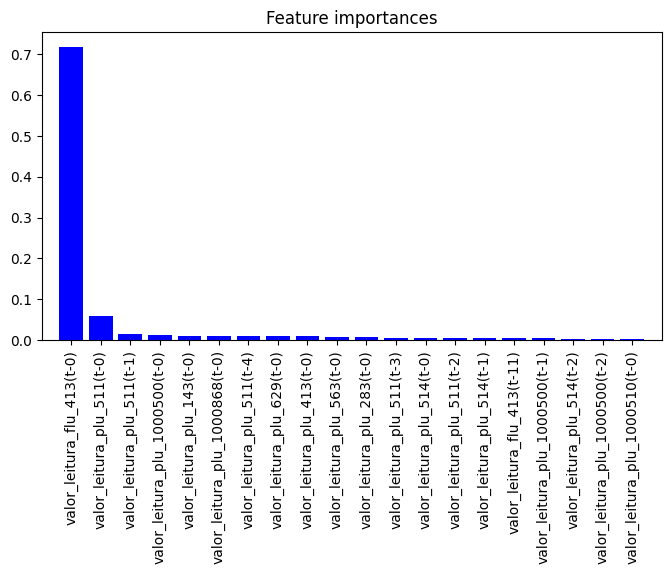

In [ ]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest_with_acc_rain.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 39.68235625759709
Average of NSE: 0.7799098349069289


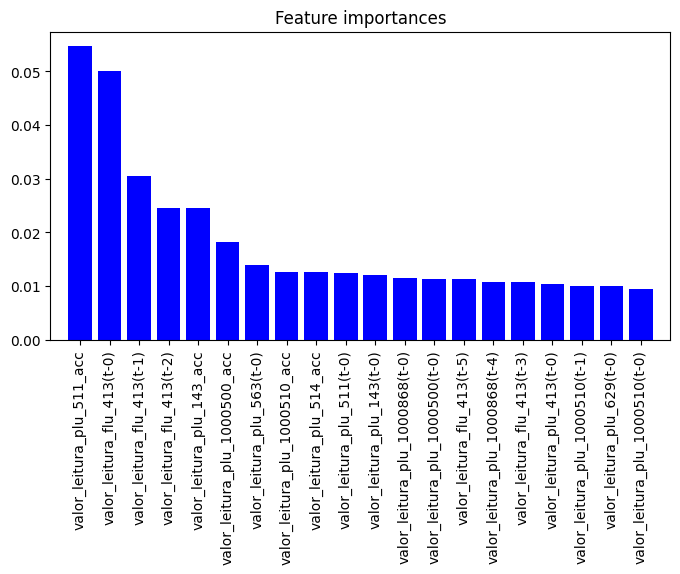

In [174]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost_with_acc_rain.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

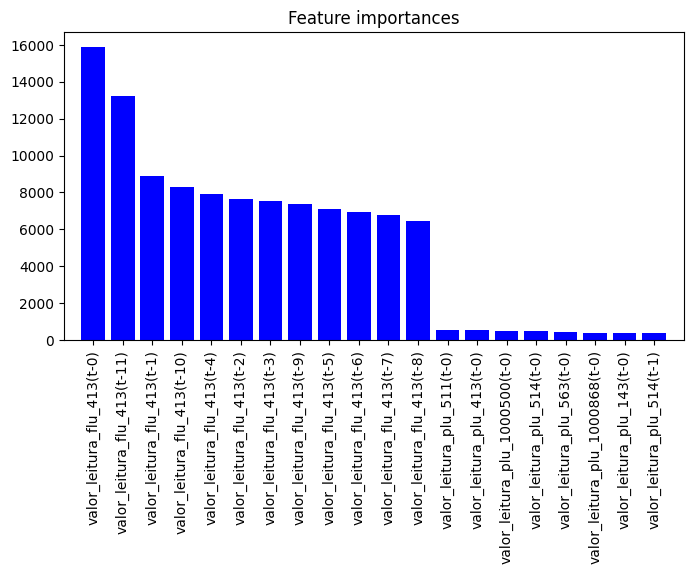

In [ ]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm_with_acc_rain.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 39.51228096563638
Average of NSE: 0.850648588268391


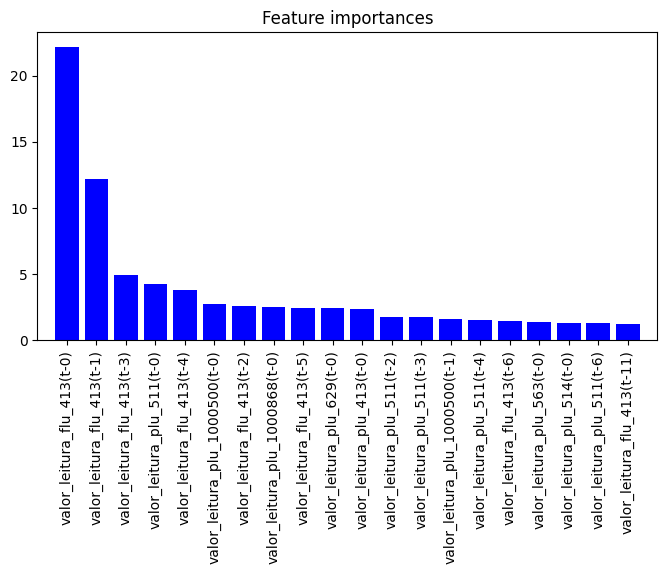

In [ ]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost_with_acc_rain.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

# Experimento de Continuous Learning

### Usando todas as features

In [161]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [162]:
feature_names = X_train_general.columns

Average of RMSE: 41.49677372371826
Average of NSE: 0.8352695841905309


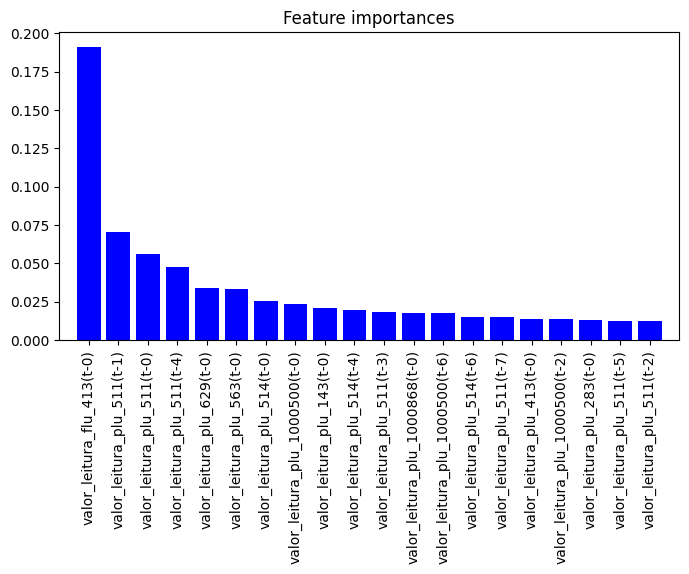

In [163]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [164]:
prediction_final = []
y_val_final = []
for i in range(len(X_val)):
    X_train_new = np.concatenate((X_train, X_val[0:i,:]), axis = 0)
    y_train_new = np.concatenate((y_train, y_val[0:i]), axis = 0)
    X_val_new = X_val[i:,:]
    y_val_new = y_val[i:]
    model, importances = training_xgb(X_train_new,y_train_new)
    prediction = model.predict(X_val_new[0:1,:])
    prediction_final.append(prediction)
    y_val_final.append(y_val_new[0])

In [165]:
prediction_final = np.array(prediction_final).ravel()

In [166]:
y_val_final = np.array(y_val_final)

In [167]:
mse = mean_squared_error(prediction_final, y_val_final)
rmse = np.sqrt(mse)
print('RMSE: ', rmse)
nse = he.evaluator(he.nse, prediction_final, y_val_final)
nse = nse[0]
print('NSE: ', nse)

RMSE:  37.92181913553068
NSE:  0.8624300895752562


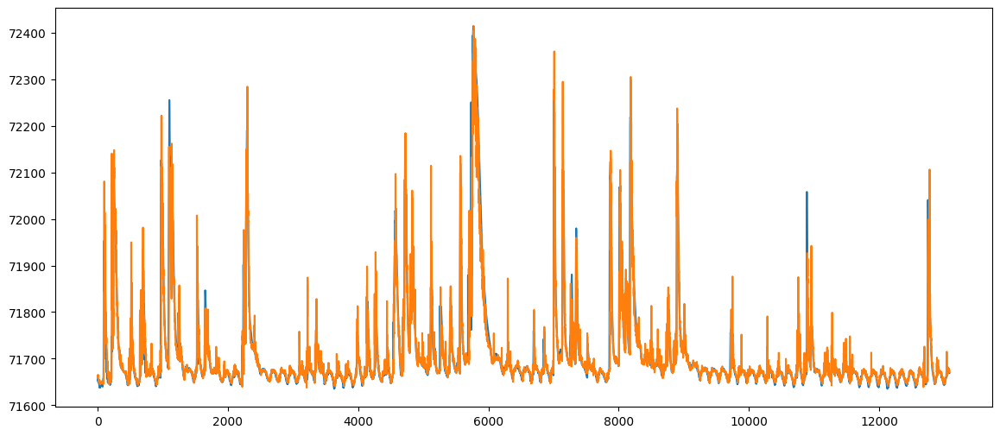

In [169]:
plt.figure(figsize=(14,6))
plt.plot(y_val_final)
plt.plot(prediction_final)

## Novos experimentos de 10 em 10 minutos